In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install torch_geometric
! pip install torch_sparse
! pip install torch_scatter

In [ ]:
import sys
import os

py_file_location = "/.../dgcn"

In [ ]:
sys.path.append(os.path.abspath(py_file_location))

## GET DATA (do not run)

In [ ]:
import argparse

from tqdm import tqdm
import pickle

import utils
from Sample import Sample

log = utils.get_logger()


def split():
    utils.set_seed(100)

    video_ids, video_speakers, video_labels, video_text, \
        video_audio, video_visual, video_sentence, trainVids, \
        test_vids = pickle.load(open('/.../IEMOCAP_features.pkl', 'rb'), encoding='latin1')

    train, dev, test = [], [], []
    dev_size = int(len(trainVids) * 0.1)
    train_vids, dev_vids = trainVids[dev_size:], trainVids[:dev_size]

    for vid in tqdm(train_vids, desc="train"):
        train.append(Sample(vid, video_speakers[vid], video_labels[vid],
                                 video_text[vid], video_audio[vid], video_visual[vid],
                                 video_sentence[vid]))
    for vid in tqdm(dev_vids, desc="dev"):
        dev.append(Sample(vid, video_speakers[vid], video_labels[vid],
                               video_text[vid], video_audio[vid], video_visual[vid],
                               video_sentence[vid]))
    for vid in tqdm(test_vids, desc="test"):
        test.append(Sample(vid, video_speakers[vid], video_labels[vid],
                                video_text[vid], video_audio[vid], video_visual[vid],
                                video_sentence[vid]))
    log.info("train vids:")
    log.info(sorted(train_vids))
    log.info("dev vids:")
    log.info(sorted(dev_vids))
    log.info("test vids:")
    log.info(sorted(test_vids))

    return train, dev, test


In [ ]:
train, dev, test = split()
data = {"train": train, "dev": dev, "test": test}
with open('/.../data_split.pickle', 'wb') as handle:
    pickle.dump(data, handle)

test: 100%|██████████| 31/31 [00:00<00:00, 10398.55it/s]

08/04/2021 02:13:50 train vids:
08/04/2021 02:13:50 ['Ses01F_impro01', 'Ses01F_impro02', 'Ses01F_impro03', 'Ses01F_impro04', 'Ses01F_impro05', 'Ses01F_impro06', 'Ses01F_impro07', 'Ses01F_script01_1', 'Ses01F_script01_2', 'Ses01F_script01_3', 'Ses01F_script02_1', 'Ses01F_script02_2', 'Ses01F_script03_1', 'Ses01F_script03_2', 'Ses01M_impro01', 'Ses01M_impro02', 'Ses01M_impro04', 'Ses01M_impro05', 'Ses01M_impro06', 'Ses01M_impro07', 'Ses01M_script01_1', 'Ses01M_script01_2', 'Ses01M_script01_3', 'Ses01M_script02_1', 'Ses01M_script03_1', 'Ses01M_script03_2', 'Ses02F_impro01', 'Ses02F_impro02', 'Ses02F_impro03', 'Ses02F_impro04', 'Ses02F_impro05', 'Ses02F_impro06', 'Ses02F_impro07', 'Ses02F_impro08', 'Ses02F_script01_2', 'Ses02F_script02_1', 'Ses02F_script02_2', 'Ses02F_script03_1', 'Ses02F_script03_2', 'Ses02M_impro01', 'Ses02M_impro03', 'Ses02M_impro04', 'Ses02M_impro05', 'Ses02M_impro06', 'Ses02M_script01_1', 'Ses02M_script01_2', 'Ses02M_script01_3', 'Ses02M_script02_1', 'Ses02M_script03_

# Dataset + helpers

In [ ]:
import math
import random

class Dataset:

    def __init__(self, samples, batch_size, multim=False, audiovid = False, audiotext=False, textvid=False, exp3=False, decision_level=False):
        self.samples = samples
        self.batch_size = batch_size
        self.num_batches = math.ceil(len(self.samples) / batch_size)
        self.speaker_to_idx = {'M': 0, 'F': 1}
        self.multim = multim
        self.size = 100 if exp3 else 100 if decision_level else 712 if multim else 200 if audiotext else 612 if textvid else 612 if audiovid else 100
        self.audiovid=audiovid
        self.audiotext=audiotext
        self.textvid=textvid
        self.exp3=exp3
        self.decision_level=decision_level

    def __len__(self):
        return self.num_batches

    def __getitem__(self, index):
        batch = self.raw_batch(index)
        return self.padding(batch)

    def raw_batch(self, index):
        assert index < self.num_batches, "batch_idx %d > %d" % (index, self.num_batches)
        batch = self.samples[index * self.batch_size: (index + 1) * self.batch_size]

        return batch

    def padding(self, samples):
        batch_size = len(samples)
        text_len_tensor = torch.tensor([len(s.text) for s in samples]).long()
        mx = torch.max(text_len_tensor).item()
        text_tensor = torch.zeros((batch_size, mx, self.size))
        a_tensor = torch.zeros((batch_size, mx, 100))
        v_tensor = torch.zeros((batch_size, mx, 512))
        audiovid_tensor = torch.zeros((batch_size, mx, 100)) if self.audiotext else torch.zeros((batch_size, mx, 512)) if self.textvid else torch.zeros((batch_size, mx, 612))
       
        speaker_tensor = torch.zeros((batch_size, mx)).long()
        labels = []
        n_utterances = 0
        for i, s in enumerate(samples):
            cur_len = len(s.text)
            n_utterances += cur_len
            tmp = [torch.from_numpy(t).float() for t in s.text]
            tmp_vid = [torch.from_numpy(t).float() for t in s.visual]
            tmp_aud = [torch.from_numpy(t).float() for t in s.audio]
            tmp = torch.stack(tmp)
            tmp_vid = torch.stack(tmp_vid)
            tmp_aud = torch.stack(tmp_aud)
            if i ==0:
              video_tensor = tmp_vid
              audio_tensor = tmp_aud
            else:
              video_tensor = torch.cat((video_tensor, tmp_vid), 0)
              audio_tensor = torch.cat((audio_tensor, tmp_aud), 0)

            if self.multim:
                aud = torch.tensor(s.audio)
                vid = torch.tensor(s.visual)
                tmp=torch.cat((tmp, vid, aud), 1)
            elif self.audiovid and not self.exp3 and not self.decision_level:
                aud = torch.tensor(s.audio)
                vid = torch.tensor(s.visual)
                tmp=torch.cat((vid, aud), 1)
            elif self.audiotext and not self.exp3 and not self.decision_level:
                aud = torch.tensor(s.audio)
                tmp=torch.cat((tmp,aud), 1)
            elif self.textvid and not self.exp3 and not self.decision_level:
                vid = torch.tensor(s.visual)
                tmp=torch.cat((tmp,vid), 1)

            audvid = torch.cat((tmp_vid, tmp_aud), 1)
            if self.textvid:
              audiovid_tensor[i, :cur_len, :] = tmp_vid
            elif self.audiotext:
              audiovid_tensor[i, :cur_len, :] = tmp_aud
            else:
              audiovid_tensor[i, :cur_len, :] = audvid
            text_tensor[i, :cur_len, :] = tmp
            a_tensor[i, :cur_len, :] = tmp_aud
            v_tensor[i, :cur_len, :] = tmp_vid
            speaker_tensor[i, :cur_len] = torch.tensor([self.speaker_to_idx[c] for c in s.speaker])
            labels.extend(s.label)
        #video_tensor = torch.zeros((n_utterances, 512)) #added <- should be size(num_utterances in batch, vec_dim)
        #audio_tensor = torch.zeros((n_utterances, 100)) #added <- same as above
        
        label_tensor = torch.tensor(labels).long()
        data = {
            "text_len_tensor": text_len_tensor,
            "text_tensor": text_tensor,
            "speaker_tensor": speaker_tensor,
            "label_tensor": label_tensor,
            "video_tensor": video_tensor,
            "audio_tensor": audio_tensor,
            "audiovid_tensor":audiovid_tensor,
            "audio": a_tensor,
            "video": v_tensor

        }
        
        return data

    def shuffle(self):
        random.shuffle(self.samples)

# MODEL

In [ ]:
import torch.nn as nn
from torch_geometric.nn import RGCNConv, GraphConv


class GCN(nn.Module):
    '''
    g_dim: number of features
    h1_dim: hidden size
    '''

    def __init__(self, g_dim, h1_dim, h2_dim, args):
        super(GCN, self).__init__()
        self.num_relations = 2 * args.n_speakers ** 2
        self.conv1 = RGCNConv(g_dim, h1_dim, self.num_relations, num_bases=30)
        self.conv2 = GraphConv(h1_dim, h2_dim)

    def forward(self, node_features, edge_index, edge_norm, edge_type):
        x = self.conv1(node_features, edge_index, edge_type) #edge_norm
        x = self.conv2(x, edge_index)

        return x

In [ ]:
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence


class SeqContext(nn.Module):

    def __init__(self, u_dim, g_dim, args):
        super(SeqContext, self).__init__()
        self.input_size = u_dim
        self.hidden_dim = g_dim
        
        self.rnn = nn.GRU(self.input_size, self.hidden_dim // 2, dropout=args.drop_rate,
                              bidirectional=True, num_layers=2, batch_first=True)

    def forward(self, text_len_tensor, text_tensor):
        packed = pack_padded_sequence(
            text_tensor,
            text_len_tensor,
            batch_first=True,
            enforce_sorted=False
        )
        out, _ = self.rnn(packed, None)
        
        out, _ = pad_packed_sequence(out, batch_first=True)

        return out

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import utils

log = utils.get_logger()


class EdgeAtt(nn.Module):

    def __init__(self, g_dim, args):
        super(EdgeAtt, self).__init__()
        self.device = args.device
        self.wp = args.wp
        self.wf = args.wf

        self.weight = nn.Parameter(torch.zeros((g_dim, g_dim)).float(), requires_grad=True)
        var = 2. / (self.weight.size(0) + self.weight.size(1))
        self.weight.data.normal_(0, var)

    def forward(self, node_features, text_len_tensor, edge_ind):
        batch_size, mx_len = node_features.size(0), node_features.size(1)
        alphas = []

        weight = self.weight.unsqueeze(0).unsqueeze(0)
        att_matrix = torch.matmul(weight, node_features.unsqueeze(-1)).squeeze(-1)  # [B, L, D_g]
        for i in range(batch_size):
            cur_len = text_len_tensor[i].item()
            alpha = torch.zeros((mx_len, 110)).to(self.device)
            for j in range(cur_len):
                s = j - self.wp if j - self.wp >= 0 else 0
                e = j + self.wf if j + self.wf <= cur_len - 1 else cur_len - 1
                tmp = att_matrix[i, s: e + 1, :]  # [L', D_g]
                feat = node_features[i, j]  # [D_g]
                score = torch.matmul(tmp, feat)
                probs = F.softmax(score)  # [L']
                alpha[j, s: e + 1] = probs
            alphas.append(alpha)

        return alphas


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import utils

log = utils.get_logger()


class Classifier(nn.Module):
    def __init__(self, input_dim, hidden_size, tag_size, args):
        super(Classifier, self).__init__()
        self.emotion_att = MaskedEmotionAtt(input_dim)
        self.lin1 = nn.Linear(input_dim, hidden_size)
        self.drop = nn.Dropout(args.drop_rate)
        self.lin2 = nn.Linear(hidden_size, tag_size)
        self.lin3 = nn.Linear(200, 100)
        self.lin4 = nn.Linear(100, tag_size)
        self.loss_weights = torch.tensor([1 / 0.086747, 1 / 0.144406, 1 / 0.227883,
                                              1 / 0.160585, 1 / 0.127711, 1 / 0.252668]).to(args.device)
        self.nll_loss = nn.NLLLoss(self.loss_weights)
       

    def get_prob(self, h, text_len_tensor): #similarity-based attention mechanism 
      
        hidden = self.drop(F.relu(self.lin1(h)))
        if args.exp1 or args.exp3:
          scores = self.drop(F.relu(self.lin3(hidden)))
          scores = self.lin4(scores)
        else:
          scores = self.lin2(hidden)
        log_prob = F.log_softmax(scores, dim=-1)

        return log_prob

    def forward(self, h, text_len_tensor):
        log_prob = self.get_prob(h, text_len_tensor)
        y_hat = torch.argmax(log_prob, dim=-1)

        return y_hat

    def get_loss(self, h, label_tensor, text_len_tensor):
        log_prob = self.get_prob(h, text_len_tensor)
        loss = self.nll_loss(log_prob, label_tensor)

        return loss


class MaskedEmotionAtt(nn.Module):

    def __init__(self, input_dim):
        super(MaskedEmotionAtt, self).__init__()
        self.lin = nn.Linear(input_dim, input_dim)

    def forward(self, h, text_len_tensor):
        batch_size = text_len_tensor.size(0)
        x = self.lin(h)  # [node_num, H]
        ret = torch.zeros_like(h)
        s = 0
        for bi in range(batch_size):
            cur_len = text_len_tensor[bi].item()
            y = x[s: s + cur_len]
            z = h[s: s + cur_len]
            scores = torch.mm(z, y.t())  # [L, L]
            probs = F.softmax(scores, dim=1)
            out = z.unsqueeze(0) * probs.unsqueeze(-1)  # [1, L, H] x [L, L, 1] --> [L, L, H]
            out = torch.sum(out, dim=1)  # [L, H]
            ret[s: s + cur_len, :] = out
            s += cur_len

        return ret


In [ ]:
class GRU(nn.Module):
    def __init__(self, input_dim, output_dim, args):
        super(GRU, self).__init__()
        self.input_size = input_dim
        self.hidden_dim = output_dim
      
        self.rnn = nn.GRU(self.input_size, self.hidden_dim // 2, dropout=args.drop_rate,
                              bidirectional=True, num_layers=2, batch_first=True)

    def forward(self, textlen_tensor, input_tensor):
        packed = pack_padded_sequence(
            input_tensor,
            textlen_tensor,
            batch_first=True,
            enforce_sorted=False
        )
        out, _ = self.rnn(packed, None)
        out, _ = pad_packed_sequence(out, batch_first=True)

        return out
    
    def unpad(self, out, lengths, device):
      batch_size = out.size(0)
      features = []

      for j in range(batch_size):
          cur_len = lengths[j].item()
          features.append(out[j, :cur_len, :])
      
      features = torch.cat(features, dim=0).to(device)  # [E, D_g]
    
      return features

In [ ]:
import torch
import torch.nn as nn
import utils

log = utils.get_logger()


class DialogueGCN_DL(nn.Module):

    def __init__(self, args):
        super(DialogueGCN_DL, self).__init__()
        t_dim = 100 #dimensionality of an input (feature vectors)
        v_dim = 512
        a_dim = 100
        g_dim = 300 # dimensionality of g vectors
        # GCN dimensions
        h1_dim = 300
        h2_dim = 100
        hc_dim = 100
        tag_size = 6

        self.dbl=False
        self.wp = args.wp
        self.wf = args.wf
        self.device = args.device
        
        self.audiovid = args.audiovid
        self.textvid = args.textvid
        self.audiotext = args.audiotext

        self.AUDIOrnn = SeqContext(a_dim, 100, args)
        self.VIDEOrnn = SeqContext(v_dim, 100, args)
        self.TEXTrnn = SeqContext(t_dim, 100, args)

        self.edge_att = EdgeAtt(g_dim, args)
        self.edge_att_dbl = EdgeAtt(200, args)
        self.gcn = GCN(300, h1_dim, h2_dim, args) 
        self.gcn_dbl = GCN(200, h1_dim, h2_dim, args)
        self.ext_context = GRU(612,200, args)
        

        self.clf = Classifier(g_dim + h2_dim, hc_dim, tag_size, args)
        self.clf_dbl = Classifier(200 + h2_dim, hc_dim, tag_size, args)

        edge_type_to_idx = {}
        for j in range(args.n_speakers):
            for k in range(args.n_speakers):
                edge_type_to_idx[str(j) + str(k) + '0'] = len(edge_type_to_idx)
                edge_type_to_idx[str(j) + str(k) + '1'] = len(edge_type_to_idx)
        self.edge_type_to_idx = edge_type_to_idx
        log.debug(self.edge_type_to_idx)

    def get_rep(self, data):
        text_features = self.TEXTrnn(data["text_len_tensor"], data["text_tensor"]) # [batch_size, mx_len, D_g]
        audio_features = self.AUDIOrnn(data["text_len_tensor"], data["audio"]) # [batch_size, mx_len, D_g]
        video_features = self.VIDEOrnn(data["text_len_tensor"], data["video"]) # [batch_size, mx_len, D_g]
        if self.audiovid:
          self.dbl=True
          node_features = torch.cat([video_features, audio_features], dim=-1)
        elif self.textvid:
          self.dbl=True
          node_features = torch.cat([text_features, video_features], dim=-1)
        elif self.audiotext:
          self.dbl=True
          node_features = torch.cat([text_features, audio_features], dim=-1)
        else:
          node_features = torch.cat([text_features, video_features, audio_features], dim=-1)
        if self.dbl:
          features, edge_index, edge_norm, edge_type, edge_index_lengths = batch_graphify(
            node_features, data["text_len_tensor"], data["speaker_tensor"], self.wp, self.wf,
            self.edge_type_to_idx, self.edge_att_dbl, self.device)
        else:
          features, edge_index, edge_norm, edge_type, edge_index_lengths = batch_graphify(
              node_features, data["text_len_tensor"], data["speaker_tensor"], self.wp, self.wf,
              self.edge_type_to_idx, self.edge_att, self.device)
        if self.dbl:
          graph_out = self.gcn_dbl(features, edge_index, edge_norm, edge_type)
        else:
          graph_out = self.gcn(features, edge_index, edge_norm, edge_type)

        return graph_out, features

    def forward(self, data):
        graph_out, features = self.get_rep(data)
        if self.dbl:
          out = self.clf_dbl(torch.cat([features, graph_out], dim=-1), data["text_len_tensor"])
        else:
          out = self.clf(torch.cat([features, graph_out], dim=-1), data["text_len_tensor"])
        return out

    def get_loss(self, data):
        graph_out, features = self.get_rep(data)
        if self.dbl:
          loss = self.clf_dbl.get_loss(torch.cat([features, graph_out], dim=-1),
                              data["label_tensor"], data["text_len_tensor"])
        else:
          loss = self.clf.get_loss(torch.cat([features, graph_out], dim=-1),
                              data["label_tensor"], data["text_len_tensor"])

        return loss

In [ ]:
import torch
import torch.nn as nn

#from .SeqContext import SeqContext
#from .EdgeAtt import EdgeAtt
#from .GCN import GCN
#from .Classifier import Classifier
#from .functions import batch_graphify
import utils

log = utils.get_logger()


class DialogueGCN(nn.Module):

    def __init__(self, args):
        super(DialogueGCN, self).__init__()
        u_dim = 100 if args.exp3 else 712 if args.multim else 612 if args.audiovid else 612 if args.textvid else 200 if args.audiotext else 100 #dimensionality of an input (feature vectors)
        g_dim = 200 # dimensionality of g vectors
        # GCN dimensions
        h1_dim = 100
        h2_dim = 100
        hc_dim = 100
        tag_size = 6

        self.wp = args.wp
        self.wf = args.wf
        self.device = args.device
        self.exp1 = args.exp1
        self.exp3 = args.exp3
        self.audio_only = args.audio_only
        self.vid_only = args.vid_only
        self.audiovid = args.audiovid
        self.textvid = args.textvid
        self.audiotext = args.audiotext

        self.rnn = SeqContext(u_dim, g_dim, args)
        self.edge_att = EdgeAtt(g_dim, args)
        self.gcn = GCN(g_dim, h1_dim, h2_dim, args)
        self.ext_context = GRU(512,200, args) if self.textvid else GRU(100,200, args) if self.audiotext else GRU(612,200, args)
        self.rnn_vid = SeqContext(512, g_dim, args)

        if self.exp1:
          hc_dim = 200
          self.clf = Classifier(g_dim + h2_dim + 512 + 100, hc_dim, tag_size, args) # changed to accomodate exp1
        elif self.exp3:
          hc_dim = 200
          self.clf = Classifier(g_dim + h2_dim + 200, hc_dim, tag_size, args ) # accomodating exp3
        else:
          self.clf = Classifier(g_dim + h2_dim, hc_dim, tag_size, args)

        edge_type_to_idx = {}
        for j in range(args.n_speakers):
            for k in range(args.n_speakers):
                edge_type_to_idx[str(j) + str(k) + '0'] = len(edge_type_to_idx)
                edge_type_to_idx[str(j) + str(k) + '1'] = len(edge_type_to_idx)
        self.edge_type_to_idx = edge_type_to_idx
        log.debug(self.edge_type_to_idx)

    def get_rep(self, data):
      if self.exp3:
        node_features = self.rnn(data["text_len_tensor"], data["text_tensor"])
      if self.audio_only:
          node_features = self.rnn(data["text_len_tensor"], data["audio"])
      elif self.vid_only:
          node_features = self.rnn_vid(data["text_len_tensor"], data["video"])
      else:
        node_features = self.rnn(data["text_len_tensor"], data["text_tensor"]) # [batch_size, mx_len, D_g]

      features, edge_index, edge_norm, edge_type, edge_index_lengths = batch_graphify(
            node_features, data["text_len_tensor"], data["speaker_tensor"], self.wp, self.wf,
            self.edge_type_to_idx, self.edge_att, self.device)

      graph_out = self.gcn(features, edge_index, edge_norm, edge_type)

      return graph_out, features

    def forward(self, data):
        graph_out, features = self.get_rep(data)
        if self.exp1:
            dat = torch.cat([features, graph_out, data['video_tensor'], data['audio_tensor']], dim=-1)
            out = self.clf(torch.cat([features, graph_out, data['video_tensor'], data['audio_tensor']], dim=-1), data["text_len_tensor"]) 

        elif self.exp3:
            rnn_out = self.ext_context(data['text_len_tensor'],data['audiovid_tensor'])
            rnn_features = self.ext_context.unpad(rnn_out, data['text_len_tensor'], self.device)
            out = self.clf(torch.cat([features, graph_out, rnn_features],dim=-1), data["text_len_tensor"])

        else:
            out = self.clf(torch.cat([features, graph_out], dim=-1), data["text_len_tensor"])
        return out

    def get_loss(self, data):
        graph_out, features = self.get_rep(data)

        if self.exp1:
          loss = self.clf.get_loss(torch.cat([features, graph_out, data['video_tensor'], data['audio_tensor']], dim=-1), 
                                    data["label_tensor"], data["text_len_tensor"])
        elif self.exp3:
            rnn_out = self.ext_context(data['text_len_tensor'],data["audiovid_tensor"])
            rnn_features = self.ext_context.unpad(rnn_out, data['text_len_tensor'], self.device)
            loss = self.clf.get_loss(torch.cat([features, graph_out, rnn_features], dim=-1),
                                     data['label_tensor'], torch.tensor([612], device=args.device) )
        else:

            loss = self.clf.get_loss(torch.cat([features, graph_out], dim=-1),
                                 data["label_tensor"], data["text_len_tensor"])

        return loss

#Coach+Optim+Arg


In [ ]:
import torch.optim as optim
from torch.nn.utils import clip_grad_value_


class Optim:

    def __init__(self, lr, max_grad_value, weight_decay):
        self.lr = lr
        self.max_grad_value = max_grad_value
        self.weight_decay = weight_decay
        self.params = None
        self.optimizer = None

    def set_parameters(self, params, name):
        self.params = list(params)
        if name == "sgd":
            self.optimizer = optim.SGD(self.params, lr=self.lr, weight_decay=self.weight_decay)
        elif name == "rmsprop":
            self.optimizer = optim.RMSprop(self.params, lr=self.lr, weight_decay=self.weight_decay)
        elif name == "adam":
            self.optimizer = optim.Adam(self.params, lr=self.lr, weight_decay=self.weight_decay)

    def step(self):
        if self.max_grad_value != -1:
            clip_grad_value_(self.params, self.max_grad_value)
        self.optimizer.step()

    def load_state_dict(self, state_dict):
        self.optimizer.load_state_dict(state_dict)

In [ ]:
import copy
import time

import numpy as np
import torch
from tqdm import tqdm
from sklearn import metrics

import utils

log = utils.get_logger()


class Coach:

    def __init__(self, trainset, devset, testset, model, opt, args):
        self.trainset = trainset
        self.devset = devset
        self.testset = testset
        self.model = model
        self.opt = opt
        self.args = args
        self.label_to_idx = {'hap': 0, 'sad': 1, 'neu': 2, 'ang': 3, 'exc': 4, 'fru': 5}
        self.best_dev_f1 = None
        self.best_epoch = None
        self.best_state = None
        self.train_hist = {'loss': [], 'f1': [], 'acc': []}
        self.dev_hist = {'loss': [], 'f1': [], 'acc': []}
        self.test_hist = {'loss': [], 'f1': [], 'acc': []}

    def load_ckpt(self, ckpt):
        self.best_dev_f1 = ckpt["best_dev_f1"]
        self.best_epoch = ckpt["best_epoch"]
        self.best_state = ckpt["best_state"]
        self.model.load_state_dict(self.best_state)

    def train(self):
        log.debug(self.model)
        # Early stopping.
        best_dev_f1, best_epoch, best_state = self.best_dev_f1, self.best_epoch, self.best_state

        # Train
        for epoch in range(1, self.args.epochs + 1):
            self.train_epoch(epoch)
            dev_f1, dev_loss, dev_acc = self.evaluate()
            #log.info("[Dev set] [f1 {:.4f}]".format(dev_f1))
            self.dev_hist['f1'].append(dev_f1)
            self.dev_hist['loss'].append(dev_loss)
            self.dev_hist['acc'].append(dev_acc)

            if best_dev_f1 is None or dev_f1 > best_dev_f1:
                best_dev_f1 = dev_f1
                best_epoch = epoch
                best_state = copy.deepcopy(self.model.state_dict())
                log.info("Save the best model.")

            
            #log.info("[Test set] [f1 {:.4f}]".format(test_f1))
            train_f1, train_loss, train_acc = self.evaluate(train=True)
            self.train_hist['f1'].append(train_f1)
            self.train_hist['loss'].append(train_loss)
            self.train_hist['acc'].append(train_acc)


        # Log statistics of the best model
        self.model.load_state_dict(best_state)
        #log.info("")
        #log.info("Best in epoch {}:".format(best_epoch))
        dev_f1, dev_loss, dev_acc = self.evaluate()
        #log.info("[Dev set] [f1 {:.4f}]".format(dev_f1))
      
        return best_dev_f1, best_epoch, best_state

    def train_epoch(self, epoch):
        start_time = time.time()
        epoch_loss = 0
        self.model.train()
        # for idx in tqdm(np.random.permutation(len(self.trainset)), desc="train epoch {}".format(epoch)):
        # self.trainset.shuffle()
        for idx in tqdm(range(len(self.trainset)), desc="train epoch {}".format(epoch)):
            self.model.zero_grad()
            data = self.trainset[idx]
            for k, v in data.items():
                data[k] = v.to(self.args.device)
            nll = self.model.get_loss(data)
            epoch_loss += nll.item()
            nll.backward()
            self.opt.step()

        end_time = time.time()
        #log.info("")
        #log.info("[Epoch %d] [Loss: %f] [Time: %f]" %
                 #(epoch, epoch_loss, end_time - start_time))
      

    def evaluate(self, test=False, train = False):
        dataset = self.testset if test else self.trainset if train else self.devset
        self.model.eval()
        with torch.no_grad():
            golds = []
            preds = []
            epoch_loss = 0
            for idx in tqdm(range(len(dataset)), desc="test" if test else "dev"):
                data = dataset[idx]
                golds.append(data["label_tensor"])
                for k, v in data.items():
                    data[k] = v.to(self.args.device)
                y_hat = self.model(data)
                nll = self.model.get_loss(data)
                epoch_loss += nll.item()
                preds.append(y_hat.detach().to("cpu"))

            golds = torch.cat(golds, dim=-1).numpy()
            preds = torch.cat(preds, dim=-1).numpy()
            f1 = metrics.f1_score(golds, preds, average="weighted")
            acc = metrics.accuracy_score(golds, preds)
            
        return f1, epoch_loss, acc

In [ ]:
class arguments():
    def __init__(self, data,from_begin=True, device='cpu',epochs=1,batch_size=32, optimizer='adam', learning_rate=0.0001, weight_decay=1e-8, max_grad_value=1, drop_rate= 0.5,
                 wp = 10, wf = 10, n_speakers=2, hidden_size=100, rnn = 'lstm', class_weight=False, multim=False, exp1=False, exp3=False, decision_level=False,
                 audio_only = False, vid_only=False, audiovid=False, audiotext=False, textvid=False):
        self.data = data # data_path
        self.from_begin = from_begin
        self.device = device
        self.epochs = epochs
        self.batch_size = batch_size
        self.optimizer = optimizer
        self.learning_rate = learning_rate
        self.weight_decay = weight_decay
        self.max_grad_value = max_grad_value
        self.drop_rate = drop_rate
        self.wp=wp
        self.wf=wf
        self.n_speakers=n_speakers
        self.hidden_size=hidden_size
        self.rnn = rnn
        self.seed = 100
        self.class_weight = class_weight
        self.multim = multim
        self.exp1=exp1
        self.exp3=exp3
        self.decision_level = decision_level
        self.audio_only= audio_only
        self.vid_only= vid_only
        self.audiovid = audiovid
        self.audiotext = audiotext
        self.textvid = textvid
    

#TRAIN

In [ ]:
def main(args):
    utils.set_seed(args.seed)

    # load data
    log.debug("Loading data from '%s'." % args.data)
    data = utils.load_pkl(args.data)
    log.info("Loaded data.")

    trainset = Dataset(data["train"], args.batch_size, multim=args.multim, audiovid=args.audiovid, audiotext=args.audiotext, textvid=args.textvid, exp3=args.exp3, decision_level = args.decision_level)
    devset = Dataset(data["dev"], args.batch_size, multim=args.multim, audiovid=args.audiovid, audiotext=args.audiotext, textvid=args.textvid, exp3=args.exp3, decision_level = args.decision_level)
    testset = Dataset(data["test"], args.batch_size, multim=args.multim, audiovid=args.audiovid, audiotext=args.audiotext, textvid=args.textvid, exp3=args.exp3, decision_level = args.decision_level)

    log.debug("Building model...")
    model_file = '/.../model.pt'
    model = DialogueGCN_DL(args).to(args.device) if args.decision_level else DialogueGCN(args).to(args.device)

    opt = Optim(args.learning_rate, args.max_grad_value, args.weight_decay)
    opt.set_parameters(model.parameters(), args.optimizer)

    coach = Coach(trainset, devset, testset, model, opt, args)
    if not args.from_begin:
        ckpt = torch.load(model_file)
        coach.load_ckpt(ckpt)

    # Train.
    log.info("Start training...")
    ret = coach.train()

    # Save.
    checkpoint = {
        "best_dev_f1": ret[0],
        "best_epoch": ret[1],
        "best_state": ret[2],
    }
    torch.save(checkpoint, model_file)

    return coach


In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def confusion_mat(y, y_pred, zero_diag: bool = False): 
  
  matrix = confusion_matrix(y, y_pred)
  labels = ['happy','sad', 'neutral', 'angry', 'excited', 'frustrated']

  # Plot
  if zero_diag == True:
      np.fill_diagonal(matrix, 0)

  fig, ax = plt.subplots(figsize = (10,8))
  figure = sns.heatmap(matrix, annot = True, fmt = "d", ax = ax)
  ax.set_xticklabels(labels, rotation = 90, fontsize = 15)
  ax.set_yticklabels(labels, rotation = 0, fontsize = 15)
  ax.set_xlabel("Predicted label", fontsize = 15)
  ax.set_ylabel("True label", fontsize = 15)
  plt.title("Confusion matrix", fontsize = 20)
  plt.show()

  return matrix

def evaluate_model(coach, train = False, dev= False):

  model = coach.model
  dataset = coach.trainset if train else coach.devset if dev else coach.testset
  model.eval()
  with torch.no_grad():
    golds = []
    preds = []
    epoch_loss = 0
    for idx in tqdm(range(len(dataset)), desc="train" if train else "dev" if dev else 'test'):
        data = dataset[idx]
        golds.append(data["label_tensor"])
        for k, v in data.items():
            data[k] = v.to(args.device)
        y_hat = model(data)
        nll = model.get_loss(data)
        epoch_loss += nll.item()
        preds.append(y_hat.detach().to("cpu"))

    golds = torch.cat(golds, dim=-1).numpy()
    preds = torch.cat(preds, dim=-1).numpy()

    # confusion matrix
    pl = confusion_mat(golds, preds)

   
    sns.set(style="white", font_scale=1.5)

    # loss plot
    plt.figure(figsize=(10,7))
    plt.plot(coach.dev_hist['loss'], label= 'dev')
    plt.plot(coach.train_hist['loss'], label = 'train')
    plt.plot(coach.test_hist['loss'], label = 'test')
    plt.legend()
    plt.xlabel("epoch")
    plt.ylabel("loss")
    plt.title('Loss during training')
    plt.show()

    # f1 score plot
    plt.figure(figsize=(10,7))
    plt.plot(coach.dev_hist['f1'], label= 'dev')
    plt.plot(coach.train_hist['f1'], label = 'train')
    plt.plot(coach.test_hist['f1'], label = 'test')
    plt.legend()
    plt.xlabel("epoch")
    plt.ylabel("f1 score")
    plt.title('f1 score during training')
    plt.show()


    # accuracy plot
    plt.figure(figsize=(10,7))
    plt.plot(coach.dev_hist['acc'], label='dev')
    plt.plot(coach.train_hist['acc'], label='train')
    plt.plot(coach.test_hist['acc'], label='test')
    plt.xlabel("epoch")
    plt.ylabel("accuracy")
    plt.title('Accuracy score during training')
    plt.legend()
    plt.show()

    # DEV RESULTS
    dev_f, dev_loss, dev_acc = coach.evaluate(test=False)
    log.info("DEVSET RESULTS: [F1_score: %f] [Loss: %f] [Acc: %f]" %
                 (dev_f, dev_loss, dev_acc))

    # TEST RESULTS
    test_f, test_loss, test_acc = coach.evaluate(test=True)
    log.info("DEVSET RESULTS: [F1_score: %f] [Loss: %f] [Acc: %f]" %
                 (test_f, test_loss, test_acc))

  return golds, preds

def get_preds(coach, train = False, dev= False):

  model = coach.model
  dataset = coach.trainset if train else coach.devset if dev else coach.testset
  model.eval()
  with torch.no_grad():
    golds = []
    preds = []
    epoch_loss = 0
    for idx in tqdm(range(len(dataset)), desc="train" if train else "dev" if dev else 'test'):
        data = dataset[idx]
        golds.append(data["label_tensor"])
        for k, v in data.items():
            data[k] = v.to(args.device)
        y_hat = model(data)
        nll = model.get_loss(data)
        epoch_loss += nll.item()
        preds.append(y_hat.detach().to("cpu"))

    golds = torch.cat(golds, dim=-1).numpy()
    preds = torch.cat(preds, dim=-1).numpy()
  return golds, preds

## TRAIN - original

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
target_names = ['happy','sad', 'neutral', 'angry', 'excited', 'frustrated']

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, exp3=False, exp1=False)

In [ ]:
coach = main(args)

09/11/2021 05:51:53 Loaded data.
09/11/2021 05:51:53 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/11/2021 05:52:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 05:52:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 05:52:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/11/2021 05:52:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 05:52:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/11/2021 05:53:44 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 05:53:58 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 05:54:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 05:55:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 05:55:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 05:56:11 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 05:56:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 05:56:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

09/11/2021 05:56:55 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 05:57:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 05:57:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 05:58:08 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 05:58:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 05:58:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 05:58:53 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 05:59:08 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 05:59:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

09/11/2021 05:59:37 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 05:59:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 06:00:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

09/11/2021 06:00:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 06:01:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

09/11/2021 06:01:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 06:01:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


test: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


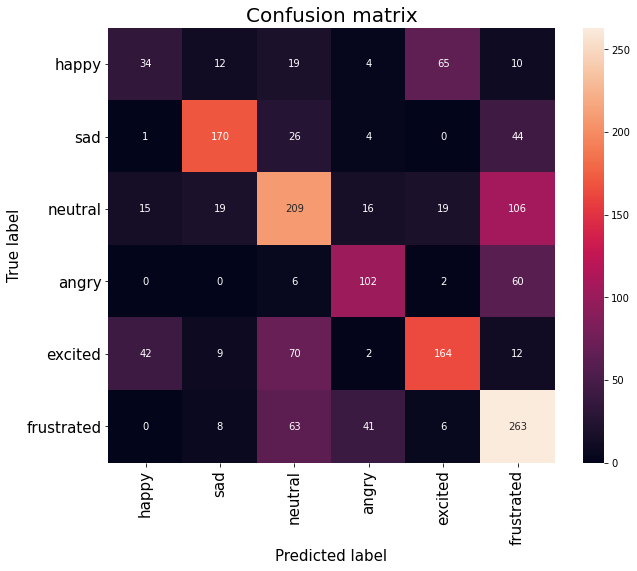

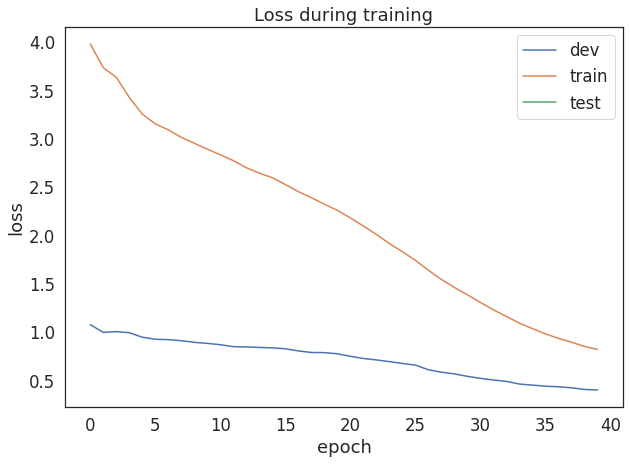

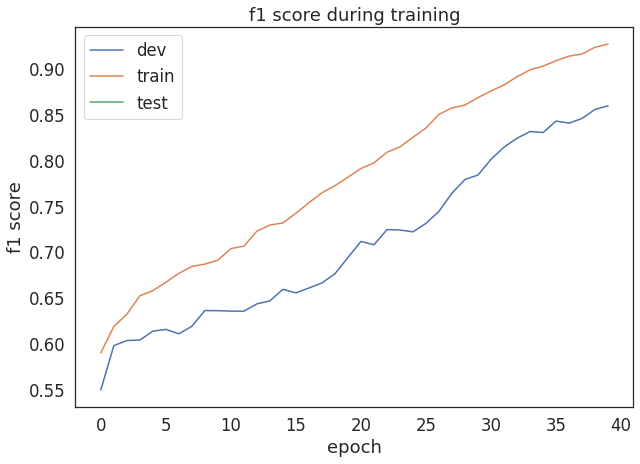

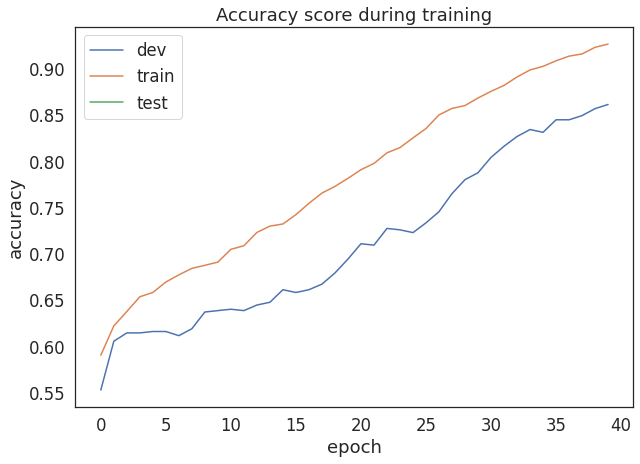

dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/10/2021 09:17:01 DEVSET RESULTS: [F1_score: 0.859505] [Loss: 0.397743] [Acc: 0.861446]



test: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]

09/10/2021 09:17:03 DEVSET RESULTS: [F1_score: 0.576565] [Loss: 1.231622] [Acc: 0.580407]


In [ ]:
golds, preds = evaluate_model(coach)

###TESTSET results analysis

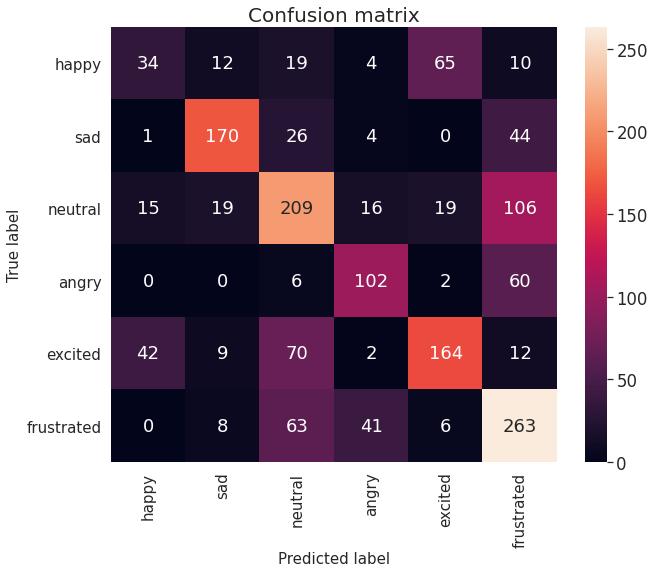

array([[ 34,  12,  19,   4,  65,  10],
       [  1, 170,  26,   4,   0,  44],
       [ 15,  19, 209,  16,  19, 106],
       [  0,   0,   6, 102,   2,  60],
       [ 42,   9,  70,   2, 164,  12],
       [  0,   8,  63,  41,   6, 263]])

In [ ]:
confusion_mat(golds, preds)

In [ ]:
print(classification_report(golds, preds, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.37      0.24      0.29       144
         sad       0.78      0.69      0.73       245
     neutral       0.53      0.54      0.54       384
       angry       0.60      0.60      0.60       170
     excited       0.64      0.55      0.59       299
  frustrated       0.53      0.69      0.60       381

    accuracy                           0.58      1623
   macro avg       0.58      0.55      0.56      1623
weighted avg       0.58      0.58      0.58      1623



### DEVSET results analysis

In [ ]:
golds_dev, preds_dev = get_preds(coach, dev=True)

dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


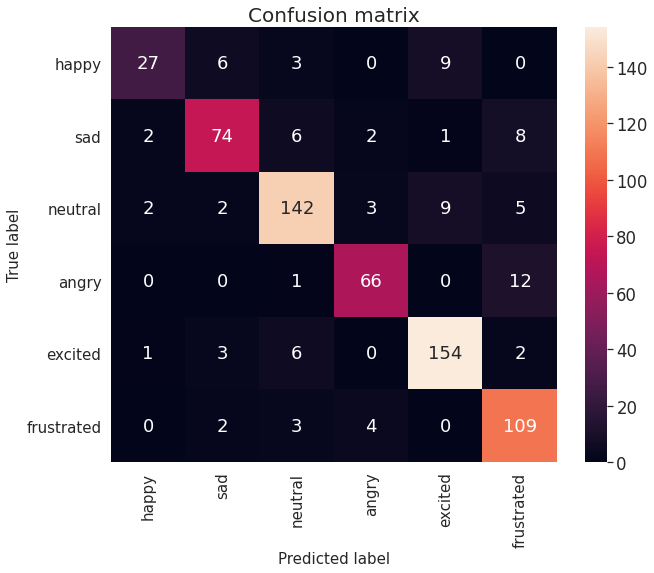

array([[ 27,   6,   3,   0,   9,   0],
       [  2,  74,   6,   2,   1,   8],
       [  2,   2, 142,   3,   9,   5],
       [  0,   0,   1,  66,   0,  12],
       [  1,   3,   6,   0, 154,   2],
       [  0,   2,   3,   4,   0, 109]])

In [ ]:
confusion_mat(golds_dev, preds_dev)

In [ ]:
print(classification_report(golds_dev, preds_dev, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.84      0.60      0.70        45
         sad       0.85      0.80      0.82        93
     neutral       0.88      0.87      0.88       163
       angry       0.88      0.84      0.86        79
     excited       0.89      0.93      0.91       166
  frustrated       0.80      0.92      0.86       118

    accuracy                           0.86       664
   macro avg       0.86      0.83      0.84       664
weighted avg       0.86      0.86      0.86       664



### TRAINSET results analysis

In [ ]:
golds_train, preds_train = get_preds(coach, train=True)

train: 100%|██████████| 4/4 [00:07<00:00,  1.88s/it]


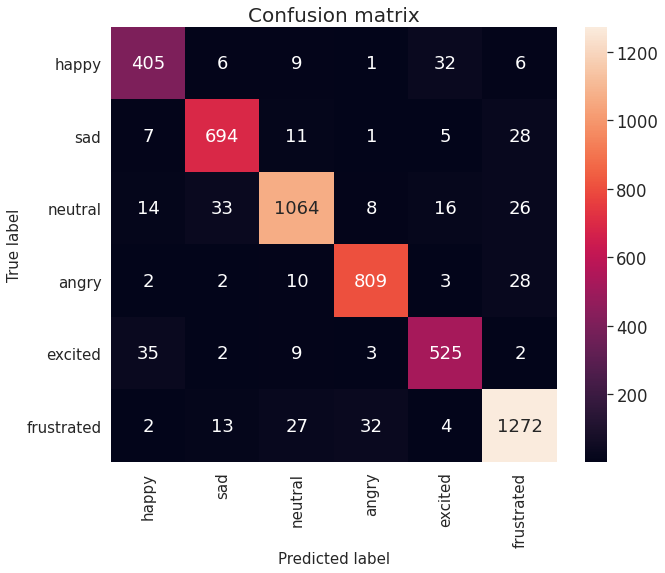

array([[ 405,    6,    9,    1,   32,    6],
       [   7,  694,   11,    1,    5,   28],
       [  14,   33, 1064,    8,   16,   26],
       [   2,    2,   10,  809,    3,   28],
       [  35,    2,    9,    3,  525,    2],
       [   2,   13,   27,   32,    4, 1272]])

In [ ]:
confusion_mat(golds_train, preds_train)

In [ ]:
print(classification_report(golds_train, preds_train, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.87      0.88      0.88       459
         sad       0.93      0.93      0.93       746
     neutral       0.94      0.92      0.93      1161
       angry       0.95      0.95      0.95       854
     excited       0.90      0.91      0.90       576
  frustrated       0.93      0.94      0.94      1350

    accuracy                           0.93      5146
   macro avg       0.92      0.92      0.92      5146
weighted avg       0.93      0.93      0.93      5146



## TRAIN - multimodal (EXP2) - EARLY FUSION

In [ ]:
args = arguments(data='/content/drive/MyDrive/DialogueGCN-mianzhang/data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=True)

In [ ]:
coach2 = main(args)

09/11/2021 05:41:09 Loaded data.
09/11/2021 05:41:10 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/11/2021 05:41:18 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 05:41:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 05:41:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 05:42:05 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

09/11/2021 05:42:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/11/2021 05:43:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 05:44:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/11/2021 05:44:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 05:46:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 05:46:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 05:47:07 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/11/2021 05:47:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

09/11/2021 05:48:10 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]

09/11/2021 05:48:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 05:48:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 05:48:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 05:49:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/11/2021 05:49:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]

09/11/2021 05:49:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 05:50:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/11/2021 05:50:32 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 05:50:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

09/11/2021 05:51:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 05:51:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

09/11/2021 05:51:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


test: 100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


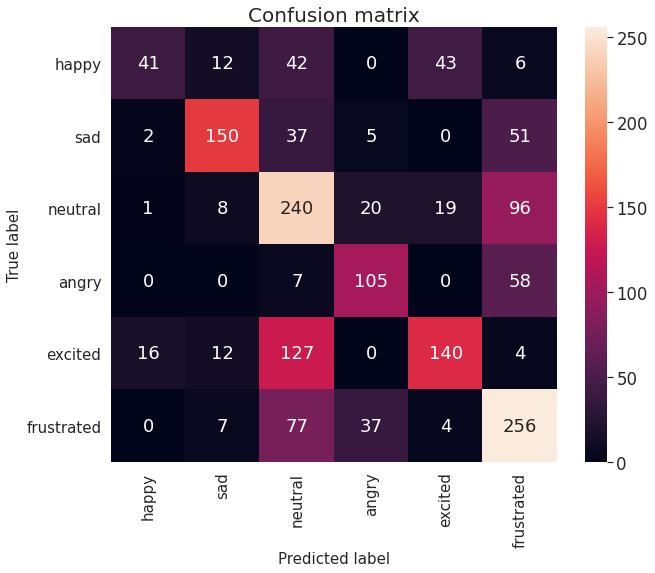

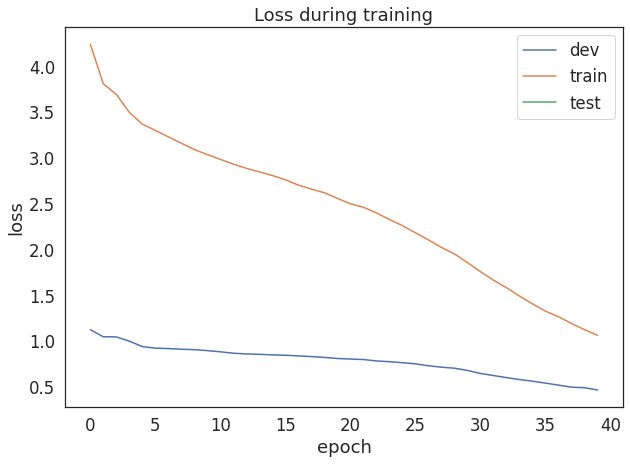

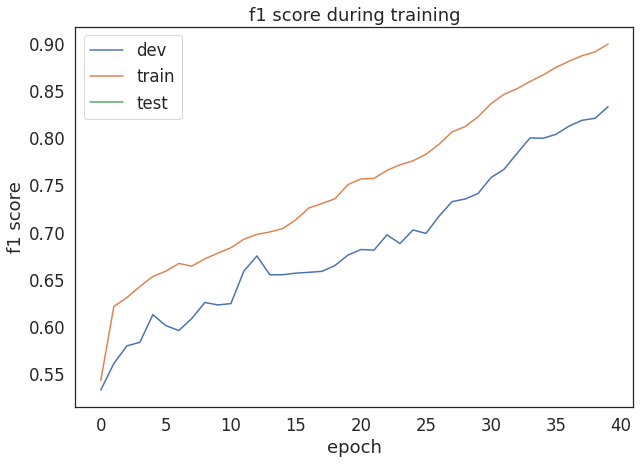

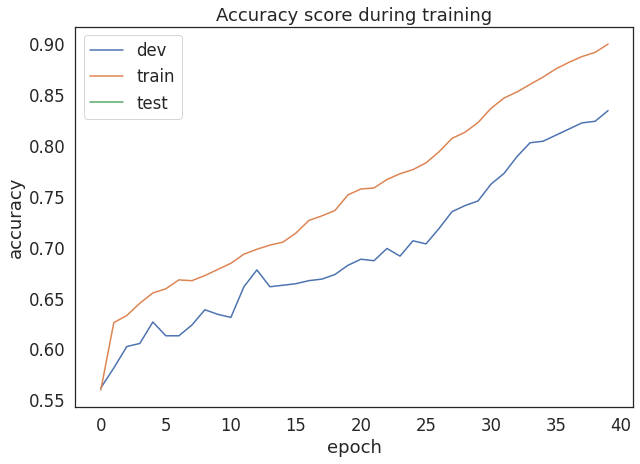

dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/11/2021 05:51:50 DEVSET RESULTS: [F1_score: 0.833286] [Loss: 0.463397] [Acc: 0.834337]



test: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]

09/11/2021 05:51:53 DEVSET RESULTS: [F1_score: 0.572751] [Loss: 1.179425] [Acc: 0.574245]


In [ ]:
golds2, preds2 = evaluate_model(coach2)

### TESTSET results analysis

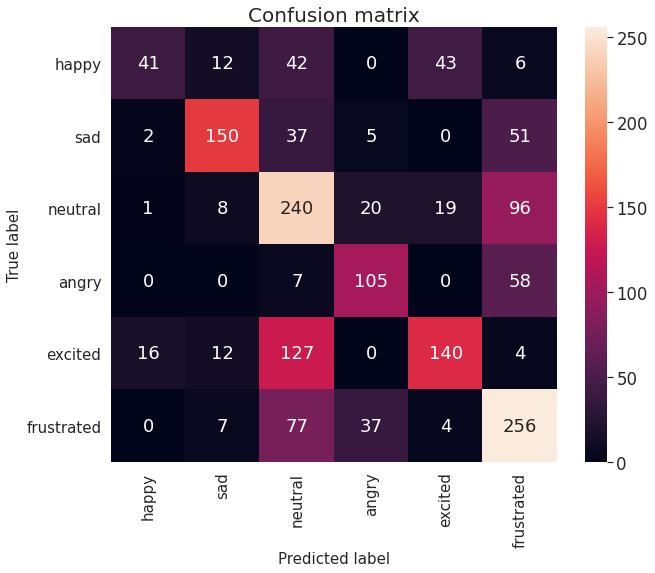

array([[ 41,  12,  42,   0,  43,   6],
       [  2, 150,  37,   5,   0,  51],
       [  1,   8, 240,  20,  19,  96],
       [  0,   0,   7, 105,   0,  58],
       [ 16,  12, 127,   0, 140,   4],
       [  0,   7,  77,  37,   4, 256]])

In [ ]:
confusion_mat(golds2, preds2)

In [ ]:
print(classification_report(golds2, preds2, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.68      0.28      0.40       144
         sad       0.79      0.61      0.69       245
     neutral       0.45      0.62      0.53       384
       angry       0.63      0.62      0.62       170
     excited       0.68      0.47      0.55       299
  frustrated       0.54      0.67      0.60       381

    accuracy                           0.57      1623
   macro avg       0.63      0.55      0.57      1623
weighted avg       0.61      0.57      0.57      1623



### DEVSET results analysis

In [ ]:
golds_dev2, preds_dev2 = get_preds(coach2, dev=True)

dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


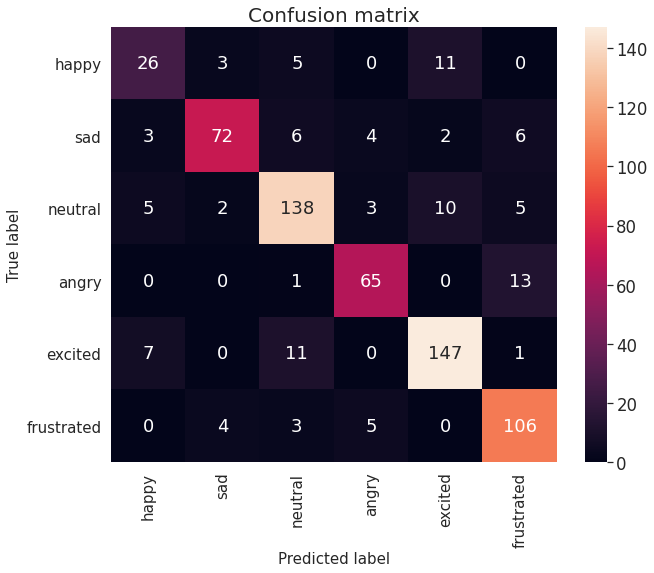

array([[ 26,   3,   5,   0,  11,   0],
       [  3,  72,   6,   4,   2,   6],
       [  5,   2, 138,   3,  10,   5],
       [  0,   0,   1,  65,   0,  13],
       [  7,   0,  11,   0, 147,   1],
       [  0,   4,   3,   5,   0, 106]])

In [ ]:
confusion_mat(golds_dev2, preds_dev2)

In [ ]:
print(classification_report(golds_dev2, preds_dev2, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.63      0.58      0.60        45
         sad       0.89      0.77      0.83        93
     neutral       0.84      0.85      0.84       163
       angry       0.84      0.82      0.83        79
     excited       0.86      0.89      0.88       166
  frustrated       0.81      0.90      0.85       118

    accuracy                           0.83       664
   macro avg       0.81      0.80      0.81       664
weighted avg       0.83      0.83      0.83       664



### TRAINSET results analysis

In [ ]:
golds_train2, preds_train2 = get_preds(coach2, train=True)

train: 100%|██████████| 4/4 [00:07<00:00,  2.00s/it]


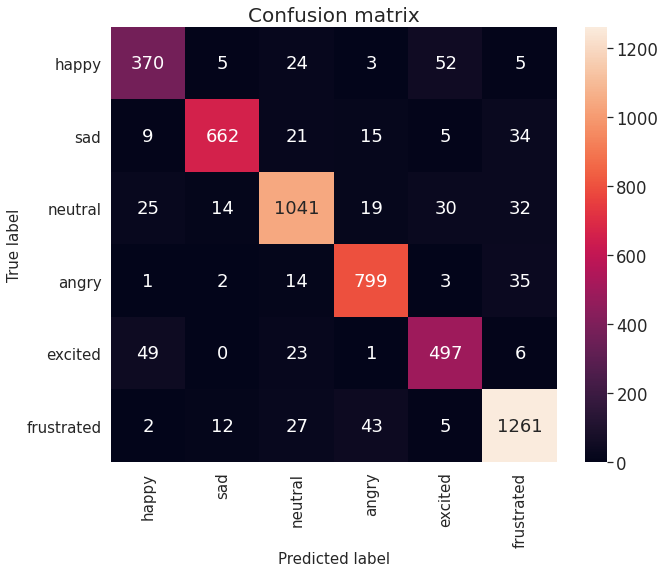

array([[ 370,    5,   24,    3,   52,    5],
       [   9,  662,   21,   15,    5,   34],
       [  25,   14, 1041,   19,   30,   32],
       [   1,    2,   14,  799,    3,   35],
       [  49,    0,   23,    1,  497,    6],
       [   2,   12,   27,   43,    5, 1261]])

In [ ]:
confusion_mat(golds_train2, preds_train2)

In [ ]:
print(classification_report(golds_train2, preds_train2, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.81      0.81      0.81       459
         sad       0.95      0.89      0.92       746
     neutral       0.91      0.90      0.90      1161
       angry       0.91      0.94      0.92       854
     excited       0.84      0.86      0.85       576
  frustrated       0.92      0.93      0.93      1350

    accuracy                           0.90      5146
   macro avg       0.89      0.89      0.89      5146
weighted avg       0.90      0.90      0.90      5146



## TRAIN - multimodal (EXP1) - LATE FUSION

In [ ]:
args = arguments(data='/content/drive/MyDrive/DialogueGCN-mianzhang/data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, exp1=True)

In [ ]:
coach1 = main(args)

09/10/2021 09:28:08 Loaded data.
09/10/2021 09:28:08 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/10/2021 09:28:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 09:28:31 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/10/2021 09:28:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

09/10/2021 09:29:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/10/2021 09:29:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/10/2021 09:29:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/10/2021 09:30:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/10/2021 09:30:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/10/2021 09:30:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/10/2021 09:30:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/10/2021 09:31:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/10/2021 09:32:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 09:32:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/10/2021 09:33:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 09:33:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/10/2021 09:33:42 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/10/2021 09:34:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 09:34:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

09/10/2021 09:34:42 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/10/2021 09:34:57 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/10/2021 09:35:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/10/2021 09:35:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/10/2021 09:35:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

09/10/2021 09:35:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 09:36:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 09:36:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/10/2021 09:36:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

09/10/2021 09:37:40 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/10/2021 09:37:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


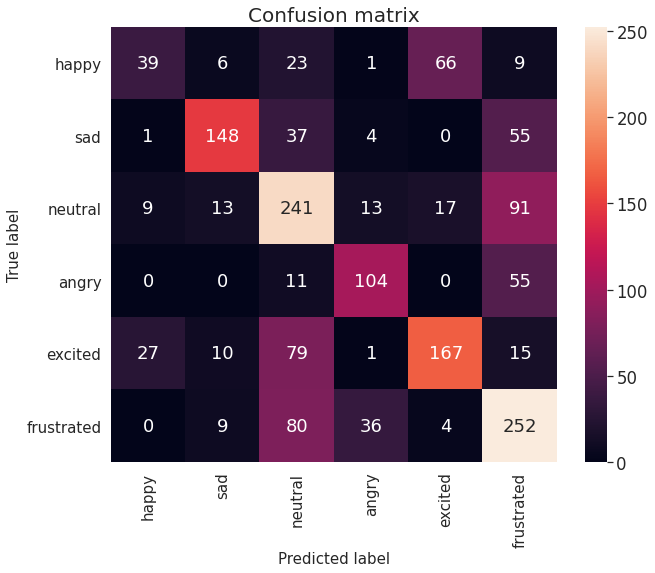

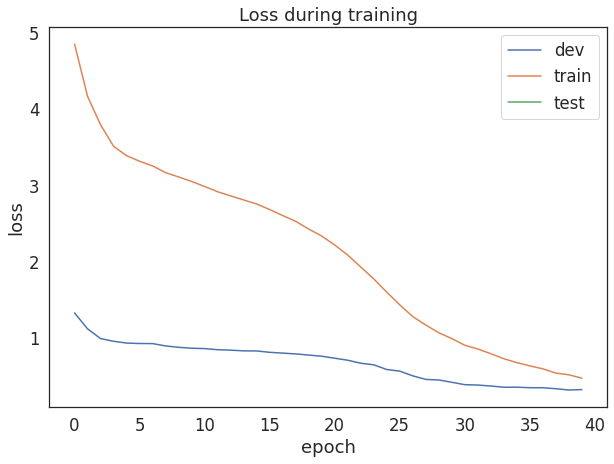

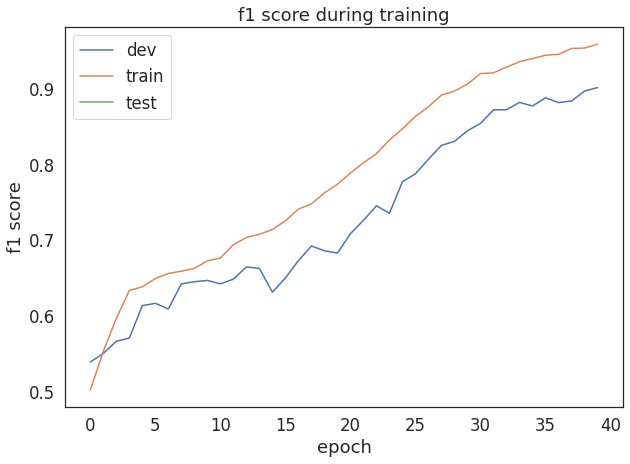

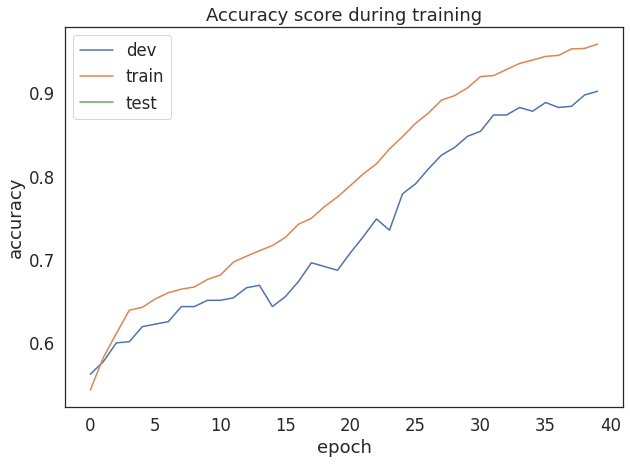

dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/10/2021 09:38:08 DEVSET RESULTS: [F1_score: 0.901378] [Loss: 0.313616] [Acc: 0.902108]



test: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]

09/10/2021 09:38:11 DEVSET RESULTS: [F1_score: 0.583896] [Loss: 1.498410] [Acc: 0.585952]


In [ ]:
golds1, preds1 = evaluate_model(coach1)

### TESTSET results analysis

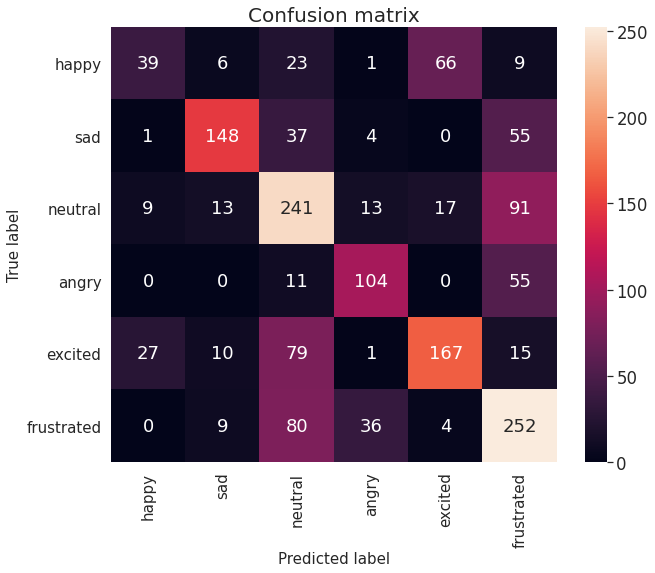

array([[ 39,   6,  23,   1,  66,   9],
       [  1, 148,  37,   4,   0,  55],
       [  9,  13, 241,  13,  17,  91],
       [  0,   0,  11, 104,   0,  55],
       [ 27,  10,  79,   1, 167,  15],
       [  0,   9,  80,  36,   4, 252]])

In [ ]:
confusion_mat(golds1, preds1)

In [ ]:
print(classification_report(golds1, preds1, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.51      0.27      0.35       144
         sad       0.80      0.60      0.69       245
     neutral       0.51      0.63      0.56       384
       angry       0.65      0.61      0.63       170
     excited       0.66      0.56      0.60       299
  frustrated       0.53      0.66      0.59       381

    accuracy                           0.59      1623
   macro avg       0.61      0.56      0.57      1623
weighted avg       0.60      0.59      0.58      1623



### DEVSET results analysis

In [ ]:
golds_dev1, preds_dev1 = get_preds(coach1, dev=True)

dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


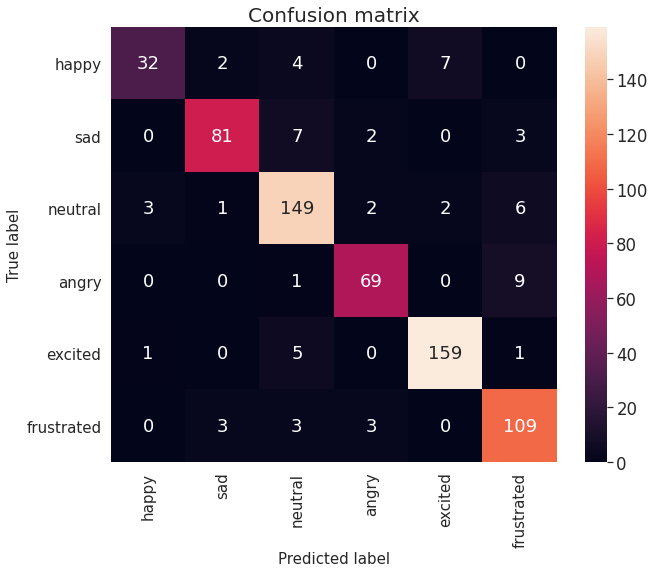

array([[ 32,   2,   4,   0,   7,   0],
       [  0,  81,   7,   2,   0,   3],
       [  3,   1, 149,   2,   2,   6],
       [  0,   0,   1,  69,   0,   9],
       [  1,   0,   5,   0, 159,   1],
       [  0,   3,   3,   3,   0, 109]])

In [ ]:
confusion_mat(golds_dev1, preds_dev1)

In [ ]:
print(classification_report(golds_dev1, preds_dev1, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.89      0.71      0.79        45
         sad       0.93      0.87      0.90        93
     neutral       0.88      0.91      0.90       163
       angry       0.91      0.87      0.89        79
     excited       0.95      0.96      0.95       166
  frustrated       0.85      0.92      0.89       118

    accuracy                           0.90       664
   macro avg       0.90      0.88      0.89       664
weighted avg       0.90      0.90      0.90       664



### TRAINSET results analysis

train: 100%|██████████| 4/4 [00:07<00:00,  1.86s/it]


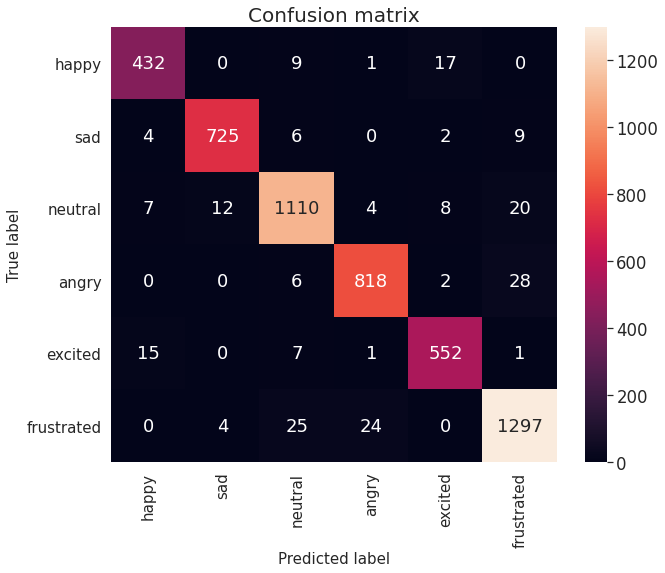

              precision    recall  f1-score   support

       happy       0.94      0.94      0.94       459
         sad       0.98      0.97      0.98       746
     neutral       0.95      0.96      0.96      1161
       angry       0.96      0.96      0.96       854
     excited       0.95      0.96      0.95       576
  frustrated       0.96      0.96      0.96      1350

    accuracy                           0.96      5146
   macro avg       0.96      0.96      0.96      5146
weighted avg       0.96      0.96      0.96      5146



In [ ]:
golds_train1, preds_train1 = get_preds(coach1, train=True)
confusion_mat(golds_train1, preds_train1)
print(classification_report(golds_train1, preds_train1, target_names=target_names))

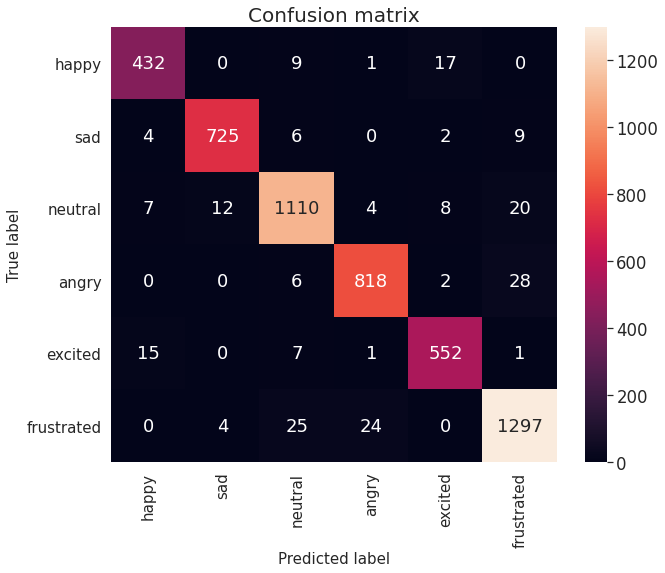

array([[ 432,    0,    9,    1,   17,    0],
       [   4,  725,    6,    0,    2,    9],
       [   7,   12, 1110,    4,    8,   20],
       [   0,    0,    6,  818,    2,   28],
       [  15,    0,    7,    1,  552,    1],
       [   0,    4,   25,   24,    0, 1297]])

In [ ]:
confusion_mat(golds_train1, preds_train1)

In [ ]:
print(classification_report(golds_train1, preds_train1, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.94      0.94      0.94       459
         sad       0.98      0.97      0.98       746
     neutral       0.95      0.96      0.96      1161
       angry       0.96      0.96      0.96       854
     excited       0.95      0.96      0.95       576
  frustrated       0.96      0.96      0.96      1350

    accuracy                           0.96      5146
   macro avg       0.96      0.96      0.96      5146
weighted avg       0.96      0.96      0.96      5146



# TRAIN - EXP 3 External Context Encoder

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, exp3=True)

In [ ]:
coach3 = main(args)

09/10/2021 09:38:22 Loaded data.
09/10/2021 09:38:22 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/10/2021 09:38:31 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

09/10/2021 09:38:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/10/2021 09:39:07 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/10/2021 09:39:42 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

09/10/2021 09:40:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/10/2021 09:40:17 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

09/10/2021 09:42:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/10/2021 09:42:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

09/10/2021 09:42:39 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/10/2021 09:42:57 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/10/2021 09:43:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

09/10/2021 09:43:50 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/10/2021 09:44:08 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/10/2021 09:44:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/10/2021 09:44:44 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/10/2021 09:45:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/10/2021 09:45:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

09/10/2021 09:45:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

09/10/2021 09:45:55 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

09/10/2021 09:46:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

09/10/2021 09:46:31 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]

09/10/2021 09:46:48 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

09/10/2021 09:47:06 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/10/2021 09:47:24 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 09:47:42 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

09/10/2021 09:48:18 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

09/10/2021 09:48:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/10/2021 09:48:53 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

09/10/2021 09:49:11 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 09:49:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

09/10/2021 09:50:05 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


### TESTSET RESULTS

test: 100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


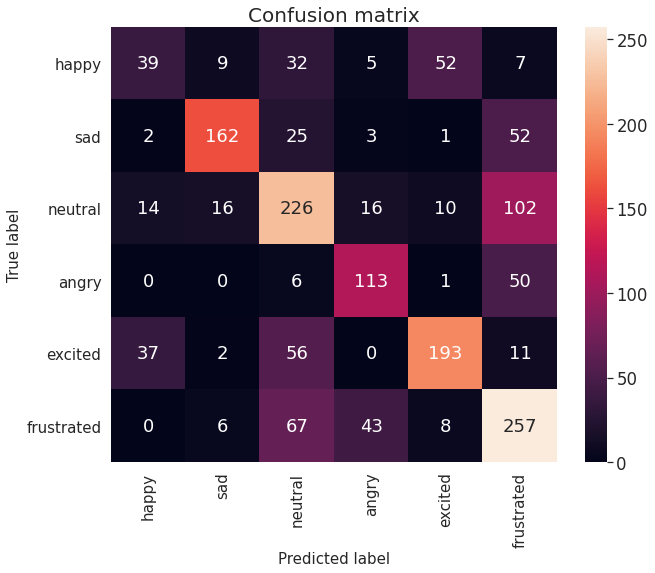

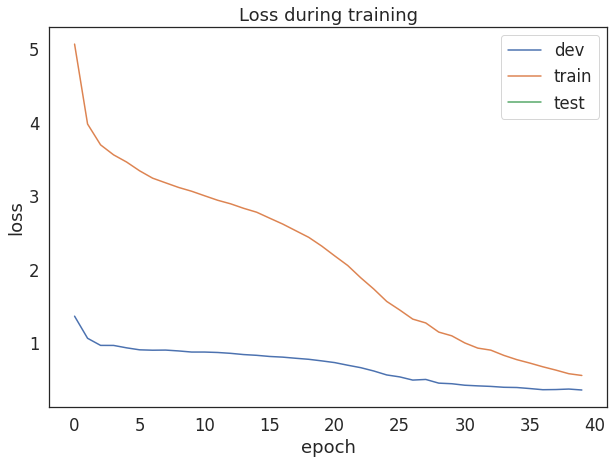

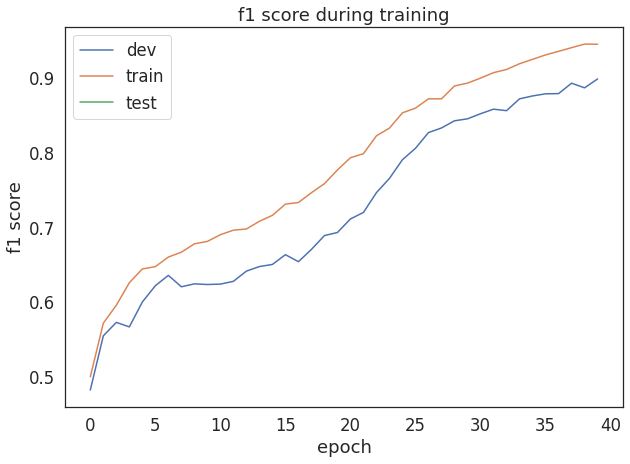

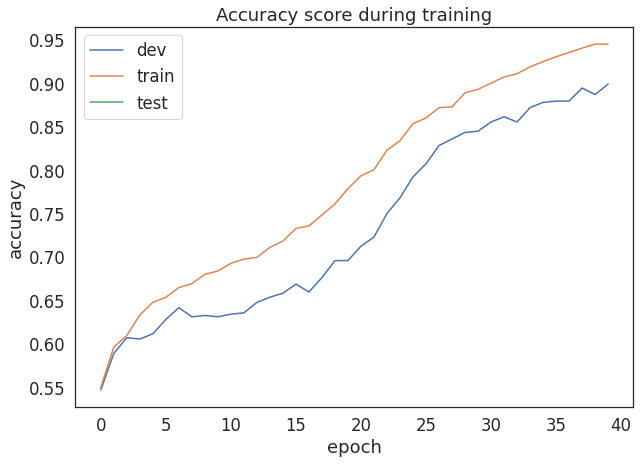

dev: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

09/10/2021 09:50:19 DEVSET RESULTS: [F1_score: 0.898629] [Loss: 0.354826] [Acc: 0.899096]



test: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]

09/10/2021 09:50:22 DEVSET RESULTS: [F1_score: 0.608856] [Loss: 1.364425] [Acc: 0.609982]


In [ ]:
golds3, preds3 = evaluate_model(coach3)

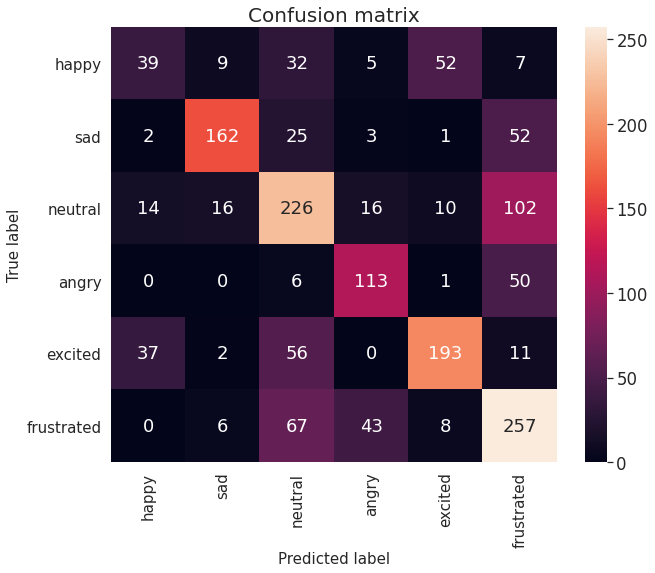

array([[ 39,   9,  32,   5,  52,   7],
       [  2, 162,  25,   3,   1,  52],
       [ 14,  16, 226,  16,  10, 102],
       [  0,   0,   6, 113,   1,  50],
       [ 37,   2,  56,   0, 193,  11],
       [  0,   6,  67,  43,   8, 257]])

In [ ]:
confusion_mat(golds3, preds3)

In [ ]:
target_names = ['happy','sad', 'neutral', 'angry', 'excited', 'frustrated']

In [ ]:
print(classification_report(golds3, preds3, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.42      0.27      0.33       144
         sad       0.83      0.66      0.74       245
     neutral       0.55      0.59      0.57       384
       angry       0.63      0.66      0.65       170
     excited       0.73      0.65      0.68       299
  frustrated       0.54      0.67      0.60       381

    accuracy                           0.61      1623
   macro avg       0.62      0.58      0.59      1623
weighted avg       0.62      0.61      0.61      1623



### DEVSET RESULTS

In [ ]:
golds_dev3, preds_dev3 = get_preds(coach3, dev=True)

dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


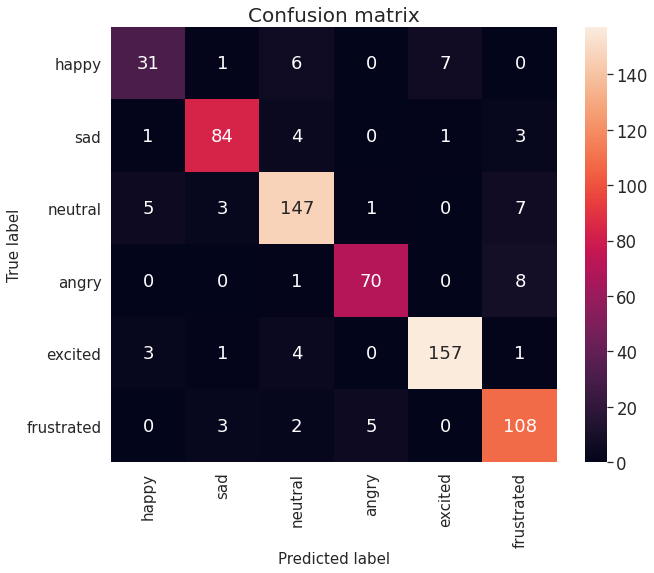

array([[ 31,   1,   6,   0,   7,   0],
       [  1,  84,   4,   0,   1,   3],
       [  5,   3, 147,   1,   0,   7],
       [  0,   0,   1,  70,   0,   8],
       [  3,   1,   4,   0, 157,   1],
       [  0,   3,   2,   5,   0, 108]])

In [ ]:
confusion_mat(golds_dev3, preds_dev3)

In [ ]:
print(classification_report(golds_dev3, preds_dev3, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.78      0.69      0.73        45
         sad       0.91      0.90      0.91        93
     neutral       0.90      0.90      0.90       163
       angry       0.92      0.89      0.90        79
     excited       0.95      0.95      0.95       166
  frustrated       0.85      0.92      0.88       118

    accuracy                           0.90       664
   macro avg       0.88      0.87      0.88       664
weighted avg       0.90      0.90      0.90       664



### TRAINSET RESULTS

In [ ]:
golds_train3, preds_train3 = get_preds(coach3, train=True)

train: 100%|██████████| 4/4 [00:08<00:00,  2.08s/it]


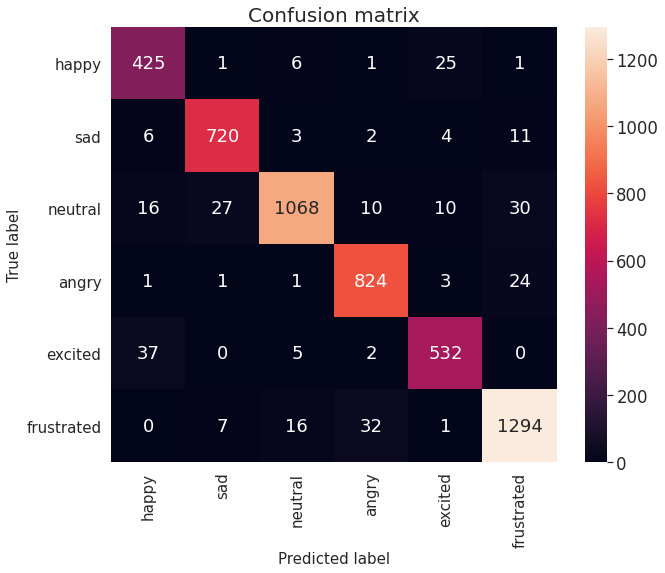

array([[ 425,    1,    6,    1,   25,    1],
       [   6,  720,    3,    2,    4,   11],
       [  16,   27, 1068,   10,   10,   30],
       [   1,    1,    1,  824,    3,   24],
       [  37,    0,    5,    2,  532,    0],
       [   0,    7,   16,   32,    1, 1294]])

In [ ]:
confusion_mat(golds_train3, preds_train3)

In [ ]:
print(classification_report(golds_train3, preds_train3, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.88      0.93      0.90       459
         sad       0.95      0.97      0.96       746
     neutral       0.97      0.92      0.95      1161
       angry       0.95      0.96      0.96       854
     excited       0.93      0.92      0.92       576
  frustrated       0.95      0.96      0.95      1350

    accuracy                           0.95      5146
   macro avg       0.94      0.94      0.94      5146
weighted avg       0.95      0.95      0.95      5146



# DECISION LEVEL FUSION

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, class_weight=True, decision_level=True)

In [ ]:
coach_DL = main(args)

09/10/2021 09:50:33 Loaded data.
09/10/2021 09:50:33 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/10/2021 09:50:43 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/10/2021 09:51:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/10/2021 09:51:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/10/2021 09:52:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/10/2021 09:52:39 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/10/2021 09:53:17 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/10/2021 09:53:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/10/2021 09:53:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/10/2021 09:54:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/10/2021 09:54:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/10/2021 09:54:54 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/10/2021 09:57:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

09/10/2021 09:58:24 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/10/2021 09:58:44 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/10/2021 09:59:03 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/10/2021 09:59:43 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

09/10/2021 10:00:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/10/2021 10:00:22 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]

09/10/2021 10:00:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/10/2021 10:01:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/10/2021 10:01:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/10/2021 10:01:38 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/10/2021 10:01:57 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 10:02:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/10/2021 10:03:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


## TESTSET RESULTS

test: 100%|██████████| 1/1 [00:03<00:00,  3.05s/it]


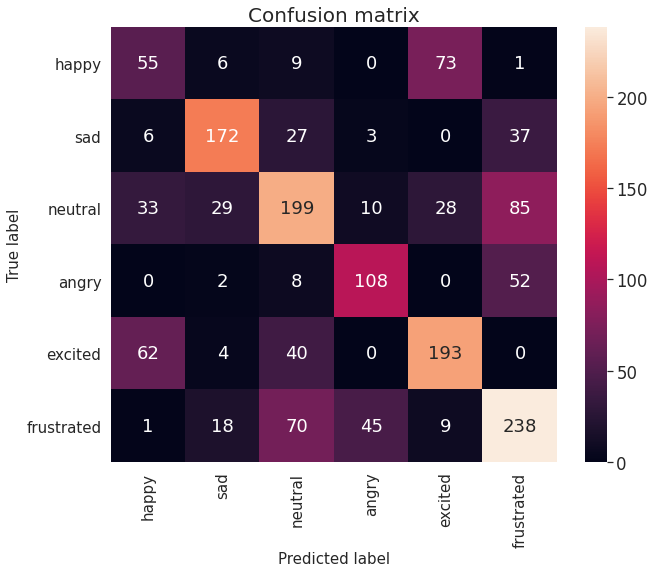

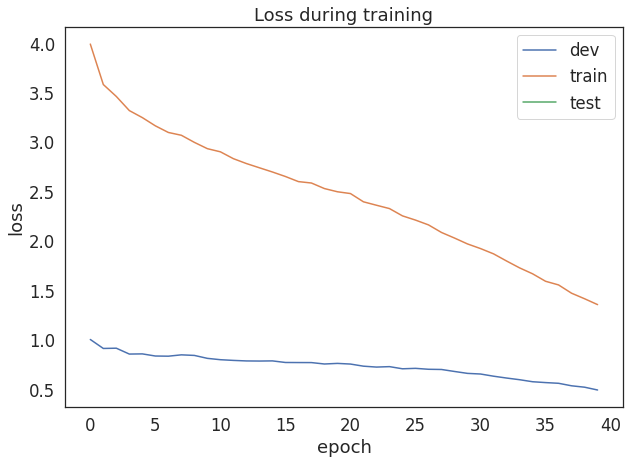

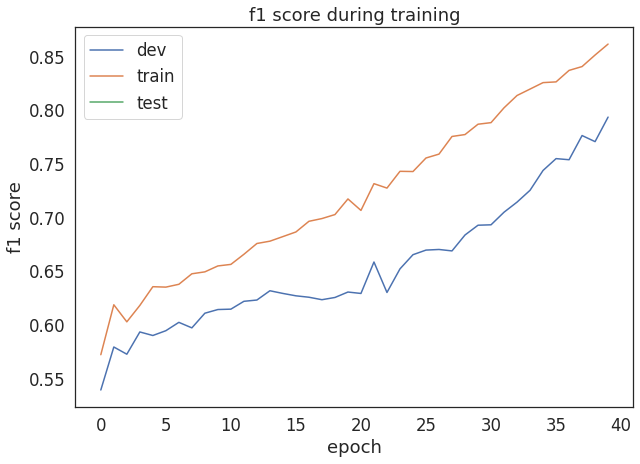

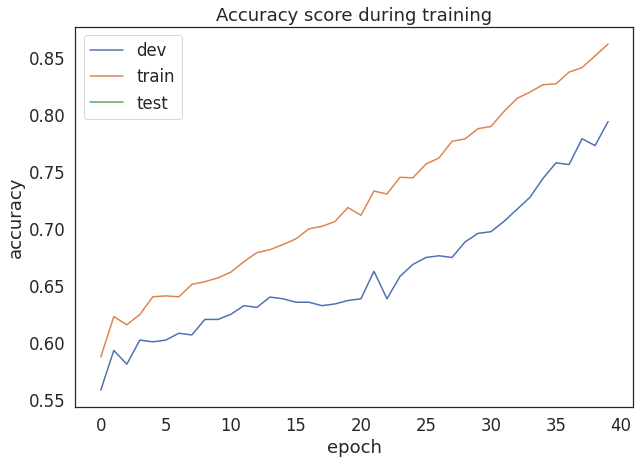

dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 10:03:31 DEVSET RESULTS: [F1_score: 0.793373] [Loss: 0.495327] [Acc: 0.793675]



test: 100%|██████████| 1/1 [00:02<00:00,  2.93s/it]

09/10/2021 10:03:34 DEVSET RESULTS: [F1_score: 0.595481] [Loss: 1.058601] [Acc: 0.594578]


In [ ]:
golds_DL, preds_DL = evaluate_model(coach_DL)

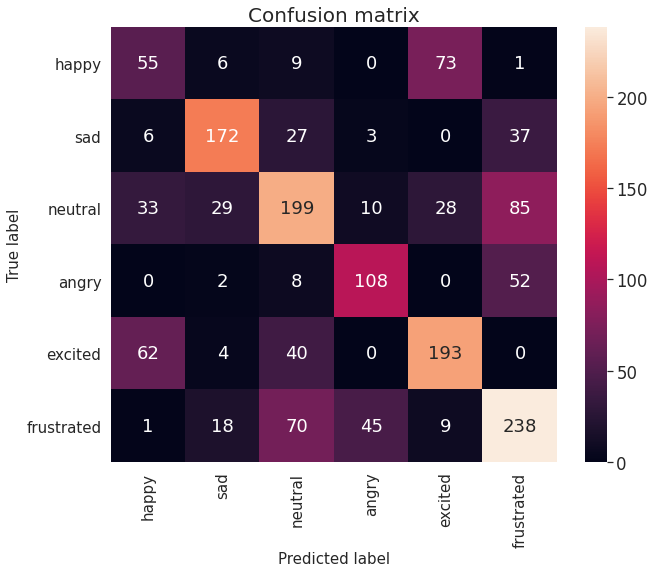

array([[ 55,   6,   9,   0,  73,   1],
       [  6, 172,  27,   3,   0,  37],
       [ 33,  29, 199,  10,  28,  85],
       [  0,   2,   8, 108,   0,  52],
       [ 62,   4,  40,   0, 193,   0],
       [  1,  18,  70,  45,   9, 238]])

In [ ]:
confusion_mat(golds_DL, preds_DL)

In [ ]:
print(classification_report(golds_DL, preds_DL, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.35      0.38      0.37       144
         sad       0.74      0.70      0.72       245
     neutral       0.56      0.52      0.54       384
       angry       0.65      0.64      0.64       170
     excited       0.64      0.65      0.64       299
  frustrated       0.58      0.62      0.60       381

    accuracy                           0.59      1623
   macro avg       0.59      0.58      0.59      1623
weighted avg       0.60      0.59      0.60      1623



## DEVSET RESULTS

In [ ]:
golds_devDL, preds_devDL = get_preds(coach_DL, dev=True)

dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


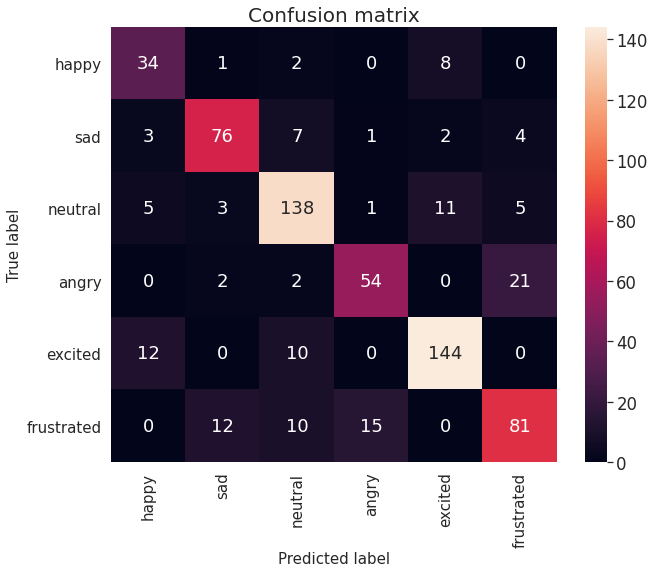

array([[ 34,   1,   2,   0,   8,   0],
       [  3,  76,   7,   1,   2,   4],
       [  5,   3, 138,   1,  11,   5],
       [  0,   2,   2,  54,   0,  21],
       [ 12,   0,  10,   0, 144,   0],
       [  0,  12,  10,  15,   0,  81]])

In [ ]:
confusion_mat(golds_devDL, preds_devDL)

In [ ]:
print(classification_report(golds_devDL, preds_devDL, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.63      0.76      0.69        45
         sad       0.81      0.82      0.81        93
     neutral       0.82      0.85      0.83       163
       angry       0.76      0.68      0.72        79
     excited       0.87      0.87      0.87       166
  frustrated       0.73      0.69      0.71       118

    accuracy                           0.79       664
   macro avg       0.77      0.78      0.77       664
weighted avg       0.79      0.79      0.79       664



## TRAINSET RESULTS

In [ ]:
golds_trainDL, preds_trainDL = get_preds(coach_DL, train=True)

train: 100%|██████████| 4/4 [00:09<00:00,  2.35s/it]


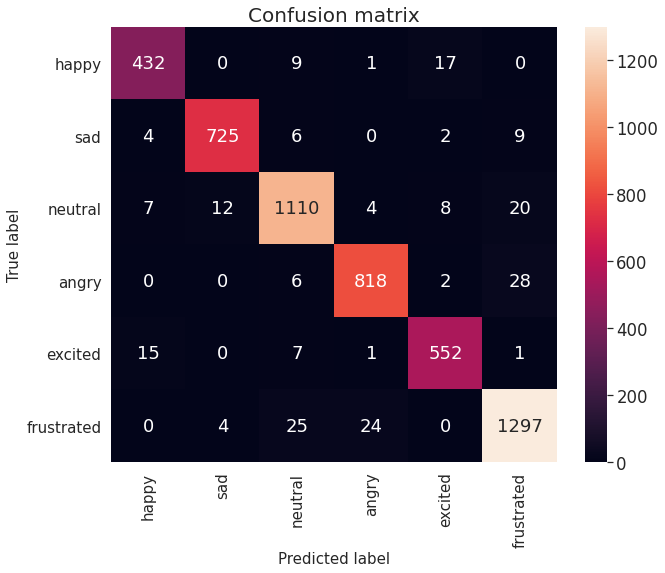

array([[ 432,    0,    9,    1,   17,    0],
       [   4,  725,    6,    0,    2,    9],
       [   7,   12, 1110,    4,    8,   20],
       [   0,    0,    6,  818,    2,   28],
       [  15,    0,    7,    1,  552,    1],
       [   0,    4,   25,   24,    0, 1297]])

In [ ]:
confusion_mat(golds_train1, preds_train1)

In [ ]:
print(classification_report(golds_trainDL, preds_trainDL, target_names=target_names))

              precision    recall  f1-score   support

       happy       0.75      0.96      0.84       459
         sad       0.89      0.92      0.90       746
     neutral       0.88      0.86      0.87      1161
       angry       0.86      0.86      0.86       854
     excited       0.88      0.80      0.84       576
  frustrated       0.88      0.82      0.85      1350

    accuracy                           0.86      5146
   macro avg       0.86      0.87      0.86      5146
weighted avg       0.86      0.86      0.86      5146



# Analysis of role of the window size

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
def train_windowsize(exp3=False, multim=False, exp1=False, decision_level=False, windowsize=10):

  args = arguments(data='/content/.../data_split.pickle', wp=windowsize, wf=windowsize,rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=multim, exp3=exp3, exp1=exp1, decision_level=decision_level)
  experiment = 'Experiment 3' if exp3 else 'Experiment 2' if multim else 'Experiment 1' if exp1 else "Decision Level" if decision_level else 'Baseline'
  log.info("[TRAINING] {}, [WINDOW SIZE] {}".format(experiment, windowsize))
  cur_coach = main(args)
  
  target_names = ['happy','sad', 'neutral', 'angry', 'excited', 'frustrated']

  log.info("[TEST RESULTS] {}, [WINDOW SIZE] {}".format(experiment, windowsize))
  golds, preds = evaluate_model(cur_coach)
  confusion_mat(golds, preds)
  
  print(classification_report(golds, preds, target_names=target_names))

In [ ]:
ws = [0,1, 5, 10, 20]

##BASELINE

09/10/2021 10:03:46 [TRAINING] Baseline, [WINDOW SIZE] 0
09/10/2021 10:03:46 Loaded data.
09/10/2021 10:03:46 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

09/10/2021 10:03:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

09/10/2021 10:03:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

09/10/2021 10:03:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

09/10/2021 10:04:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

09/10/2021 10:04:07 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

09/10/2021 10:04:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

09/10/2021 10:04:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

09/10/2021 10:04:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

09/10/2021 10:04:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.28it/s]

09/10/2021 10:04:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

09/10/2021 10:04:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

09/10/2021 10:04:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

09/10/2021 10:04:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

09/10/2021 10:04:51 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

09/10/2021 10:04:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

09/10/2021 10:05:10 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

09/10/2021 10:05:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

09/10/2021 10:05:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

09/10/2021 10:05:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

09/10/2021 10:06:45 [TEST RESULTS] Baseline, [WINDOW SIZE] 0



test: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


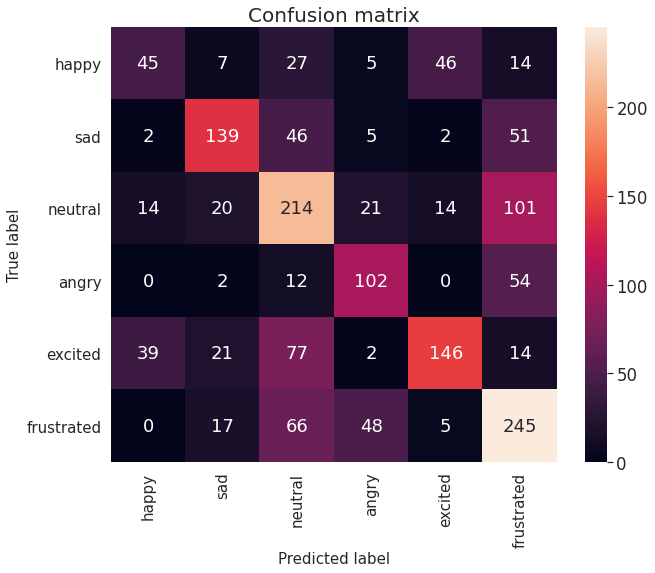

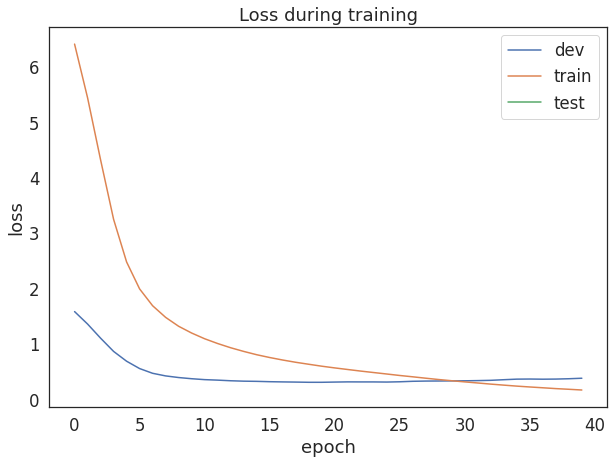

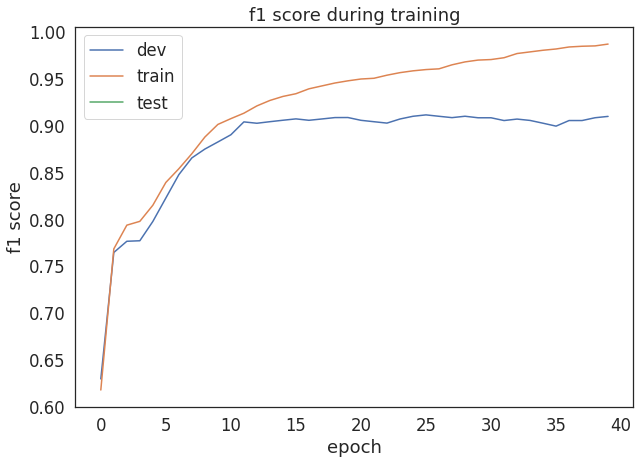

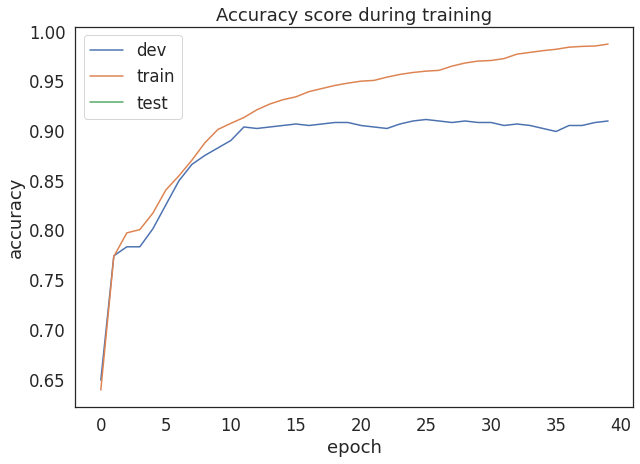

dev: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

09/10/2021 10:06:47 DEVSET RESULTS: [F1_score: 0.911334] [Loss: 0.314524] [Acc: 0.911145]



test: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

09/10/2021 10:06:47 DEVSET RESULTS: [F1_score: 0.547724] [Loss: 1.803937] [Acc: 0.548983]


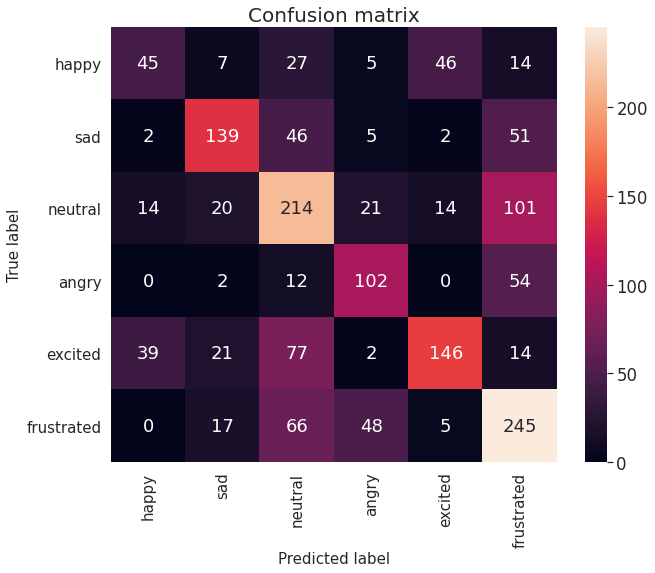

              precision    recall  f1-score   support

       happy       0.45      0.31      0.37       144
         sad       0.67      0.57      0.62       245
     neutral       0.48      0.56      0.52       384
       angry       0.56      0.60      0.58       170
     excited       0.69      0.49      0.57       299
  frustrated       0.51      0.64      0.57       381

    accuracy                           0.55      1623
   macro avg       0.56      0.53      0.54      1623
weighted avg       0.56      0.55      0.55      1623

09/10/2021 10:06:48 [TRAINING] Baseline, [WINDOW SIZE] 1
09/10/2021 10:06:48 Loaded data.
09/10/2021 10:06:48 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

09/10/2021 10:06:52 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

09/10/2021 10:06:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

09/10/2021 10:07:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

09/10/2021 10:07:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

09/10/2021 10:07:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

09/10/2021 10:07:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

09/10/2021 10:07:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

09/10/2021 10:07:32 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

09/10/2021 10:07:37 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

09/10/2021 10:07:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

09/10/2021 10:07:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

09/10/2021 10:07:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

09/10/2021 10:08:00 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

09/10/2021 10:08:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

09/10/2021 10:08:11 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

09/10/2021 10:08:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

09/10/2021 10:08:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

09/10/2021 10:08:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

09/10/2021 10:08:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

09/10/2021 10:08:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

09/10/2021 10:08:51 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

09/10/2021 10:08:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

09/10/2021 10:09:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

09/10/2021 10:09:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

09/10/2021 10:09:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

09/10/2021 10:09:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

09/10/2021 10:10:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

09/10/2021 10:10:37 [TEST RESULTS] Baseline, [WINDOW SIZE] 1



test: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


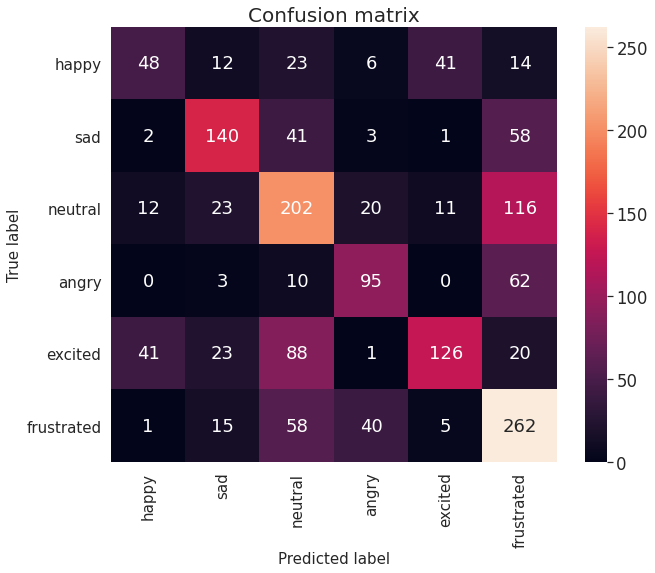

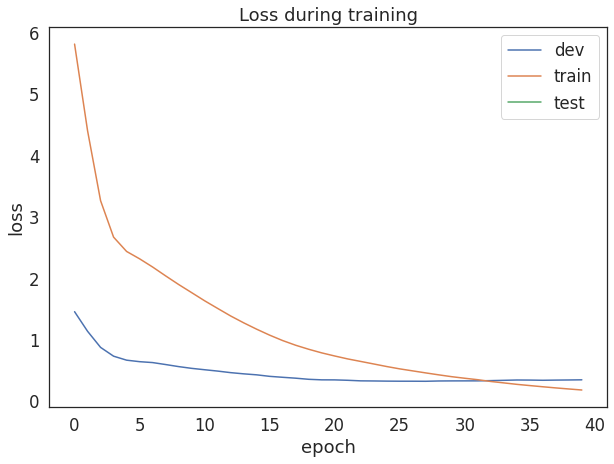

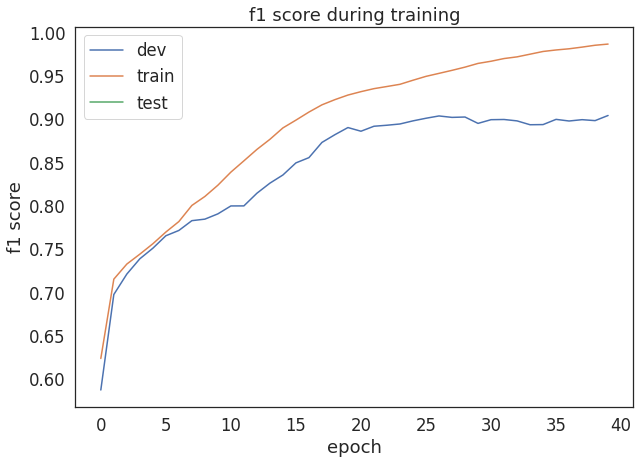

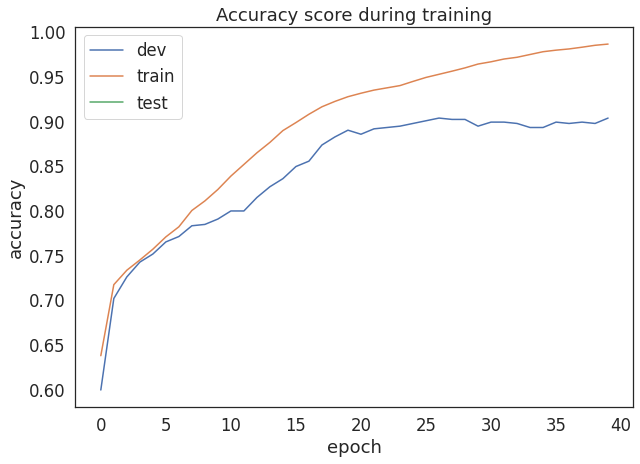

dev: 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

09/10/2021 10:10:40 DEVSET RESULTS: [F1_score: 0.903961] [Loss: 0.345272] [Acc: 0.903614]



test: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

09/10/2021 10:10:40 DEVSET RESULTS: [F1_score: 0.534881] [Loss: 2.059644] [Acc: 0.537893]


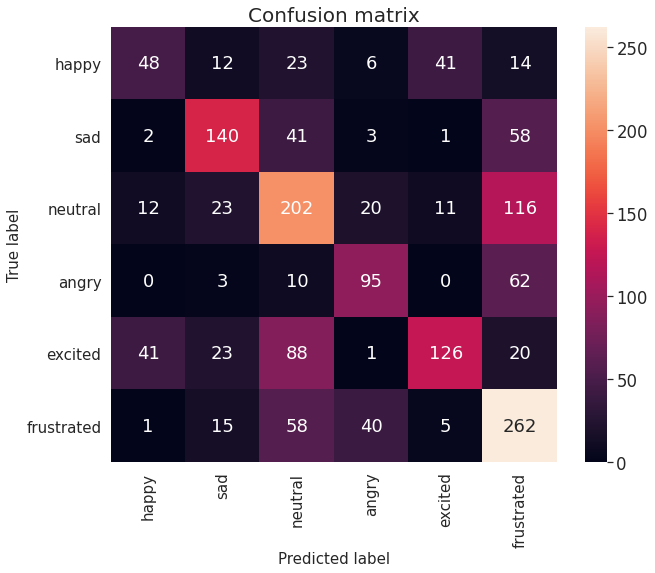

              precision    recall  f1-score   support

       happy       0.46      0.33      0.39       144
         sad       0.65      0.57      0.61       245
     neutral       0.48      0.53      0.50       384
       angry       0.58      0.56      0.57       170
     excited       0.68      0.42      0.52       299
  frustrated       0.49      0.69      0.57       381

    accuracy                           0.54      1623
   macro avg       0.56      0.52      0.53      1623
weighted avg       0.55      0.54      0.53      1623

09/10/2021 10:10:41 [TRAINING] Baseline, [WINDOW SIZE] 5
09/10/2021 10:10:41 Loaded data.
09/10/2021 10:10:41 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

09/10/2021 10:10:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

09/10/2021 10:10:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

09/10/2021 10:11:07 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

09/10/2021 10:11:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

09/10/2021 10:11:27 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

09/10/2021 10:11:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

09/10/2021 10:11:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

09/10/2021 10:12:18 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

09/10/2021 10:12:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

09/10/2021 10:12:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

09/10/2021 10:12:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

09/10/2021 10:13:00 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/10/2021 10:13:10 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

09/10/2021 10:13:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

09/10/2021 10:13:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/10/2021 10:13:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

09/10/2021 10:13:52 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

09/10/2021 10:14:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/10/2021 10:14:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

09/10/2021 10:14:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

09/10/2021 10:14:44 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

09/10/2021 10:14:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

09/10/2021 10:15:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

09/10/2021 10:15:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

09/10/2021 10:15:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/10/2021 10:15:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

09/10/2021 10:15:46 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

09/10/2021 10:15:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/10/2021 10:16:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

09/10/2021 10:16:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

09/10/2021 10:16:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

09/10/2021 10:17:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/10/2021 10:17:27 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

09/10/2021 10:17:32 [TEST RESULTS] Baseline, [WINDOW SIZE] 5



test: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


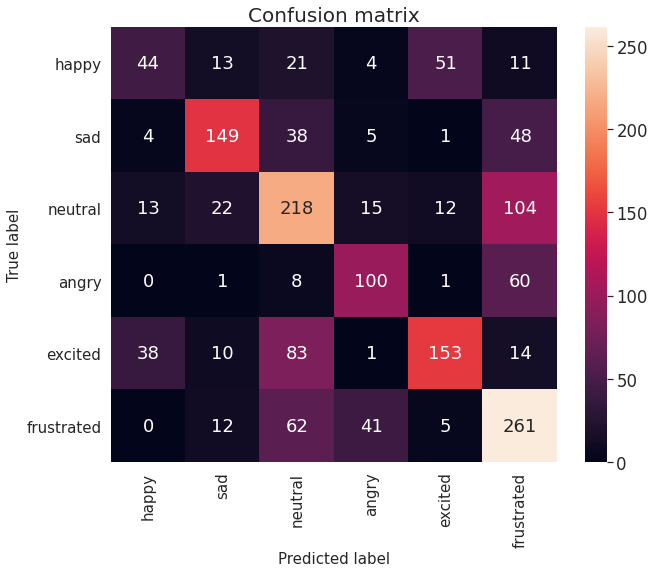

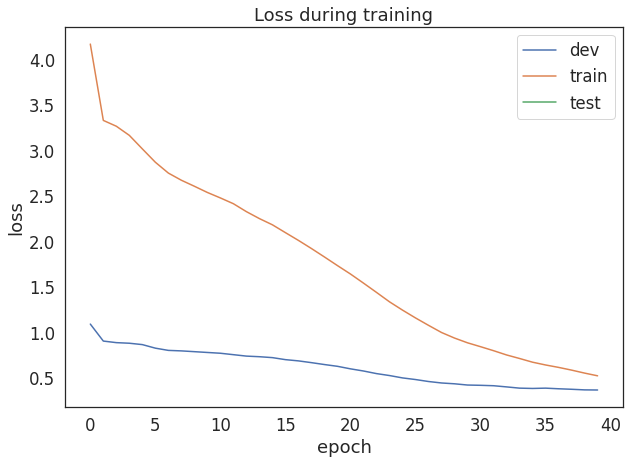

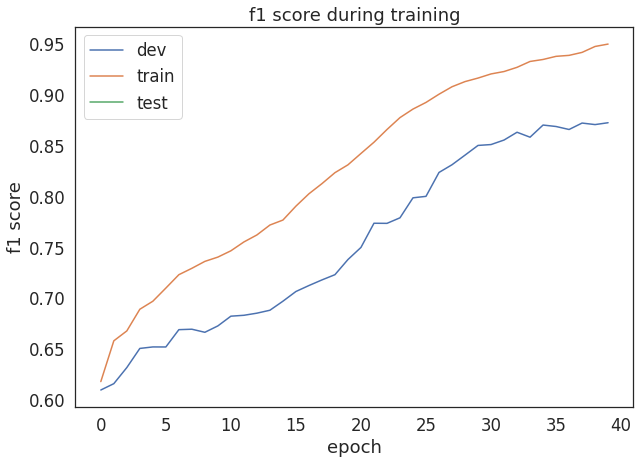

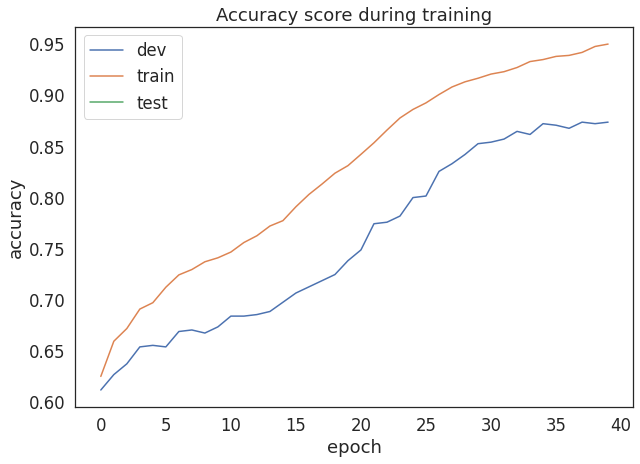

dev: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

09/10/2021 10:17:36 DEVSET RESULTS: [F1_score: 0.872513] [Loss: 0.365207] [Acc: 0.873494]



test: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]

09/10/2021 10:17:38 DEVSET RESULTS: [F1_score: 0.568134] [Loss: 1.449637] [Acc: 0.569932]


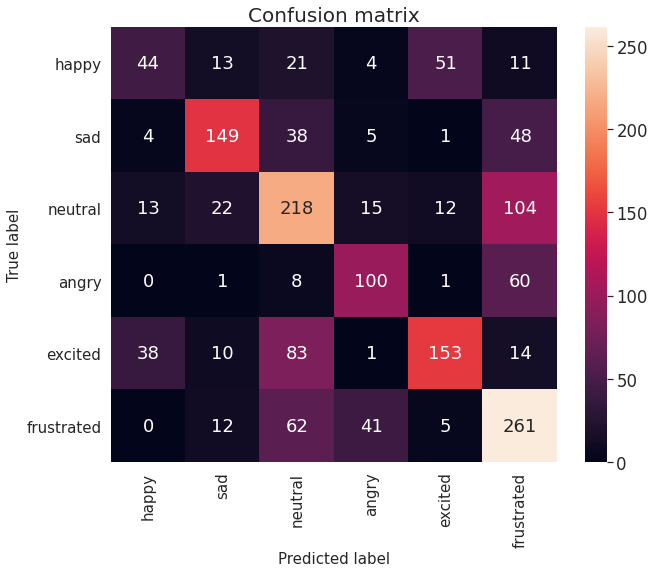

              precision    recall  f1-score   support

       happy       0.44      0.31      0.36       144
         sad       0.72      0.61      0.66       245
     neutral       0.51      0.57      0.54       384
       angry       0.60      0.59      0.60       170
     excited       0.69      0.51      0.59       299
  frustrated       0.52      0.69      0.59       381

    accuracy                           0.57      1623
   macro avg       0.58      0.54      0.56      1623
weighted avg       0.58      0.57      0.57      1623

09/10/2021 10:17:38 [TRAINING] Baseline, [WINDOW SIZE] 10
09/10/2021 10:17:38 Loaded data.
09/10/2021 10:17:38 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/10/2021 10:17:46 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 10:18:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]

09/10/2021 10:18:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/10/2021 10:18:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/10/2021 10:18:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/10/2021 10:19:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 10:19:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/10/2021 10:19:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/10/2021 10:20:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/10/2021 10:21:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/10/2021 10:21:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

09/10/2021 10:21:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/10/2021 10:21:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/10/2021 10:22:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/10/2021 10:22:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

09/10/2021 10:22:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/10/2021 10:23:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

09/10/2021 10:23:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 10:24:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/10/2021 10:24:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

09/10/2021 10:24:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 10:25:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 10:25:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/10/2021 10:25:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/10/2021 10:25:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 10:26:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/10/2021 10:26:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/10/2021 10:26:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/10/2021 10:27:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/10/2021 10:27:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

09/10/2021 10:27:38 [TEST RESULTS] Baseline, [WINDOW SIZE] 10



test: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


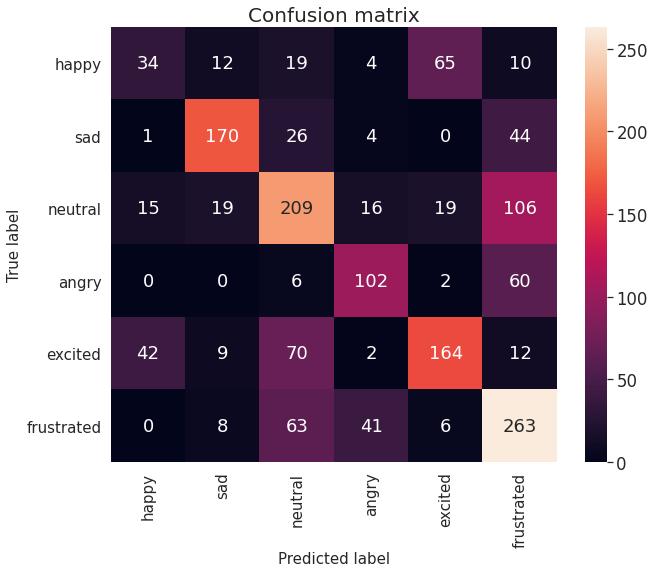

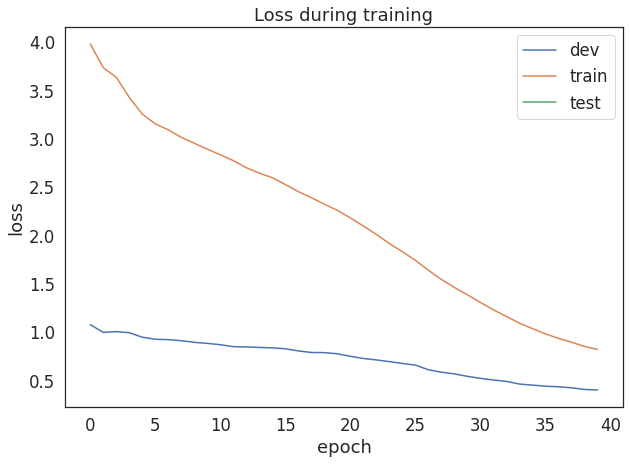

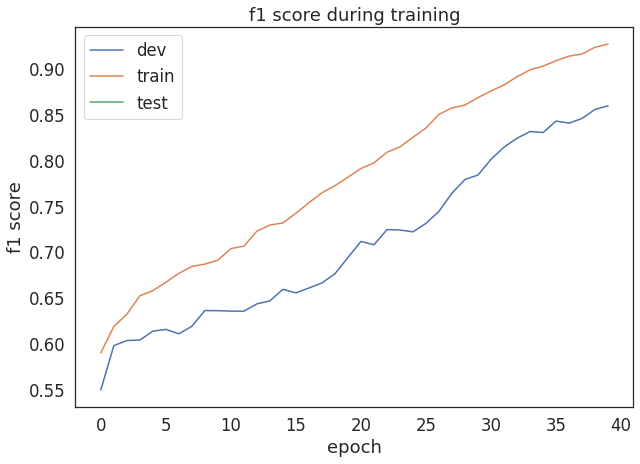

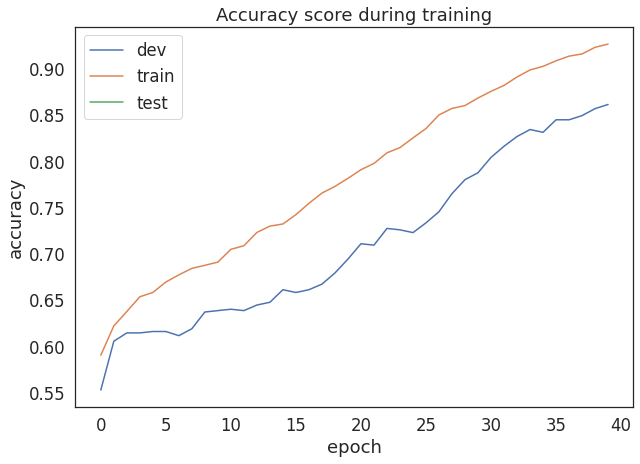

dev: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

09/10/2021 10:27:43 DEVSET RESULTS: [F1_score: 0.859505] [Loss: 0.397743] [Acc: 0.861446]



test: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]

09/10/2021 10:27:45 DEVSET RESULTS: [F1_score: 0.576565] [Loss: 1.231622] [Acc: 0.580407]


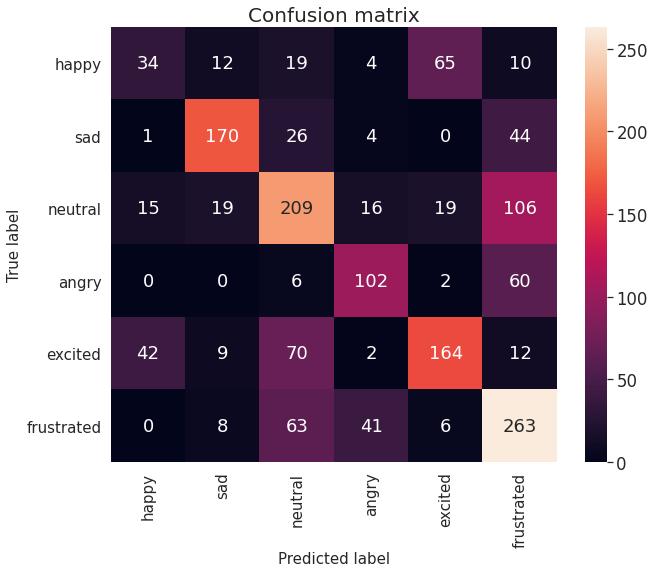

              precision    recall  f1-score   support

       happy       0.37      0.24      0.29       144
         sad       0.78      0.69      0.73       245
     neutral       0.53      0.54      0.54       384
       angry       0.60      0.60      0.60       170
     excited       0.64      0.55      0.59       299
  frustrated       0.53      0.69      0.60       381

    accuracy                           0.58      1623
   macro avg       0.58      0.55      0.56      1623
weighted avg       0.58      0.58      0.58      1623

09/10/2021 10:27:46 [TRAINING] Baseline, [WINDOW SIZE] 20
09/10/2021 10:27:46 Loaded data.
09/10/2021 10:27:46 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

09/10/2021 10:27:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

09/10/2021 10:28:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]

09/10/2021 10:29:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]

09/10/2021 10:30:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

09/10/2021 10:30:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

09/10/2021 10:31:43 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

09/10/2021 10:32:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

09/10/2021 10:34:23 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

09/10/2021 10:34:46 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

09/10/2021 10:35:09 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]

09/10/2021 10:36:40 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]

09/10/2021 10:37:25 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

09/10/2021 10:37:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

09/10/2021 10:38:10 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

09/10/2021 10:38:32 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]

09/10/2021 10:38:55 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]

09/10/2021 10:39:40 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

09/10/2021 10:40:48 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

09/10/2021 10:41:32 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

09/10/2021 10:42:18 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]

09/10/2021 10:42:40 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]

09/10/2021 10:42:53 [TEST RESULTS] Baseline, [WINDOW SIZE] 20



test: 100%|██████████| 1/1 [00:03<00:00,  3.67s/it]


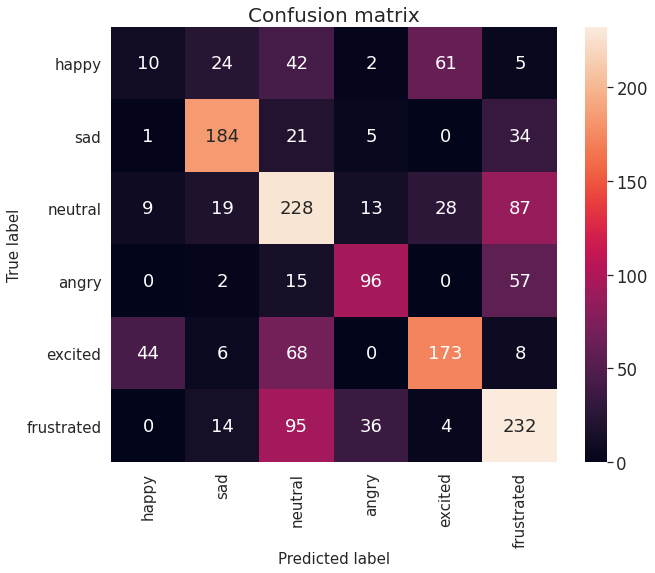

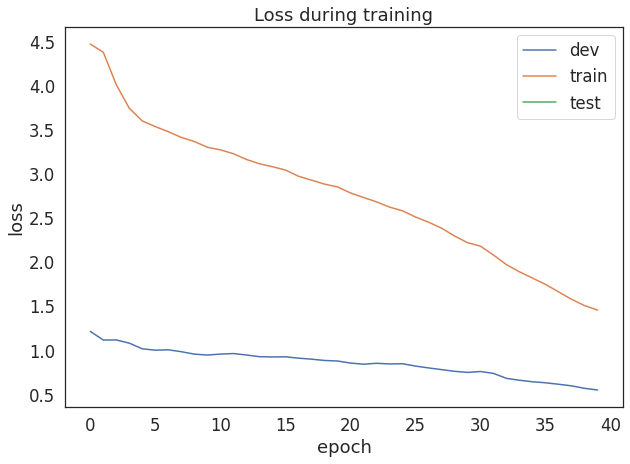

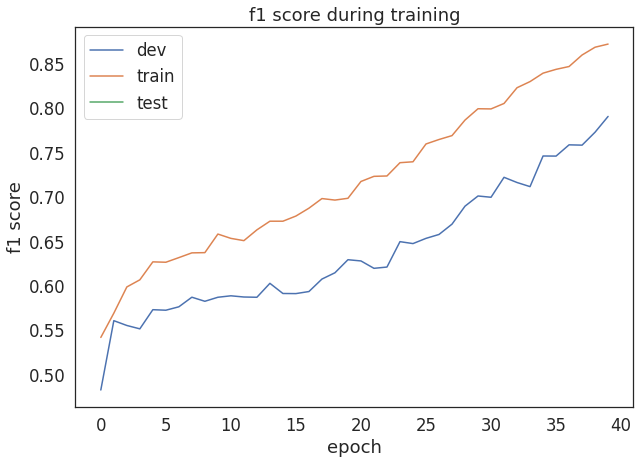

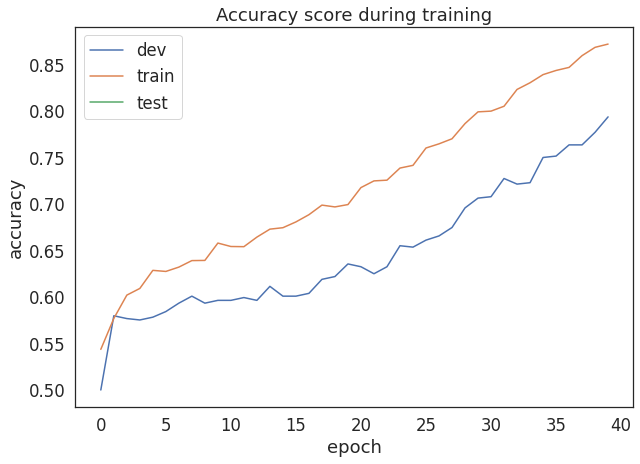

dev: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

09/10/2021 10:43:00 DEVSET RESULTS: [F1_score: 0.790385] [Loss: 0.549646] [Acc: 0.793675]



test: 100%|██████████| 1/1 [00:03<00:00,  3.68s/it]

09/10/2021 10:43:04 DEVSET RESULTS: [F1_score: 0.558218] [Loss: 1.157065] [Acc: 0.568700]


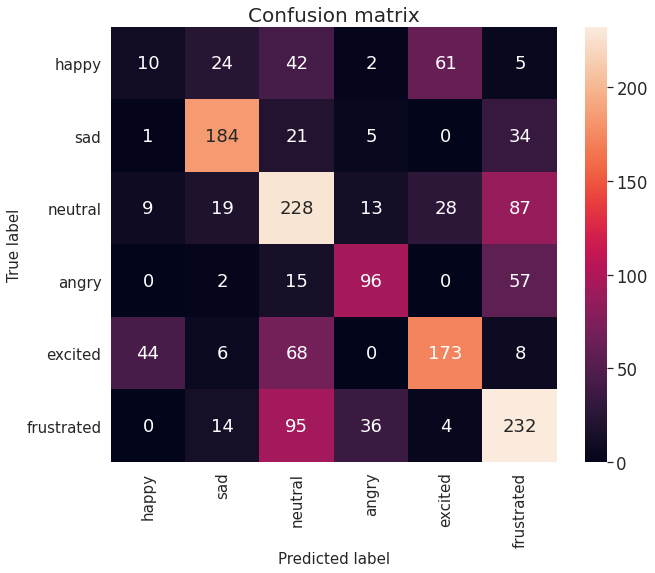

              precision    recall  f1-score   support

       happy       0.16      0.07      0.10       144
         sad       0.74      0.75      0.74       245
     neutral       0.49      0.59      0.53       384
       angry       0.63      0.56      0.60       170
     excited       0.65      0.58      0.61       299
  frustrated       0.55      0.61      0.58       381

    accuracy                           0.57      1623
   macro avg       0.54      0.53      0.53      1623
weighted avg       0.56      0.57      0.56      1623



In [ ]:
for windowsize in ws:
  train_windowsize(windowsize=windowsize)

##EXPERIMENT 1

09/10/2021 10:43:05 [TRAINING] Experiment 1, [WINDOW SIZE] 0
09/10/2021 10:43:05 Loaded data.
09/10/2021 10:43:05 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

09/10/2021 10:43:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

09/10/2021 10:43:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

09/10/2021 10:43:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

09/10/2021 10:43:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

09/10/2021 10:43:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

09/10/2021 10:43:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

09/10/2021 10:43:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

09/10/2021 10:43:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

09/10/2021 10:43:45 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

09/10/2021 10:43:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

09/10/2021 10:43:59 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

09/10/2021 10:44:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

09/10/2021 10:44:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

09/10/2021 10:44:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

09/10/2021 10:46:07 [TEST RESULTS] Experiment 1, [WINDOW SIZE] 0



test: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


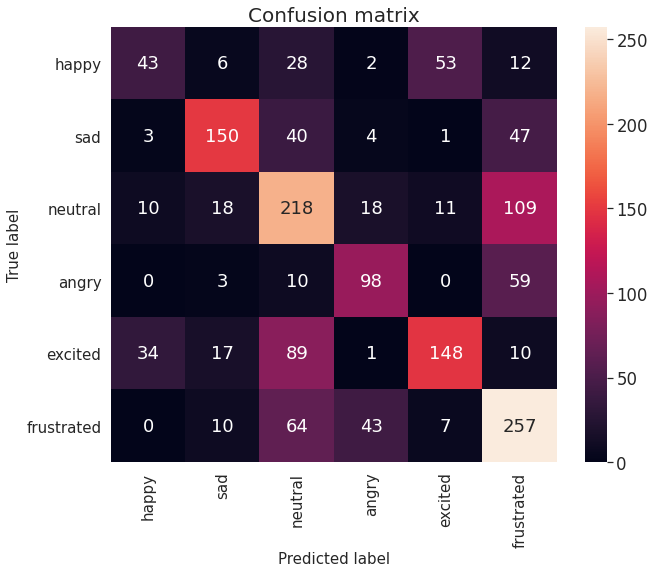

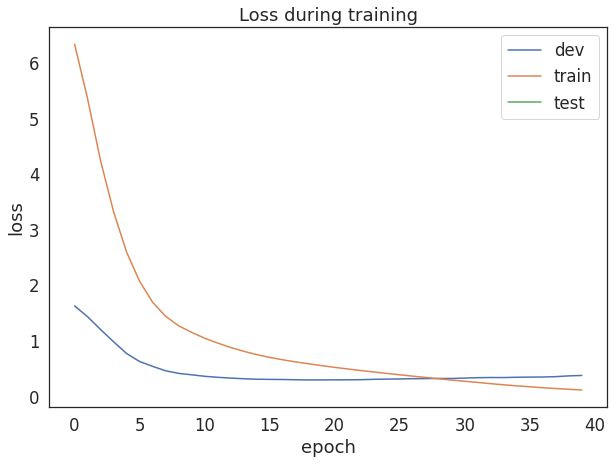

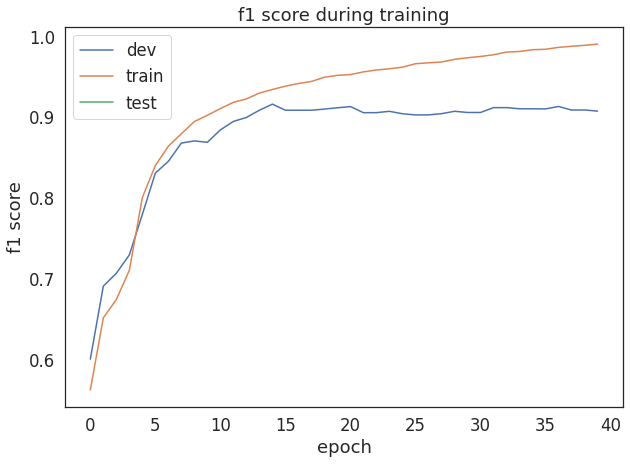

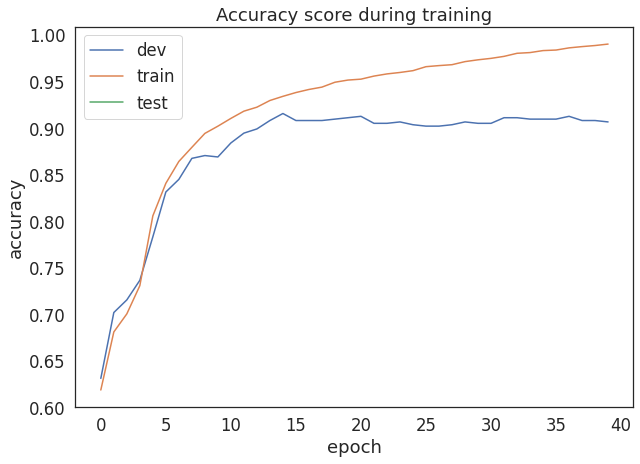

dev: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

09/10/2021 10:46:10 DEVSET RESULTS: [F1_score: 0.915942] [Loss: 0.304550] [Acc: 0.915663]



test: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

09/10/2021 10:46:10 DEVSET RESULTS: [F1_score: 0.561377] [Loss: 1.533094] [Acc: 0.563155]


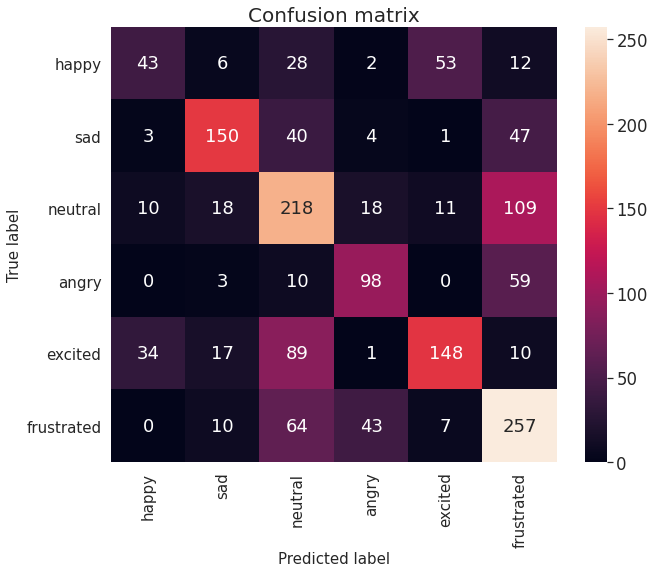

              precision    recall  f1-score   support

       happy       0.48      0.30      0.37       144
         sad       0.74      0.61      0.67       245
     neutral       0.49      0.57      0.52       384
       angry       0.59      0.58      0.58       170
     excited       0.67      0.49      0.57       299
  frustrated       0.52      0.67      0.59       381

    accuracy                           0.56      1623
   macro avg       0.58      0.54      0.55      1623
weighted avg       0.58      0.56      0.56      1623

09/10/2021 10:46:11 [TRAINING] Experiment 1, [WINDOW SIZE] 1
09/10/2021 10:46:11 Loaded data.
09/10/2021 10:46:11 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

09/10/2021 10:46:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

09/10/2021 10:46:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

09/10/2021 10:46:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

09/10/2021 10:46:32 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

09/10/2021 10:46:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

09/10/2021 10:46:44 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

09/10/2021 10:46:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

09/10/2021 10:47:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

09/10/2021 10:47:07 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

09/10/2021 10:47:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

09/10/2021 10:47:18 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

09/10/2021 10:47:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

09/10/2021 10:47:30 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.27it/s]

09/10/2021 10:47:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

09/10/2021 10:47:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

09/10/2021 10:47:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

09/10/2021 10:47:53 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

09/10/2021 10:47:59 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

09/10/2021 10:48:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

09/10/2021 10:48:11 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

09/10/2021 10:49:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

09/10/2021 10:50:04 [TEST RESULTS] Experiment 1, [WINDOW SIZE] 1



test: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


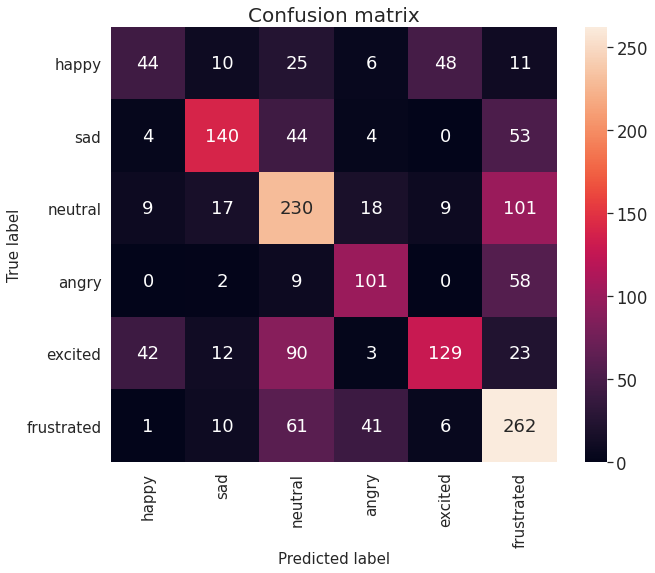

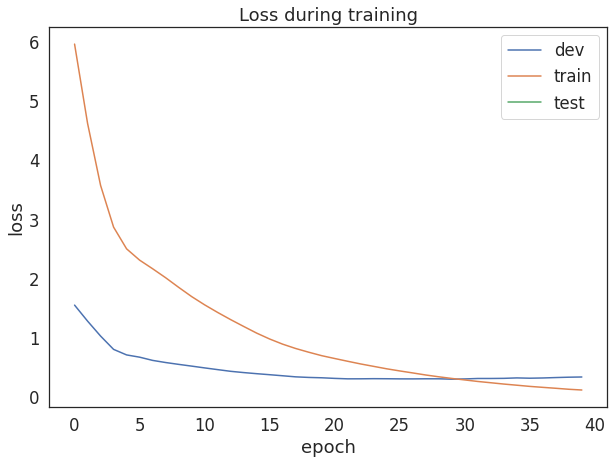

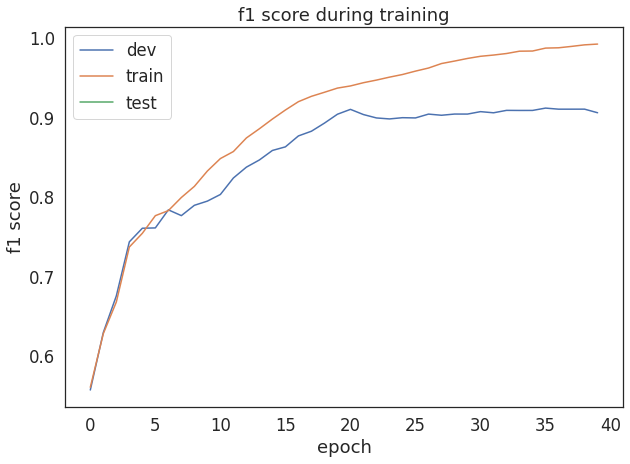

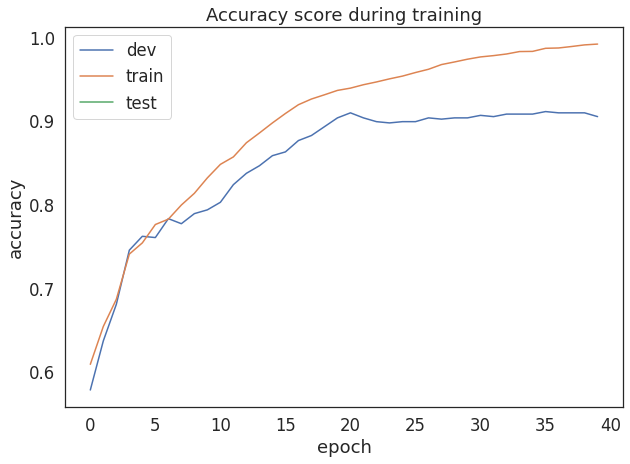

dev: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

09/10/2021 10:50:07 DEVSET RESULTS: [F1_score: 0.911307] [Loss: 0.318045] [Acc: 0.911145]



test: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

09/10/2021 10:50:07 DEVSET RESULTS: [F1_score: 0.554905] [Loss: 1.949509] [Acc: 0.558226]


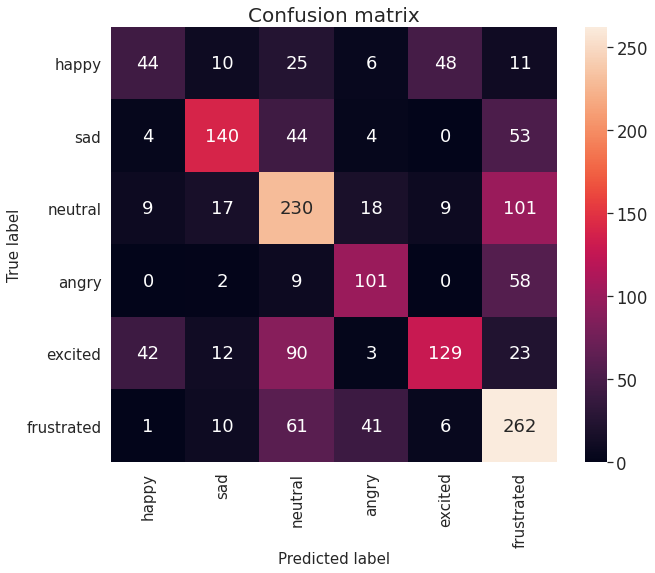

              precision    recall  f1-score   support

       happy       0.44      0.31      0.36       144
         sad       0.73      0.57      0.64       245
     neutral       0.50      0.60      0.55       384
       angry       0.58      0.59      0.59       170
     excited       0.67      0.43      0.53       299
  frustrated       0.52      0.69      0.59       381

    accuracy                           0.56      1623
   macro avg       0.57      0.53      0.54      1623
weighted avg       0.57      0.56      0.55      1623

09/10/2021 10:50:08 [TRAINING] Experiment 1, [WINDOW SIZE] 5
09/10/2021 10:50:08 Loaded data.
09/10/2021 10:50:08 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

09/10/2021 10:50:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

09/10/2021 10:50:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/10/2021 10:50:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

09/10/2021 10:50:45 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

09/10/2021 10:50:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

09/10/2021 10:51:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/10/2021 10:51:27 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

09/10/2021 10:51:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/10/2021 10:52:09 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

09/10/2021 10:52:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

09/10/2021 10:52:30 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

09/10/2021 10:52:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

09/10/2021 10:52:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/10/2021 10:53:00 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

09/10/2021 10:53:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

09/10/2021 10:53:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

09/10/2021 10:53:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

09/10/2021 10:54:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

09/10/2021 10:54:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

09/10/2021 10:54:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

09/10/2021 10:54:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

09/10/2021 10:55:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/10/2021 10:55:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

09/10/2021 10:55:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

09/10/2021 10:55:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

09/10/2021 10:55:45 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

09/10/2021 10:55:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/10/2021 10:56:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

09/10/2021 10:56:46 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

09/10/2021 10:57:02 [TEST RESULTS] Experiment 1, [WINDOW SIZE] 5



test: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


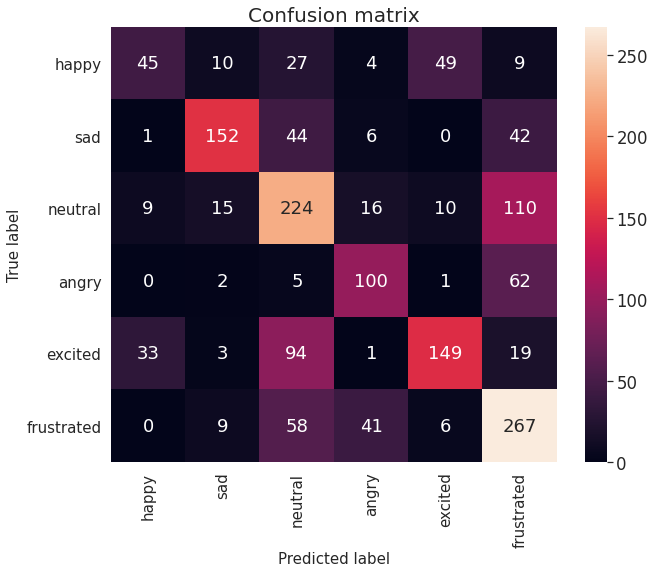

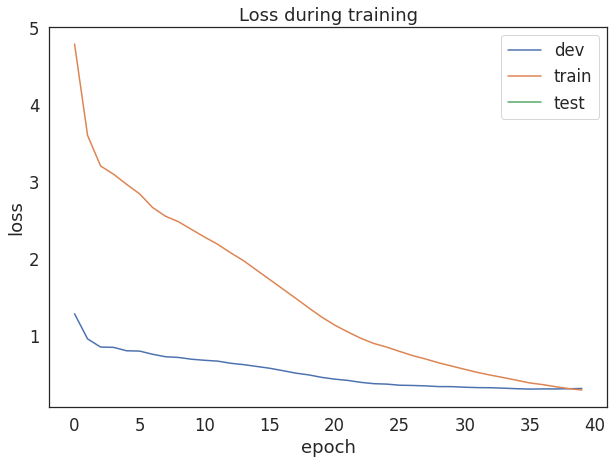

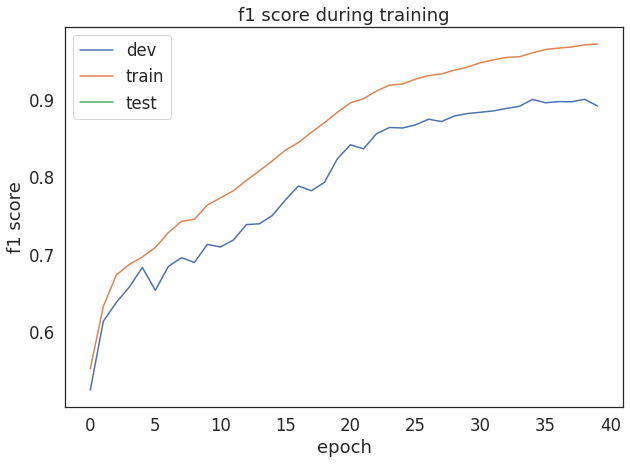

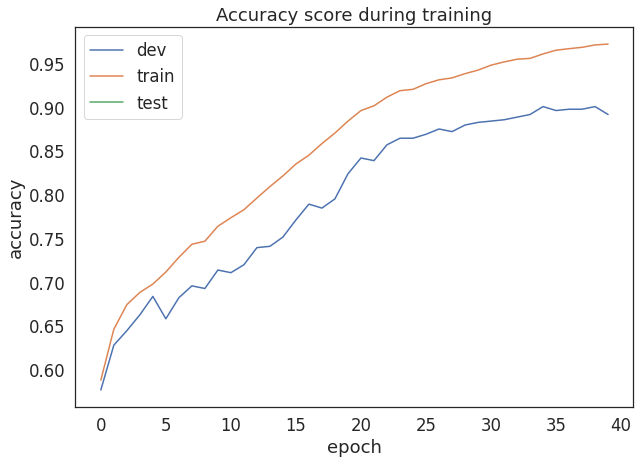

dev: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

09/10/2021 10:57:06 DEVSET RESULTS: [F1_score: 0.900626] [Loss: 0.316609] [Acc: 0.900602]



test: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

09/10/2021 10:57:08 DEVSET RESULTS: [F1_score: 0.576100] [Loss: 1.564709] [Acc: 0.577326]


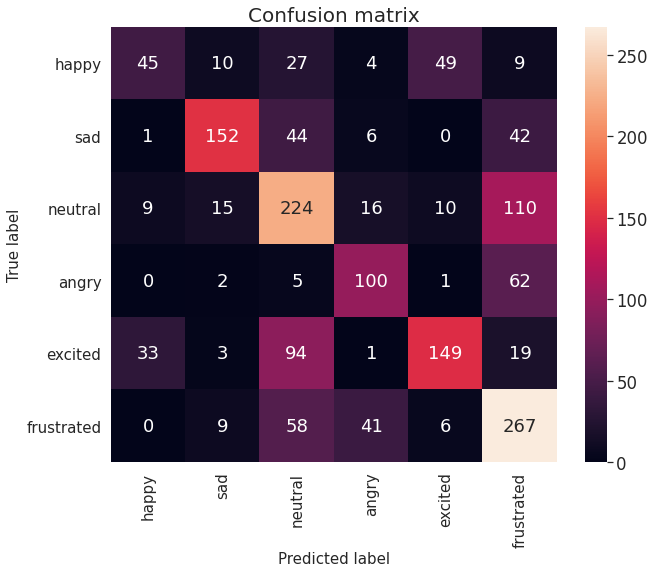

              precision    recall  f1-score   support

       happy       0.51      0.31      0.39       144
         sad       0.80      0.62      0.70       245
     neutral       0.50      0.58      0.54       384
       angry       0.60      0.59      0.59       170
     excited       0.69      0.50      0.58       299
  frustrated       0.52      0.70      0.60       381

    accuracy                           0.58      1623
   macro avg       0.60      0.55      0.57      1623
weighted avg       0.60      0.58      0.58      1623

09/10/2021 10:57:08 [TRAINING] Experiment 1, [WINDOW SIZE] 10
09/10/2021 10:57:09 Loaded data.
09/10/2021 10:57:09 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

09/10/2021 10:57:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

09/10/2021 10:57:32 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/10/2021 10:57:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/10/2021 10:58:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/10/2021 10:58:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

09/10/2021 10:59:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/10/2021 10:59:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

09/10/2021 10:59:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/10/2021 11:00:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/10/2021 11:00:18 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/10/2021 11:00:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/10/2021 11:00:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

09/10/2021 11:01:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

09/10/2021 11:01:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/10/2021 11:01:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

09/10/2021 11:01:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/10/2021 11:02:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

09/10/2021 11:02:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/10/2021 11:02:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/10/2021 11:02:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

09/10/2021 11:03:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

09/10/2021 11:03:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]

09/10/2021 11:03:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/10/2021 11:04:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

09/10/2021 11:04:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

09/10/2021 11:04:50 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/10/2021 11:05:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/10/2021 11:05:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/10/2021 11:05:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

09/10/2021 11:06:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

09/10/2021 11:07:15 [TEST RESULTS] Experiment 1, [WINDOW SIZE] 10



test: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


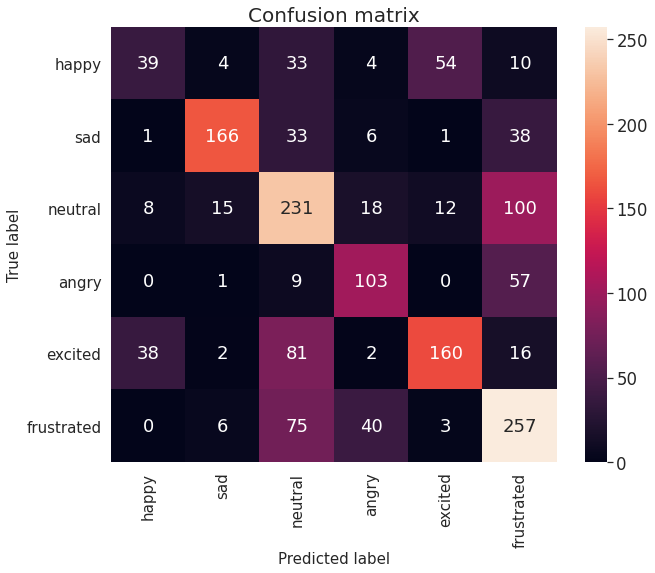

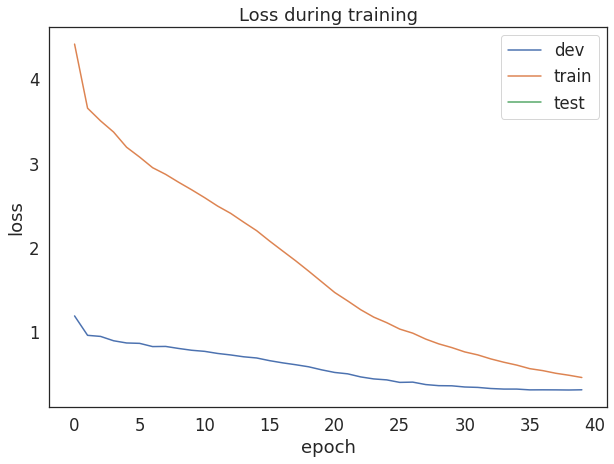

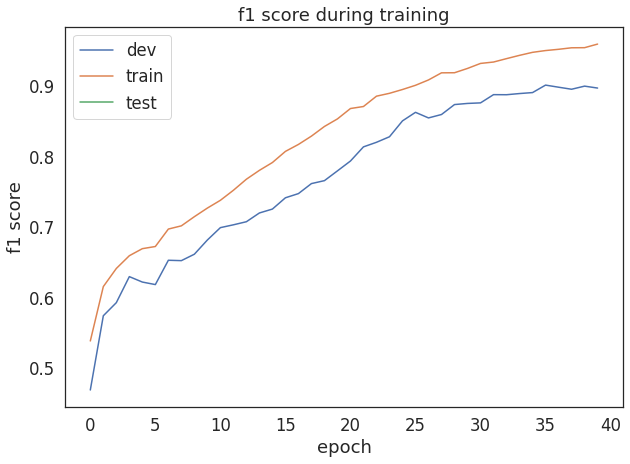

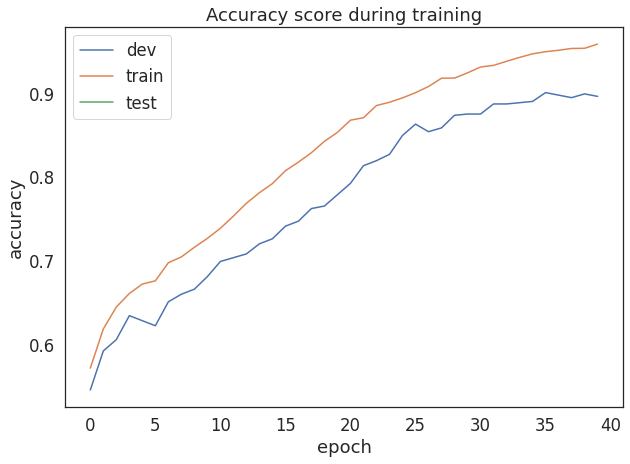

dev: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

09/10/2021 11:07:21 DEVSET RESULTS: [F1_score: 0.900533] [Loss: 0.313605] [Acc: 0.900602]



test: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]

09/10/2021 11:07:23 DEVSET RESULTS: [F1_score: 0.588274] [Loss: 1.327839] [Acc: 0.589033]


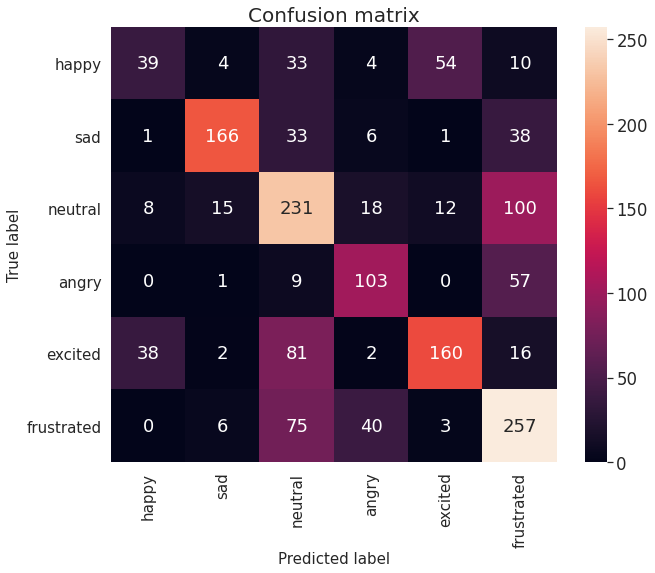

              precision    recall  f1-score   support

       happy       0.45      0.27      0.34       144
         sad       0.86      0.68      0.76       245
     neutral       0.50      0.60      0.55       384
       angry       0.60      0.61      0.60       170
     excited       0.70      0.54      0.60       299
  frustrated       0.54      0.67      0.60       381

    accuracy                           0.59      1623
   macro avg       0.61      0.56      0.57      1623
weighted avg       0.60      0.59      0.59      1623

09/10/2021 11:07:24 [TRAINING] Experiment 1, [WINDOW SIZE] 20
09/10/2021 11:07:24 Loaded data.
09/10/2021 11:07:24 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

09/10/2021 11:07:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]

09/10/2021 11:07:58 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

09/10/2021 11:08:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

09/10/2021 11:08:44 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]

09/10/2021 11:09:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

09/10/2021 11:09:53 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]

09/10/2021 11:10:40 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]

09/10/2021 11:11:03 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

09/10/2021 11:11:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]

09/10/2021 11:12:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

09/10/2021 11:12:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

09/10/2021 11:13:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]

09/10/2021 11:14:07 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

09/10/2021 11:14:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

09/10/2021 11:14:53 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]

09/10/2021 11:15:16 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]

09/10/2021 11:15:39 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

09/10/2021 11:16:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

09/10/2021 11:16:24 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]

09/10/2021 11:16:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

09/10/2021 11:17:10 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]

09/10/2021 11:17:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

09/10/2021 11:17:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]

09/10/2021 11:18:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

09/10/2021 11:18:42 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]

09/10/2021 11:19:06 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

09/10/2021 11:19:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

09/10/2021 11:19:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

09/10/2021 11:20:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

09/10/2021 11:20:38 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

09/10/2021 11:21:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]

09/10/2021 11:21:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

09/10/2021 11:21:50 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]

09/10/2021 11:22:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

09/10/2021 11:22:50 [TEST RESULTS] Experiment 1, [WINDOW SIZE] 20



test: 100%|██████████| 1/1 [00:03<00:00,  3.78s/it]


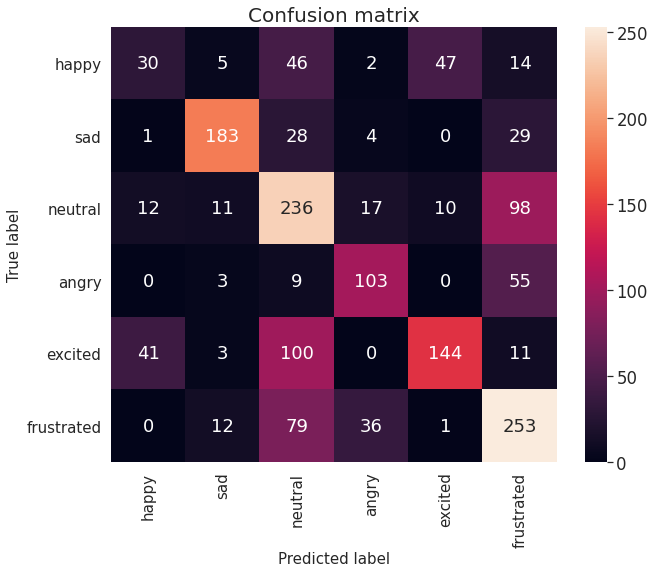

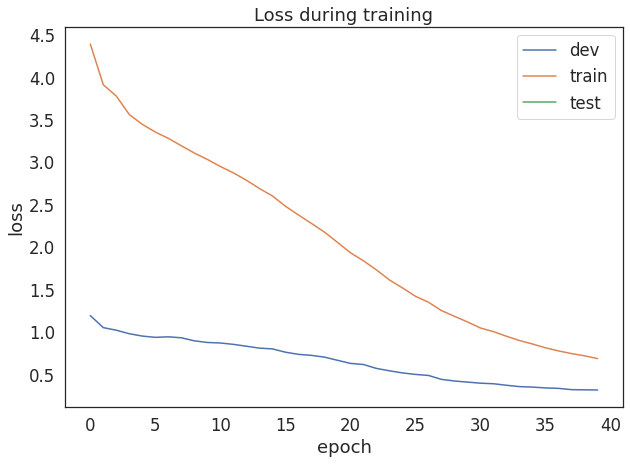

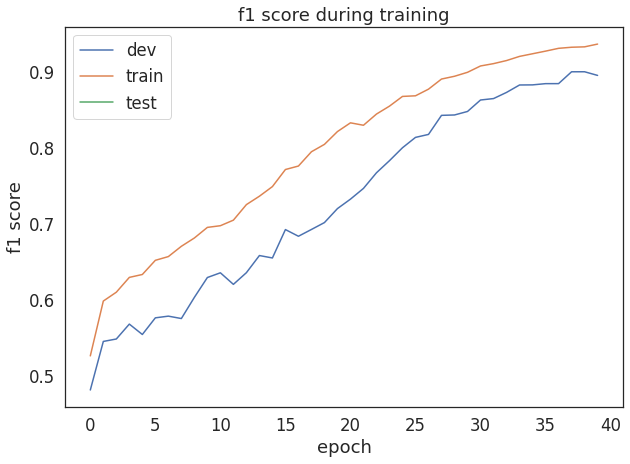

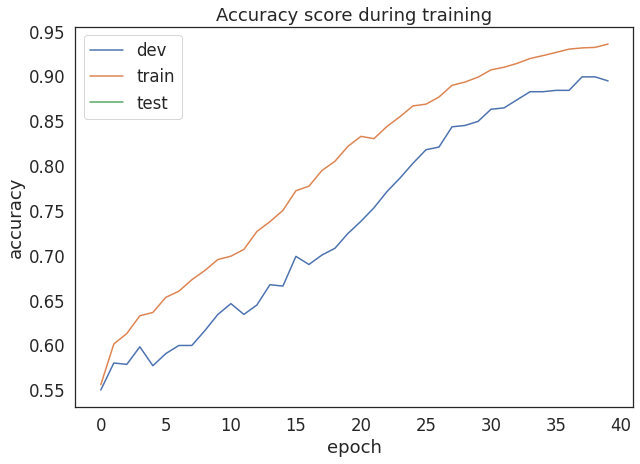

dev: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]

09/10/2021 11:22:57 DEVSET RESULTS: [F1_score: 0.899258] [Loss: 0.319873] [Acc: 0.899096]



test: 100%|██████████| 1/1 [00:04<00:00,  4.05s/it]

09/10/2021 11:23:01 DEVSET RESULTS: [F1_score: 0.581687] [Loss: 1.263826] [Acc: 0.584720]


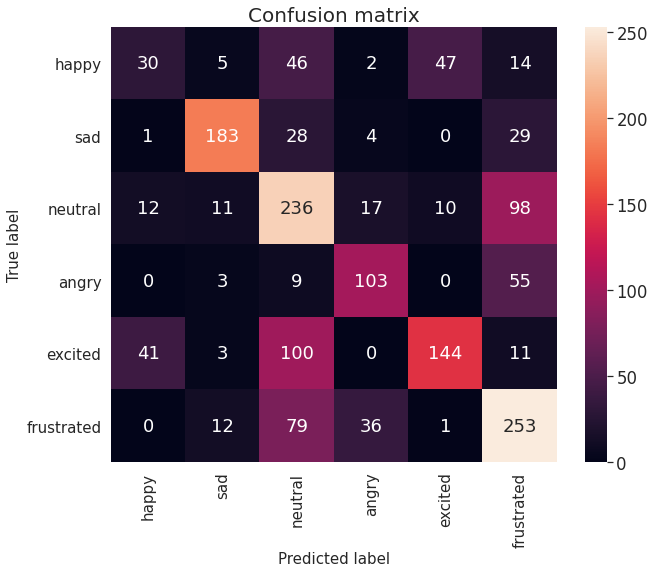

              precision    recall  f1-score   support

       happy       0.36      0.21      0.26       144
         sad       0.84      0.75      0.79       245
     neutral       0.47      0.61      0.54       384
       angry       0.64      0.61      0.62       170
     excited       0.71      0.48      0.57       299
  frustrated       0.55      0.66      0.60       381

    accuracy                           0.58      1623
   macro avg       0.60      0.55      0.56      1623
weighted avg       0.60      0.58      0.58      1623



In [ ]:
for windowsize in ws:
  train_windowsize(exp1=True,windowsize=windowsize)

## EXPERIMENT 2

09/10/2021 11:23:02 [TRAINING] Experiment 2, [WINDOW SIZE] 0
09/10/2021 11:23:02 Loaded data.
09/10/2021 11:23:02 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

09/10/2021 11:23:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

09/10/2021 11:23:11 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

09/10/2021 11:23:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

09/10/2021 11:23:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

09/10/2021 11:23:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

09/10/2021 11:23:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

09/10/2021 11:23:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

09/10/2021 11:23:45 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

09/10/2021 11:23:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

09/10/2021 11:23:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

09/10/2021 11:24:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

09/10/2021 11:24:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

09/10/2021 11:24:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

09/10/2021 11:24:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

09/10/2021 11:24:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

09/10/2021 11:24:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

09/10/2021 11:24:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

09/10/2021 11:24:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

09/10/2021 11:24:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

09/10/2021 11:24:59 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

09/10/2021 11:25:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

09/10/2021 11:25:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

09/10/2021 11:25:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

09/10/2021 11:26:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

09/10/2021 11:26:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

09/10/2021 11:26:50 [TEST RESULTS] Experiment 2, [WINDOW SIZE] 0



test: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


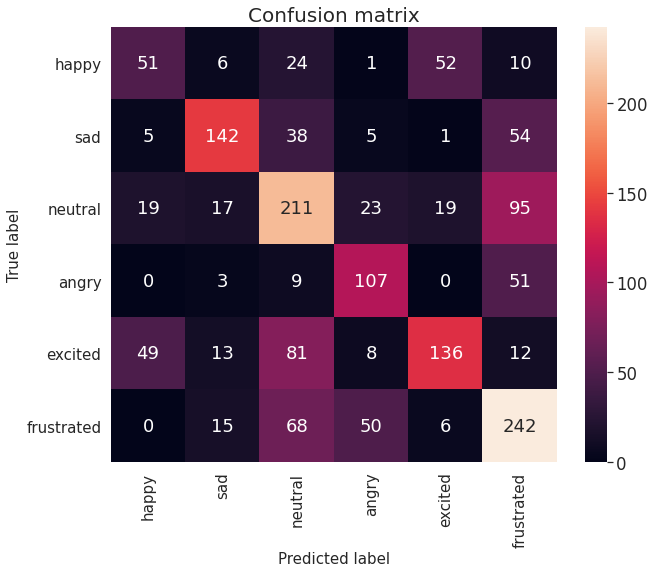

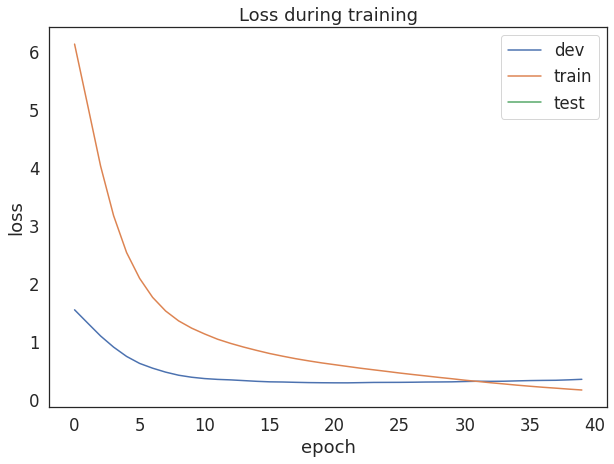

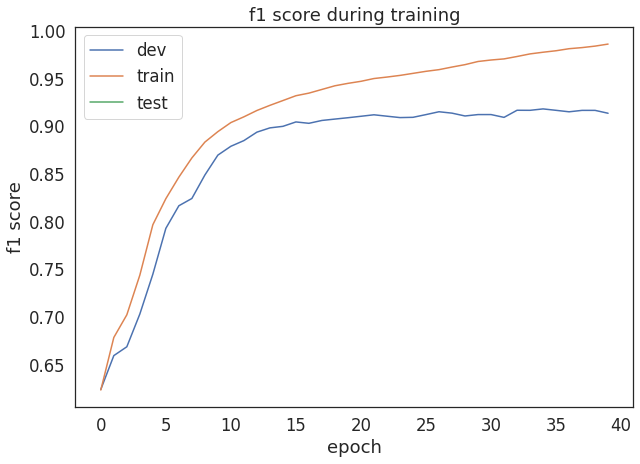

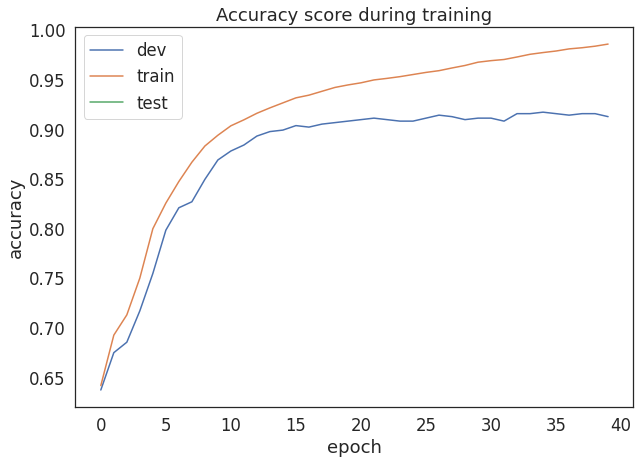

dev: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

09/10/2021 11:26:53 DEVSET RESULTS: [F1_score: 0.917786] [Loss: 0.318277] [Acc: 0.917169]



test: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

09/10/2021 11:26:53 DEVSET RESULTS: [F1_score: 0.547212] [Loss: 1.972636] [Acc: 0.547751]


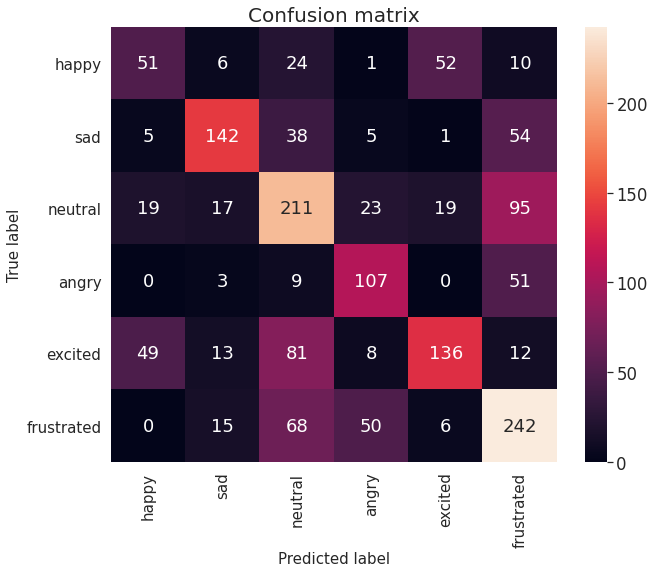

              precision    recall  f1-score   support

       happy       0.41      0.35      0.38       144
         sad       0.72      0.58      0.64       245
     neutral       0.49      0.55      0.52       384
       angry       0.55      0.63      0.59       170
     excited       0.64      0.45      0.53       299
  frustrated       0.52      0.64      0.57       381

    accuracy                           0.55      1623
   macro avg       0.56      0.53      0.54      1623
weighted avg       0.56      0.55      0.55      1623

09/10/2021 11:26:54 [TRAINING] Experiment 2, [WINDOW SIZE] 1
09/10/2021 11:26:54 Loaded data.
09/10/2021 11:26:54 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

09/10/2021 11:26:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

09/10/2021 11:27:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

09/10/2021 11:27:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

09/10/2021 11:27:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

09/10/2021 11:27:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

09/10/2021 11:27:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

09/10/2021 11:27:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

09/10/2021 11:27:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

09/10/2021 11:27:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

09/10/2021 11:28:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

09/10/2021 11:28:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

09/10/2021 11:28:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

09/10/2021 11:28:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

09/10/2021 11:28:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

09/10/2021 11:28:37 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

09/10/2021 11:28:44 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

09/10/2021 11:28:51 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

09/10/2021 11:28:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

09/10/2021 11:29:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

09/10/2021 11:29:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

09/10/2021 11:29:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

09/10/2021 11:29:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

09/10/2021 11:29:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

09/10/2021 11:29:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

09/10/2021 11:30:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

09/10/2021 11:31:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

09/10/2021 11:31:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

09/10/2021 11:31:39 [TEST RESULTS] Experiment 2, [WINDOW SIZE] 1



test: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


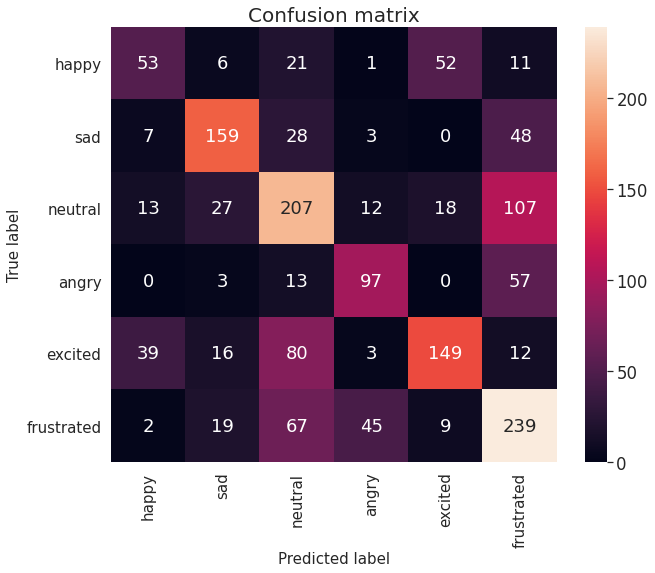

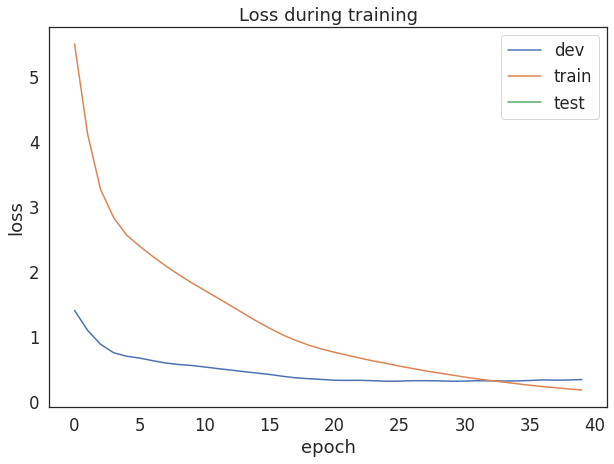

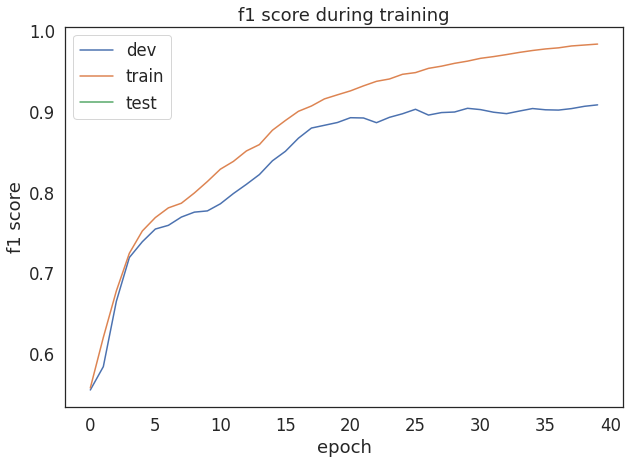

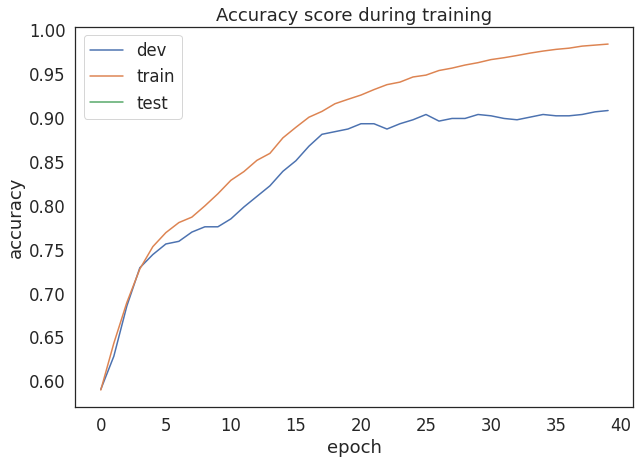

dev: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

09/10/2021 11:31:42 DEVSET RESULTS: [F1_score: 0.908474] [Loss: 0.344073] [Acc: 0.908133]



test: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/10/2021 11:31:43 DEVSET RESULTS: [F1_score: 0.556758] [Loss: 1.907808] [Acc: 0.556993]


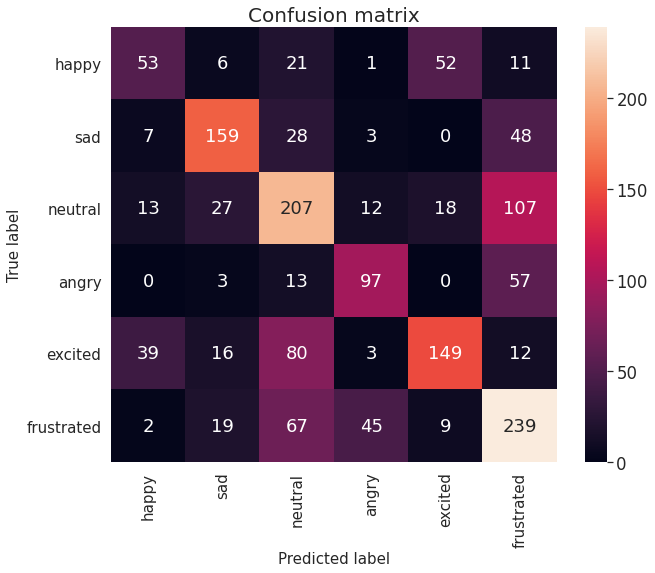

              precision    recall  f1-score   support

       happy       0.46      0.37      0.41       144
         sad       0.69      0.65      0.67       245
     neutral       0.50      0.54      0.52       384
       angry       0.60      0.57      0.59       170
     excited       0.65      0.50      0.57       299
  frustrated       0.50      0.63      0.56       381

    accuracy                           0.56      1623
   macro avg       0.57      0.54      0.55      1623
weighted avg       0.57      0.56      0.56      1623

09/10/2021 11:31:44 [TRAINING] Experiment 2, [WINDOW SIZE] 5
09/10/2021 11:31:44 Loaded data.
09/10/2021 11:31:44 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

09/10/2021 11:31:51 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

09/10/2021 11:32:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

09/10/2021 11:32:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

09/10/2021 11:32:37 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

09/10/2021 11:32:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

09/10/2021 11:33:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

09/10/2021 11:34:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

09/10/2021 11:34:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

09/10/2021 11:34:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

09/10/2021 11:34:59 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

09/10/2021 11:35:10 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

09/10/2021 11:35:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/10/2021 11:35:45 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

09/10/2021 11:35:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

09/10/2021 11:36:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

09/10/2021 11:36:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

09/10/2021 11:36:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

09/10/2021 11:36:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

09/10/2021 11:36:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

09/10/2021 11:37:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

09/10/2021 11:37:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

09/10/2021 11:37:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

09/10/2021 11:37:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

09/10/2021 11:37:52 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

09/10/2021 11:38:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

09/10/2021 11:38:27 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

09/10/2021 11:38:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

09/10/2021 11:39:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/10/2021 11:39:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

09/10/2021 11:39:32 [TEST RESULTS] Experiment 2, [WINDOW SIZE] 5



test: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


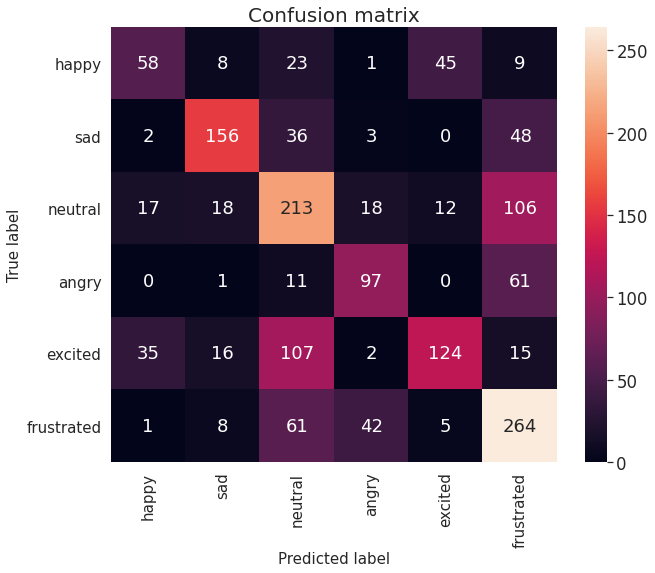

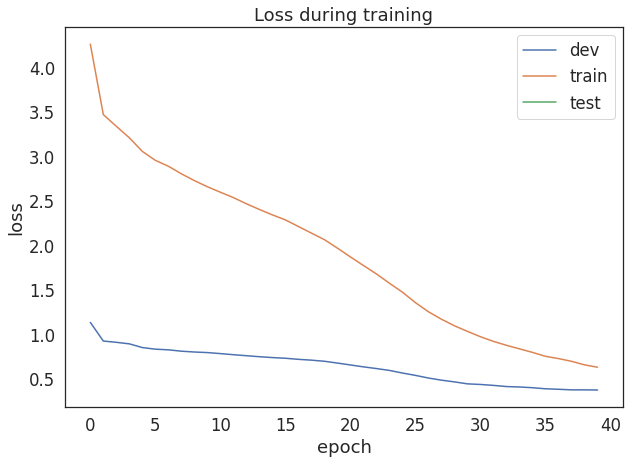

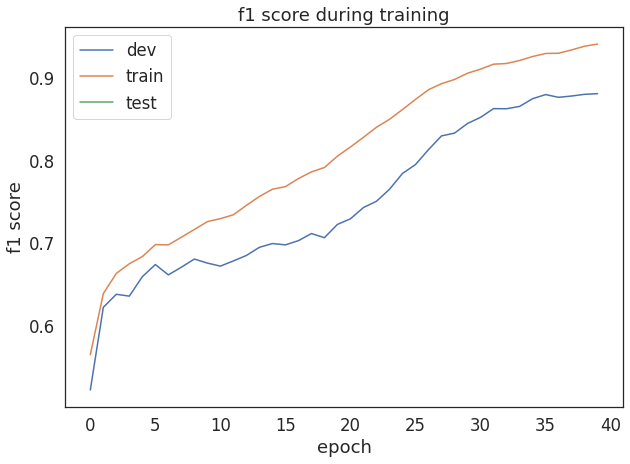

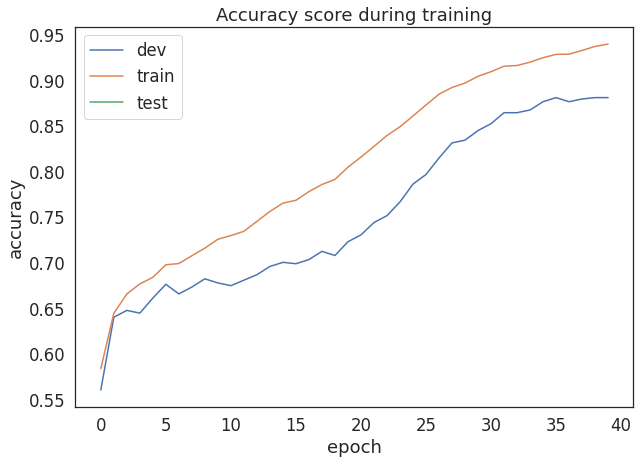

dev: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

09/10/2021 11:39:36 DEVSET RESULTS: [F1_score: 0.880073] [Loss: 0.371700] [Acc: 0.881024]



test: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]

09/10/2021 11:39:38 DEVSET RESULTS: [F1_score: 0.560392] [Loss: 1.399713] [Acc: 0.561922]


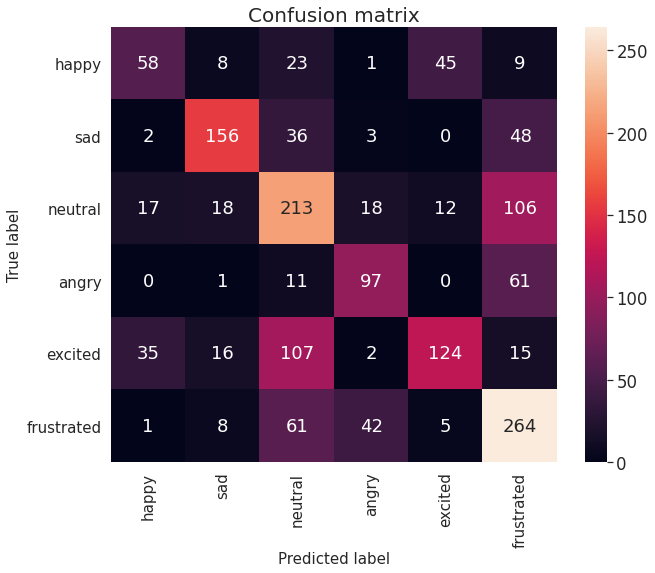

              precision    recall  f1-score   support

       happy       0.51      0.40      0.45       144
         sad       0.75      0.64      0.69       245
     neutral       0.47      0.55      0.51       384
       angry       0.60      0.57      0.58       170
     excited       0.67      0.41      0.51       299
  frustrated       0.52      0.69      0.60       381

    accuracy                           0.56      1623
   macro avg       0.59      0.55      0.56      1623
weighted avg       0.58      0.56      0.56      1623

09/10/2021 11:39:39 [TRAINING] Experiment 2, [WINDOW SIZE] 10
09/10/2021 11:39:39 Loaded data.
09/10/2021 11:39:39 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/10/2021 11:39:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

09/10/2021 11:40:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/10/2021 11:40:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/10/2021 11:40:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/10/2021 11:40:53 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/10/2021 11:42:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/10/2021 11:42:49 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 11:43:06 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/10/2021 11:45:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 11:45:18 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

09/10/2021 11:45:51 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/10/2021 11:46:24 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

09/10/2021 11:46:58 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/10/2021 11:47:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

09/10/2021 11:47:31 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/10/2021 11:47:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

09/10/2021 11:48:03 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/10/2021 11:48:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

09/10/2021 11:48:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/10/2021 11:48:54 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/10/2021 11:49:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/10/2021 11:49:44 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/10/2021 11:50:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

09/10/2021 11:50:17 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

09/10/2021 11:50:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/10/2021 11:50:42 [TEST RESULTS] Experiment 2, [WINDOW SIZE] 10



test: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


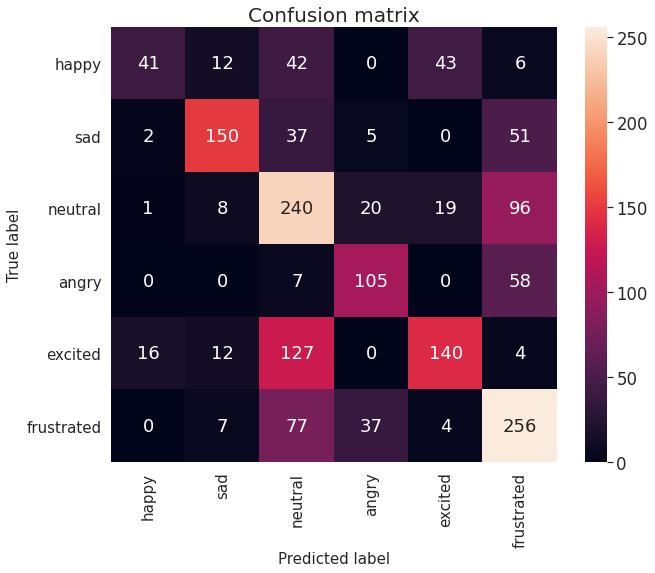

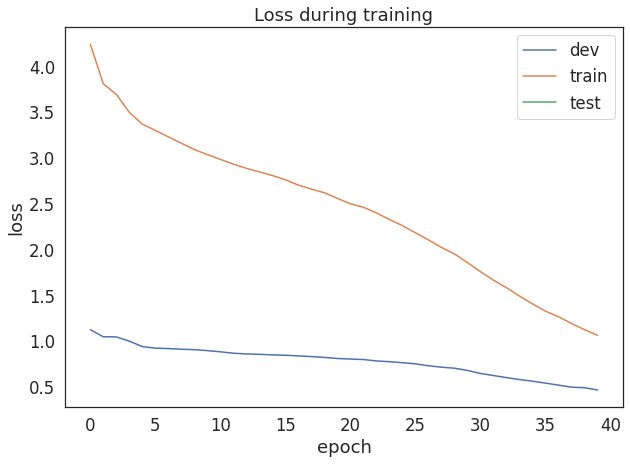

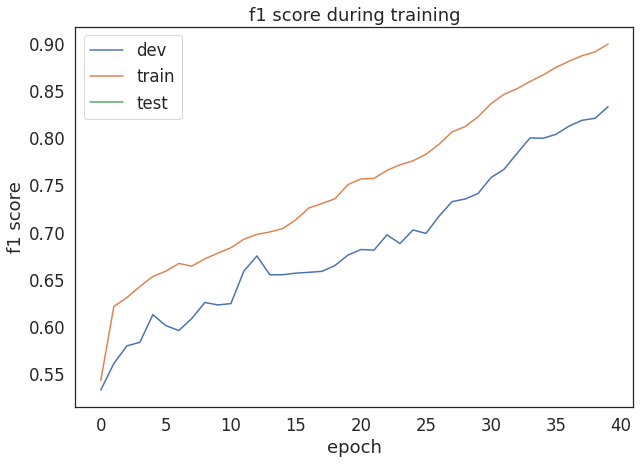

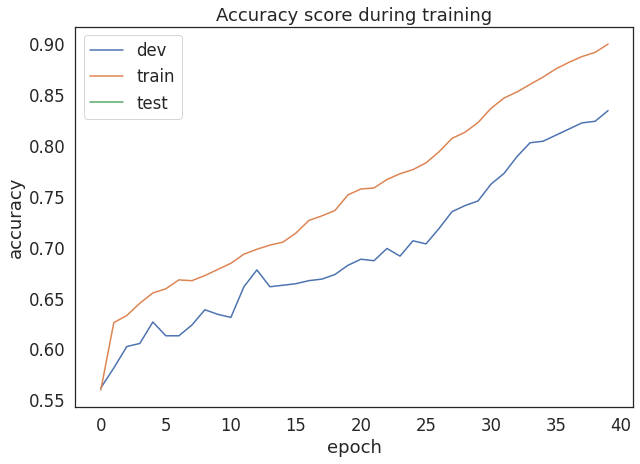

dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/10/2021 11:50:47 DEVSET RESULTS: [F1_score: 0.833286] [Loss: 0.463397] [Acc: 0.834337]



test: 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]

09/10/2021 11:50:50 DEVSET RESULTS: [F1_score: 0.572751] [Loss: 1.179425] [Acc: 0.574245]


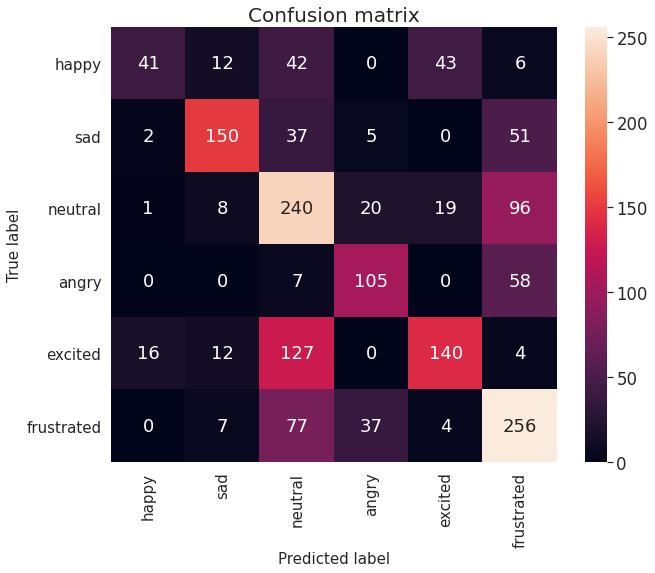

              precision    recall  f1-score   support

       happy       0.68      0.28      0.40       144
         sad       0.79      0.61      0.69       245
     neutral       0.45      0.62      0.53       384
       angry       0.63      0.62      0.62       170
     excited       0.68      0.47      0.55       299
  frustrated       0.54      0.67      0.60       381

    accuracy                           0.57      1623
   macro avg       0.63      0.55      0.57      1623
weighted avg       0.61      0.57      0.57      1623

09/10/2021 11:50:51 [TRAINING] Experiment 2, [WINDOW SIZE] 20
09/10/2021 11:50:51 Loaded data.
09/10/2021 11:50:51 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

09/10/2021 11:51:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

09/10/2021 11:51:25 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

09/10/2021 11:51:49 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]

09/10/2021 11:52:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]

09/10/2021 11:53:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

09/10/2021 11:53:25 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]

09/10/2021 11:54:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

09/10/2021 11:56:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

09/10/2021 11:57:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

09/10/2021 11:57:24 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]

09/10/2021 11:58:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]

09/10/2021 11:59:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]

09/10/2021 11:59:48 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

09/11/2021 12:00:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]

09/11/2021 12:00:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

09/11/2021 12:01:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

09/11/2021 12:01:25 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]

09/11/2021 12:01:49 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]

09/11/2021 12:02:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

09/11/2021 12:03:25 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]

09/11/2021 12:04:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]

09/11/2021 12:06:09 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

09/11/2021 12:06:48 [TEST RESULTS] Experiment 2, [WINDOW SIZE] 20



test: 100%|██████████| 1/1 [00:04<00:00,  4.04s/it]


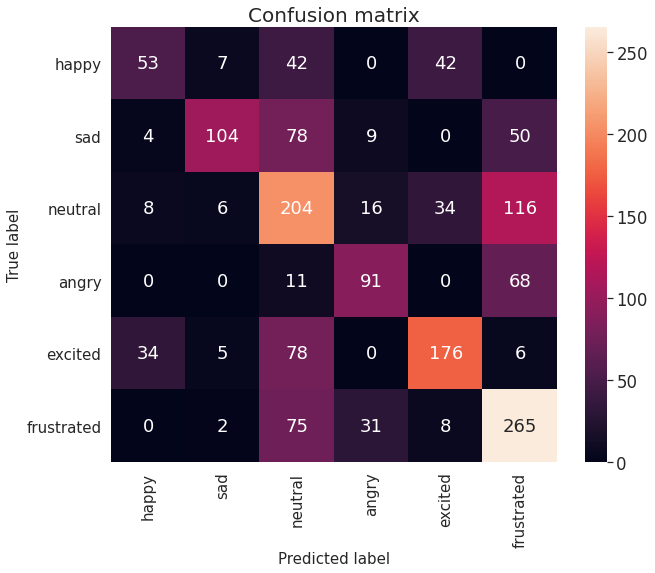

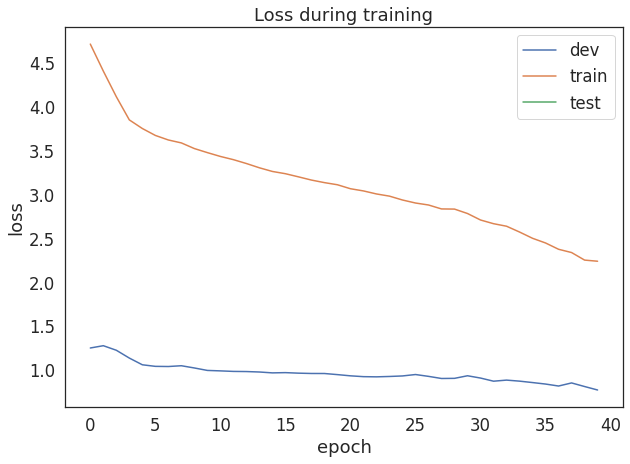

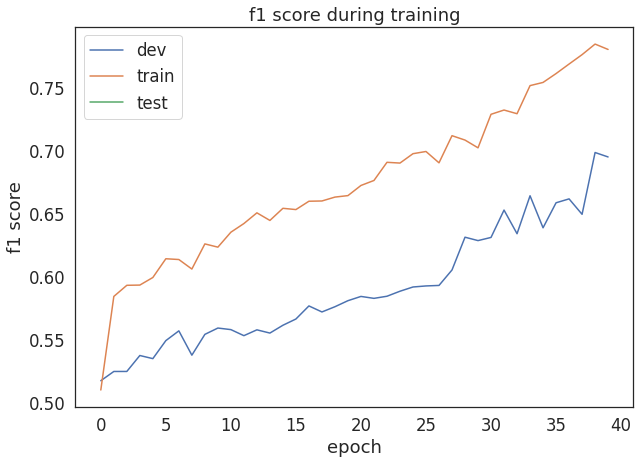

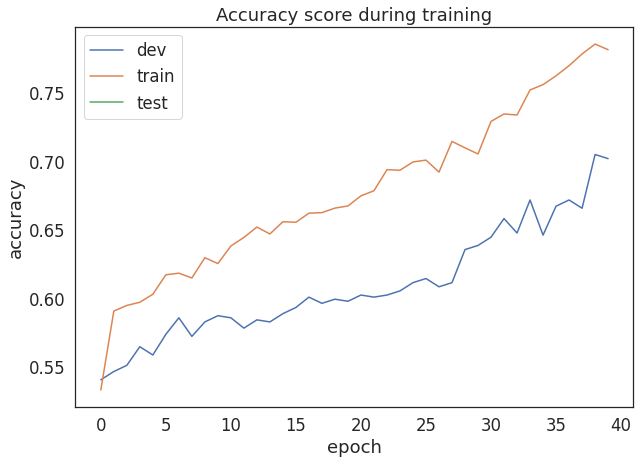

dev: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]

09/11/2021 12:06:56 DEVSET RESULTS: [F1_score: 0.698213] [Loss: 0.811823] [Acc: 0.704819]



test: 100%|██████████| 1/1 [00:04<00:00,  4.22s/it]

09/11/2021 12:07:00 DEVSET RESULTS: [F1_score: 0.551067] [Loss: 1.056255] [Acc: 0.550216]


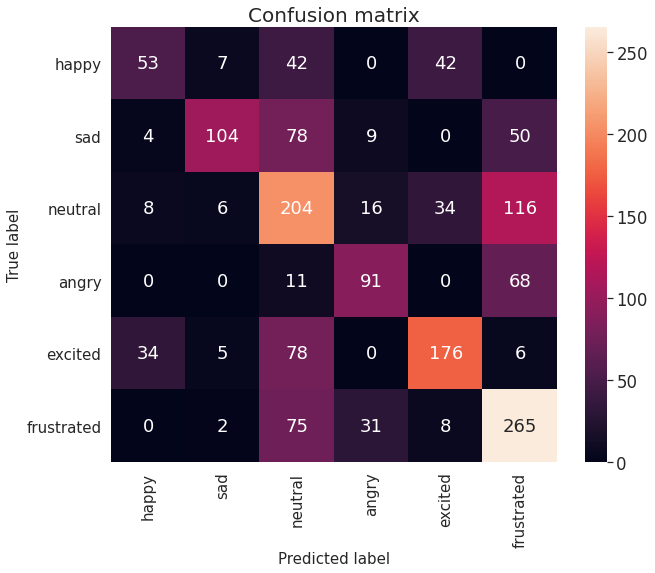

              precision    recall  f1-score   support

       happy       0.54      0.37      0.44       144
         sad       0.84      0.42      0.56       245
     neutral       0.42      0.53      0.47       384
       angry       0.62      0.54      0.57       170
     excited       0.68      0.59      0.63       299
  frustrated       0.52      0.70      0.60       381

    accuracy                           0.55      1623
   macro avg       0.60      0.52      0.54      1623
weighted avg       0.59      0.55      0.55      1623



In [ ]:
for windowsize in ws:
  train_windowsize(multim=True, windowsize=windowsize)

##EXPERIMENT 3

09/11/2021 12:07:01 [TRAINING] Experiment 3, [WINDOW SIZE] 0
09/11/2021 12:07:01 Loaded data.
09/11/2021 12:07:01 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

09/11/2021 12:07:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

09/11/2021 12:07:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

09/11/2021 12:07:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

09/11/2021 12:07:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

09/11/2021 12:07:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

09/11/2021 12:07:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

09/11/2021 12:07:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

09/11/2021 12:07:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

09/11/2021 12:08:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

09/11/2021 12:08:11 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

09/11/2021 12:08:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

09/11/2021 12:08:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

09/11/2021 12:08:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

09/11/2021 12:08:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

09/11/2021 12:09:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

09/11/2021 12:11:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

09/11/2021 12:11:55 [TEST RESULTS] Experiment 3, [WINDOW SIZE] 0



test: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


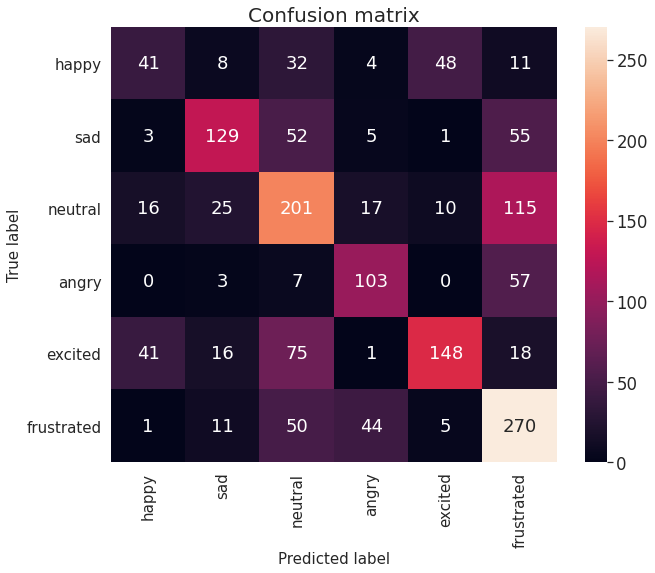

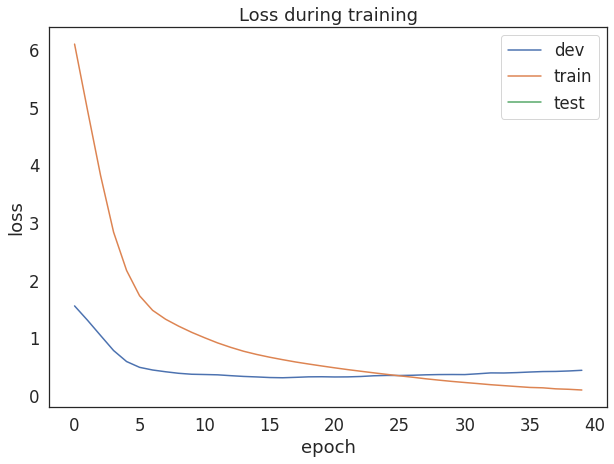

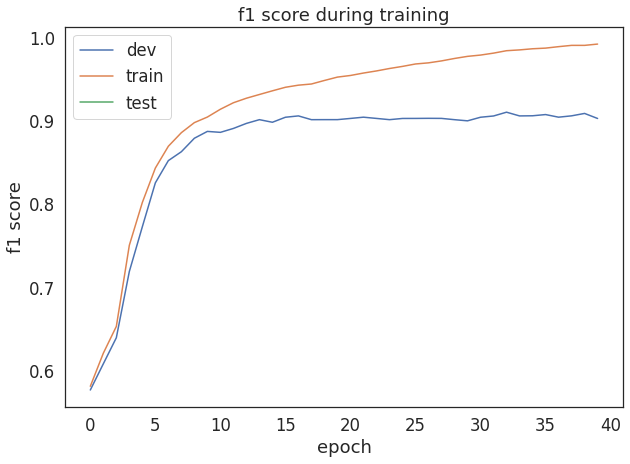

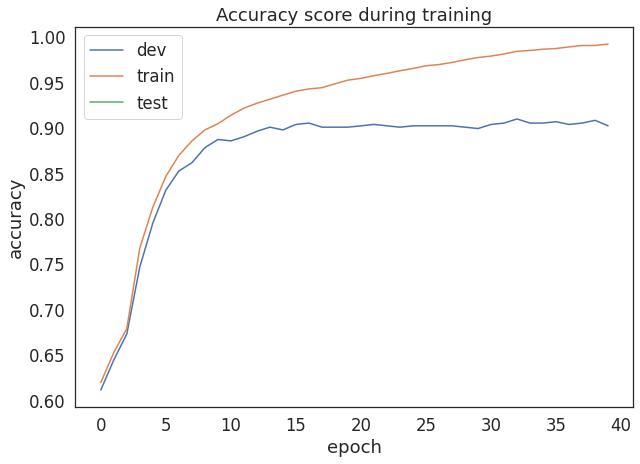

dev: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

09/11/2021 12:11:58 DEVSET RESULTS: [F1_score: 0.910180] [Loss: 0.393910] [Acc: 0.909639]



test: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

09/11/2021 12:11:59 DEVSET RESULTS: [F1_score: 0.546642] [Loss: 2.065222] [Acc: 0.549600]


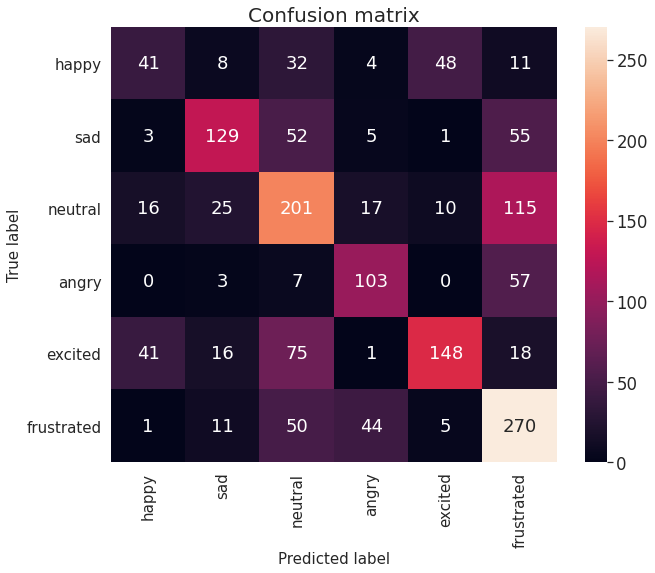

              precision    recall  f1-score   support

       happy       0.40      0.28      0.33       144
         sad       0.67      0.53      0.59       245
     neutral       0.48      0.52      0.50       384
       angry       0.59      0.61      0.60       170
     excited       0.70      0.49      0.58       299
  frustrated       0.51      0.71      0.60       381

    accuracy                           0.55      1623
   macro avg       0.56      0.52      0.53      1623
weighted avg       0.56      0.55      0.55      1623

09/11/2021 12:11:59 [TRAINING] Experiment 3, [WINDOW SIZE] 1
09/11/2021 12:11:59 Loaded data.
09/11/2021 12:11:59 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

09/11/2021 12:12:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

09/11/2021 12:12:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

09/11/2021 12:12:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

09/11/2021 12:12:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

09/11/2021 12:12:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

09/11/2021 12:12:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

09/11/2021 12:12:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

09/11/2021 12:13:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

09/11/2021 12:13:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

09/11/2021 12:13:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

09/11/2021 12:13:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

09/11/2021 12:13:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

09/11/2021 12:13:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

09/11/2021 12:13:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

09/11/2021 12:14:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

09/11/2021 12:14:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

09/11/2021 12:14:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

09/11/2021 12:14:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

09/11/2021 12:14:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

09/11/2021 12:14:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

09/11/2021 12:14:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

09/11/2021 12:16:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

09/11/2021 12:16:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

09/11/2021 12:17:42 [TEST RESULTS] Experiment 3, [WINDOW SIZE] 1



test: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


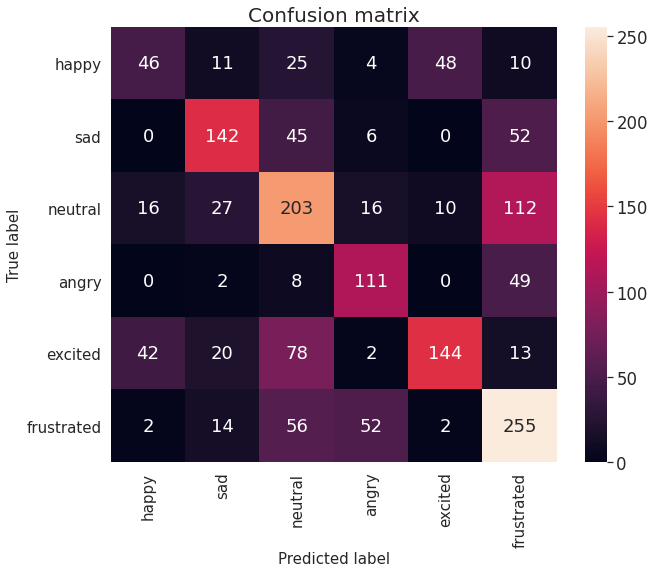

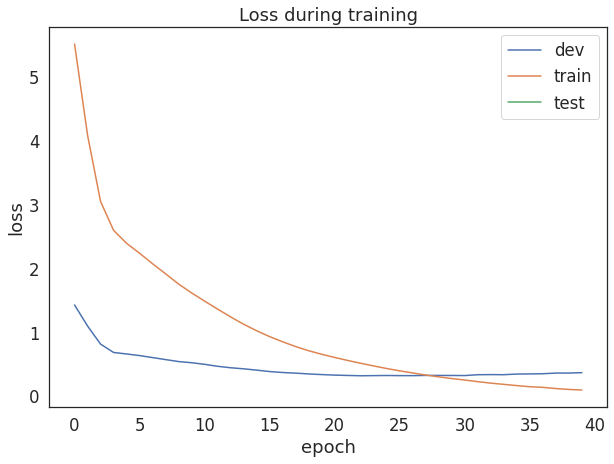

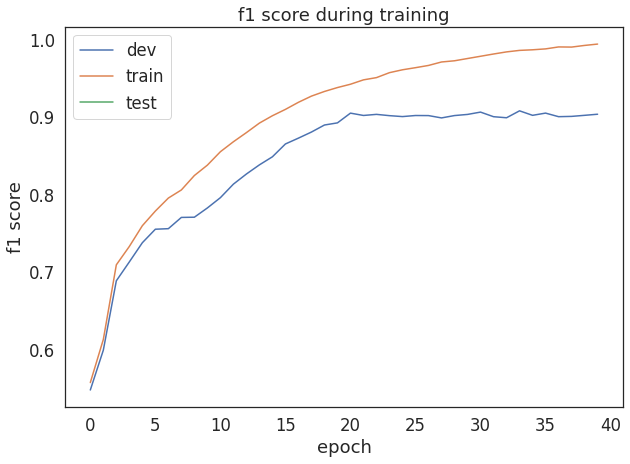

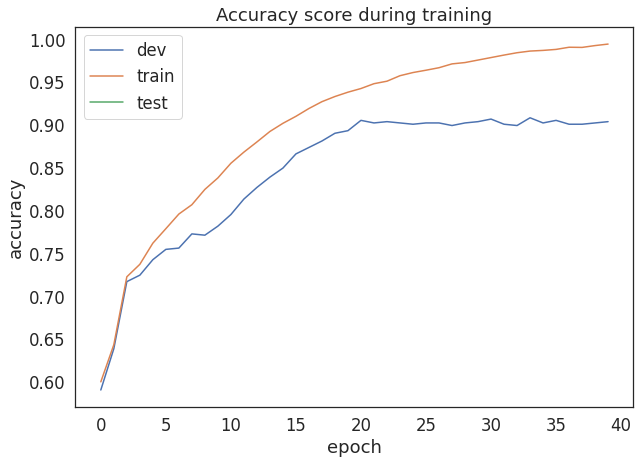

dev: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

09/11/2021 12:17:45 DEVSET RESULTS: [F1_score: 0.907959] [Loss: 0.333965] [Acc: 0.908133]



test: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

09/11/2021 12:17:46 DEVSET RESULTS: [F1_score: 0.553063] [Loss: 1.873915] [Acc: 0.555145]


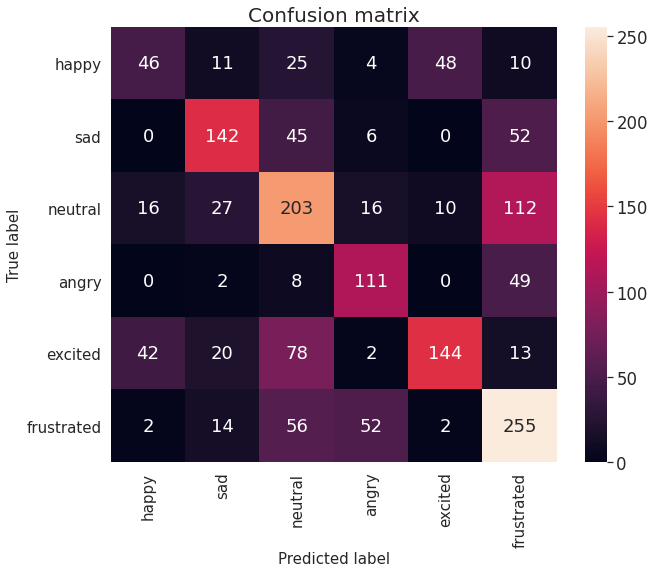

              precision    recall  f1-score   support

       happy       0.43      0.32      0.37       144
         sad       0.66      0.58      0.62       245
     neutral       0.49      0.53      0.51       384
       angry       0.58      0.65      0.61       170
     excited       0.71      0.48      0.57       299
  frustrated       0.52      0.67      0.58       381

    accuracy                           0.56      1623
   macro avg       0.56      0.54      0.54      1623
weighted avg       0.57      0.56      0.55      1623

09/11/2021 12:17:46 [TRAINING] Experiment 3, [WINDOW SIZE] 5
09/11/2021 12:17:46 Loaded data.
09/11/2021 12:17:46 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

09/11/2021 12:17:54 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 12:18:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

09/11/2021 12:18:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

09/11/2021 12:18:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

09/11/2021 12:19:00 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

09/11/2021 12:19:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

09/11/2021 12:19:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

09/11/2021 12:19:53 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

09/11/2021 12:20:06 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

09/11/2021 12:20:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 12:20:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

09/11/2021 12:20:46 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

09/11/2021 12:20:59 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

09/11/2021 12:21:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 12:21:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

09/11/2021 12:21:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

09/11/2021 12:21:52 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

09/11/2021 12:22:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

09/11/2021 12:22:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

09/11/2021 12:22:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

09/11/2021 12:22:44 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

09/11/2021 12:22:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

09/11/2021 12:23:10 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

09/11/2021 12:23:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

09/11/2021 12:23:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 12:24:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

09/11/2021 12:24:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 12:25:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

09/11/2021 12:25:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

09/11/2021 12:25:46 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

09/11/2021 12:26:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 12:26:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

09/11/2021 12:26:32 [TEST RESULTS] Experiment 3, [WINDOW SIZE] 5



test: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


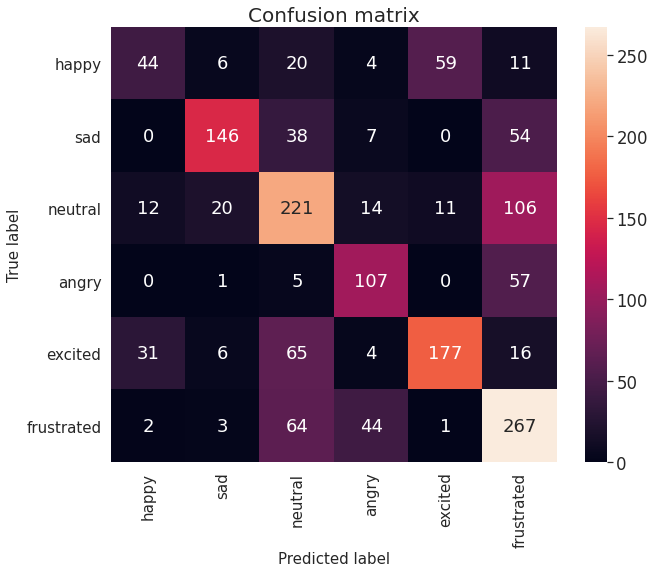

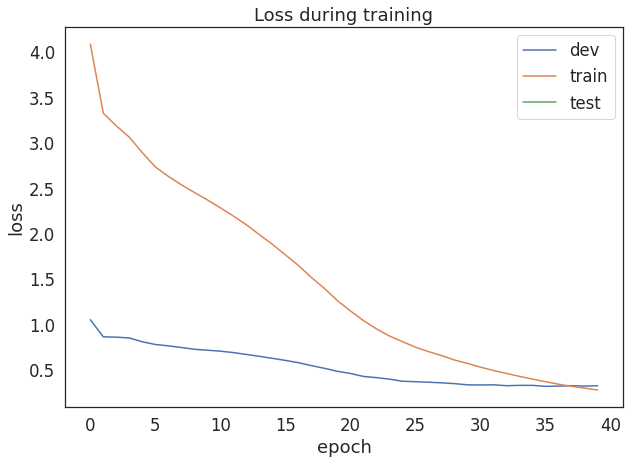

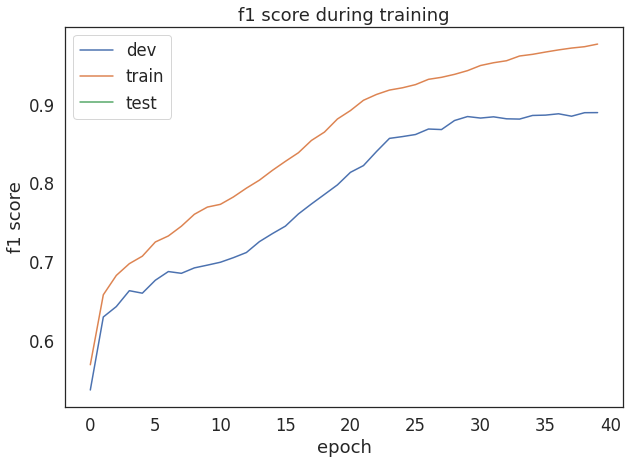

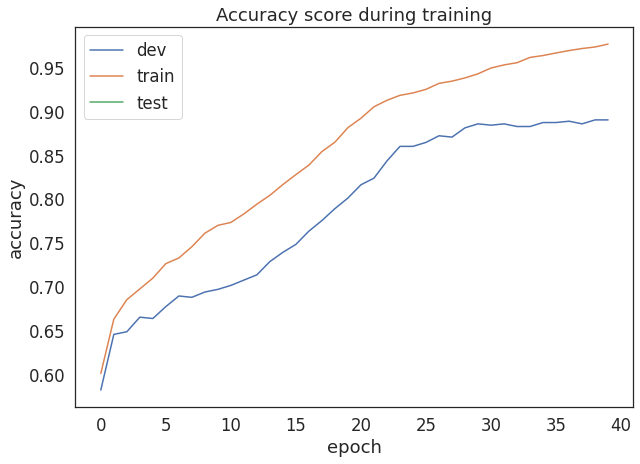

dev: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

09/11/2021 12:26:36 DEVSET RESULTS: [F1_score: 0.889366] [Loss: 0.326141] [Acc: 0.890060]



test: 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]

09/11/2021 12:26:38 DEVSET RESULTS: [F1_score: 0.591755] [Loss: 1.522556] [Acc: 0.592730]


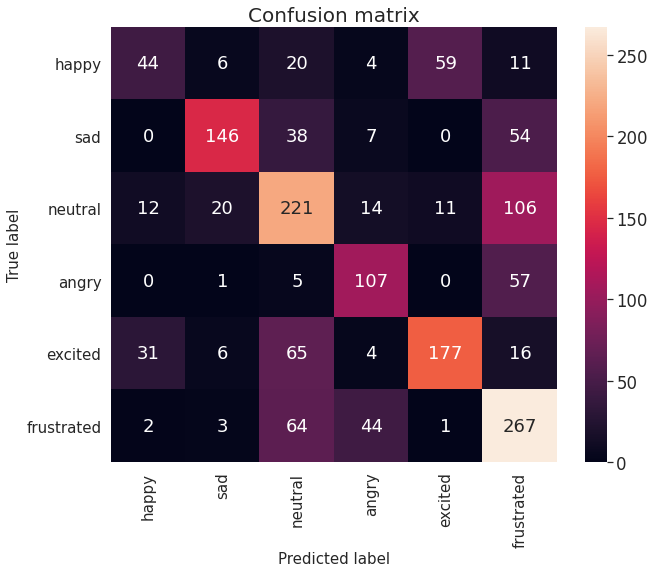

              precision    recall  f1-score   support

       happy       0.49      0.31      0.38       144
         sad       0.80      0.60      0.68       245
     neutral       0.54      0.58      0.55       384
       angry       0.59      0.63      0.61       170
     excited       0.71      0.59      0.65       299
  frustrated       0.52      0.70      0.60       381

    accuracy                           0.59      1623
   macro avg       0.61      0.57      0.58      1623
weighted avg       0.61      0.59      0.59      1623

09/11/2021 12:26:38 [TRAINING] Experiment 3, [WINDOW SIZE] 10
09/11/2021 12:26:38 Loaded data.
09/11/2021 12:26:38 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

09/11/2021 12:26:48 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 12:27:06 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

09/11/2021 12:27:23 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/11/2021 12:27:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/11/2021 12:28:34 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

09/11/2021 12:28:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/11/2021 12:29:09 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/11/2021 12:29:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/11/2021 12:30:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/11/2021 12:30:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/11/2021 12:30:54 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/11/2021 12:31:11 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/11/2021 12:31:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

09/11/2021 12:31:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

09/11/2021 12:32:05 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/11/2021 12:32:23 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

09/11/2021 12:32:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]

09/11/2021 12:32:58 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

09/11/2021 12:33:16 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/11/2021 12:33:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

09/11/2021 12:34:10 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

09/11/2021 12:34:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/11/2021 12:34:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

09/11/2021 12:35:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/11/2021 12:35:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/11/2021 12:35:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

09/11/2021 12:36:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

09/11/2021 12:37:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

09/11/2021 12:37:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 12:38:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 12:38:25 [TEST RESULTS] Experiment 3, [WINDOW SIZE] 10



test: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


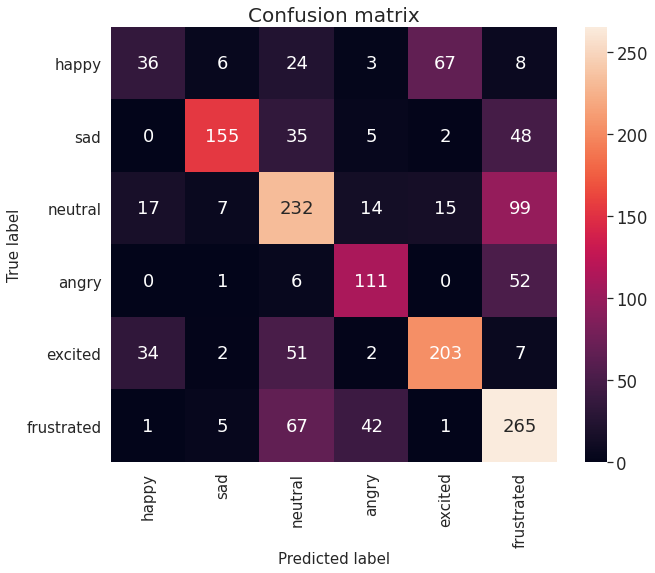

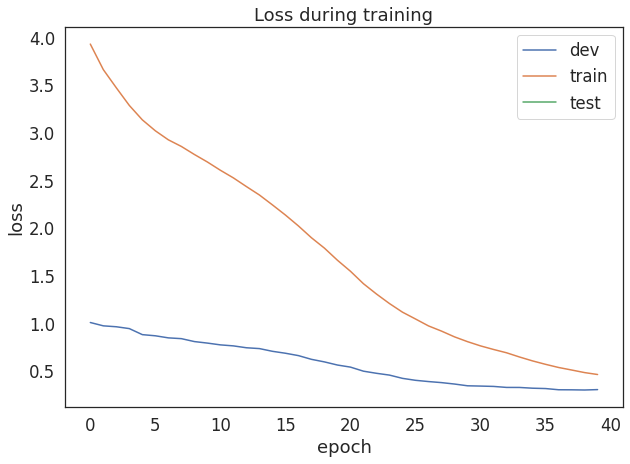

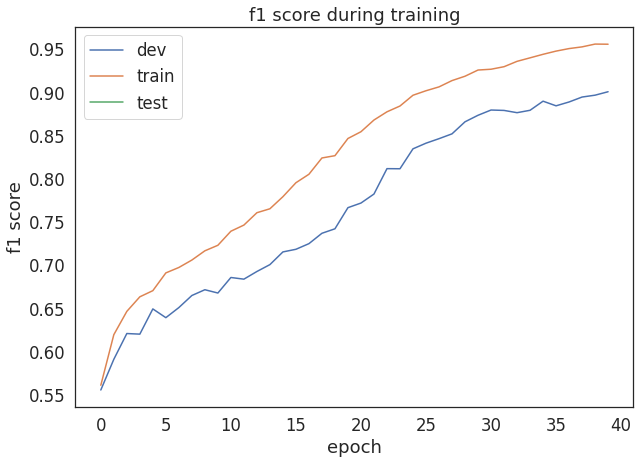

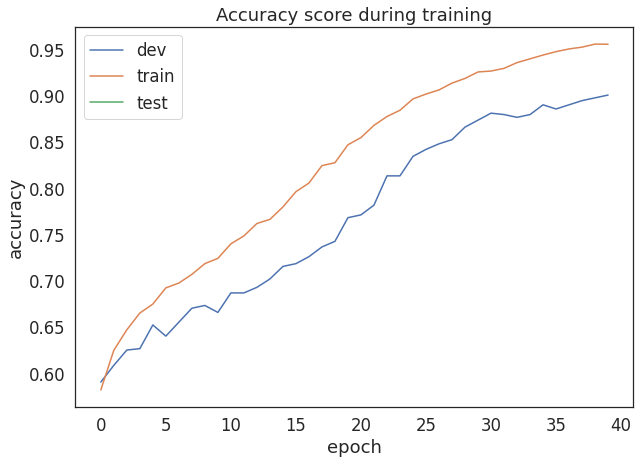

dev: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

09/11/2021 12:38:31 DEVSET RESULTS: [F1_score: 0.900523] [Loss: 0.304831] [Acc: 0.900602]



test: 100%|██████████| 1/1 [00:02<00:00,  2.56s/it]

09/11/2021 12:38:33 DEVSET RESULTS: [F1_score: 0.615194] [Loss: 1.296665] [Acc: 0.617375]


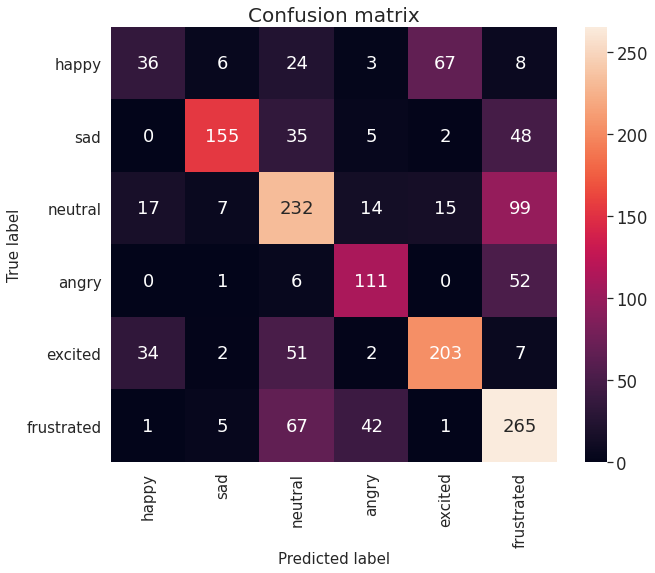

              precision    recall  f1-score   support

       happy       0.41      0.25      0.31       144
         sad       0.88      0.63      0.74       245
     neutral       0.56      0.60      0.58       384
       angry       0.63      0.65      0.64       170
     excited       0.70      0.68      0.69       299
  frustrated       0.55      0.70      0.62       381

    accuracy                           0.62      1623
   macro avg       0.62      0.59      0.60      1623
weighted avg       0.63      0.62      0.62      1623

09/11/2021 12:38:34 [TRAINING] Experiment 3, [WINDOW SIZE] 20
09/11/2021 12:38:34 Loaded data.
09/11/2021 12:38:34 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]

09/11/2021 12:38:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

09/11/2021 12:39:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]

09/11/2021 12:39:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

09/11/2021 12:40:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]

09/11/2021 12:40:54 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]

09/11/2021 12:42:10 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]

09/11/2021 12:42:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

09/11/2021 12:43:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

09/11/2021 12:44:43 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]

09/11/2021 12:45:08 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]

09/11/2021 12:45:34 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

09/11/2021 12:45:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

09/11/2021 12:47:18 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

09/11/2021 12:47:44 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

09/11/2021 12:48:09 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]

09/11/2021 12:48:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

09/11/2021 12:49:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

09/11/2021 12:49:51 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]

09/11/2021 12:50:16 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]

09/11/2021 12:51:08 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]

09/11/2021 12:51:34 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

09/11/2021 12:52:25 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]

09/11/2021 12:52:51 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

09/11/2021 12:53:16 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]

09/11/2021 12:54:07 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]

09/11/2021 12:54:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]

09/11/2021 12:55:23 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

09/11/2021 12:55:38 [TEST RESULTS] Experiment 3, [WINDOW SIZE] 20



test: 100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


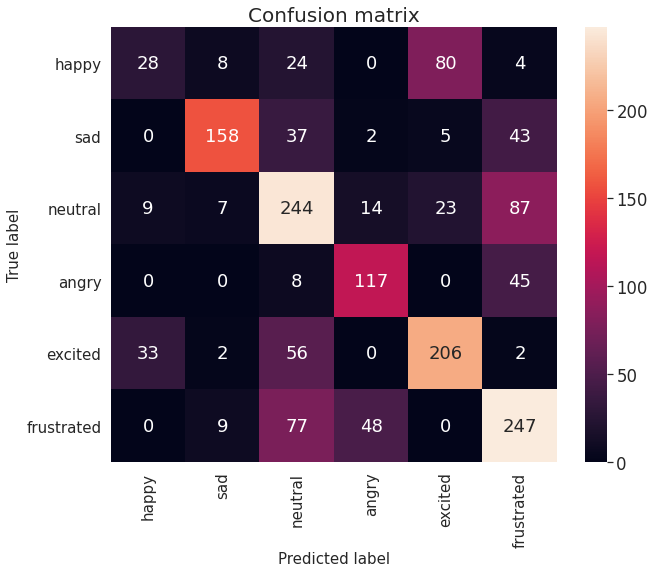

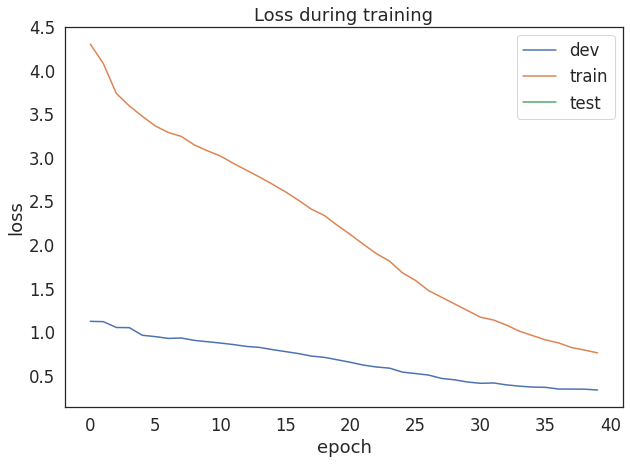

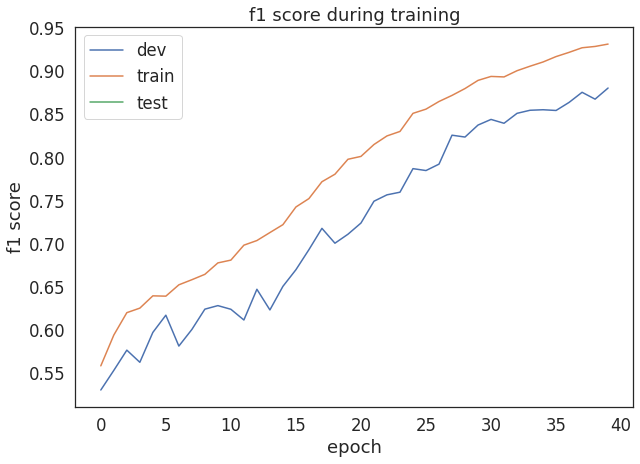

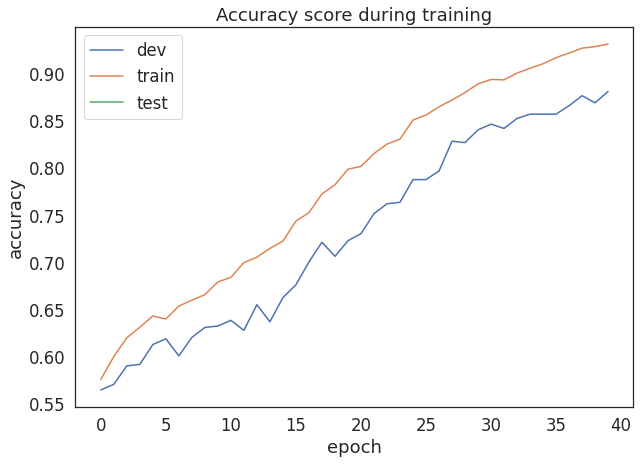

dev: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]

09/11/2021 12:55:46 DEVSET RESULTS: [F1_score: 0.880196] [Loss: 0.329887] [Acc: 0.881024]



test: 100%|██████████| 1/1 [00:03<00:00,  3.69s/it]

09/11/2021 12:55:50 DEVSET RESULTS: [F1_score: 0.610514] [Loss: 1.087773] [Acc: 0.616143]


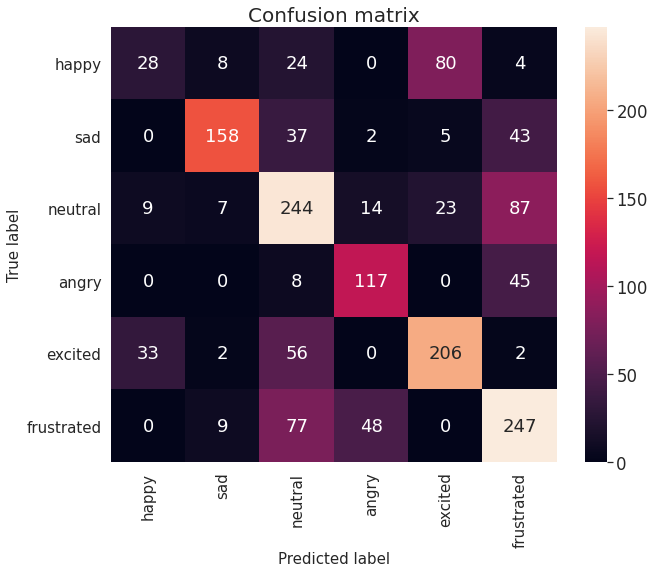

              precision    recall  f1-score   support

       happy       0.40      0.19      0.26       144
         sad       0.86      0.64      0.74       245
     neutral       0.55      0.64      0.59       384
       angry       0.65      0.69      0.67       170
     excited       0.66      0.69      0.67       299
  frustrated       0.58      0.65      0.61       381

    accuracy                           0.62      1623
   macro avg       0.61      0.58      0.59      1623
weighted avg       0.62      0.62      0.61      1623



In [ ]:
for windowsize in ws:
  train_windowsize(exp3=True,windowsize=windowsize)

## DECISION LEVEL

09/11/2021 12:55:50 [TRAINING] Decision Level, [WINDOW SIZE] 0
09/11/2021 12:55:51 Loaded data.
09/11/2021 12:55:51 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

09/11/2021 12:55:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

09/11/2021 12:56:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

09/11/2021 12:56:11 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

09/11/2021 12:56:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

09/11/2021 12:56:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

09/11/2021 12:56:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

09/11/2021 12:56:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

09/11/2021 12:56:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

09/11/2021 12:56:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

09/11/2021 12:57:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

09/11/2021 12:57:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

09/11/2021 12:57:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

09/11/2021 12:57:27 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

09/11/2021 12:57:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

09/11/2021 12:57:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

09/11/2021 12:57:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

09/11/2021 12:58:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

09/11/2021 12:58:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

09/11/2021 12:58:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

09/11/2021 12:58:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

09/11/2021 12:59:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

09/11/2021 12:59:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

09/11/2021 12:59:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

09/11/2021 01:00:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

09/11/2021 01:00:51 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

09/11/2021 01:00:54 [TEST RESULTS] Decision Level, [WINDOW SIZE] 0



test: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


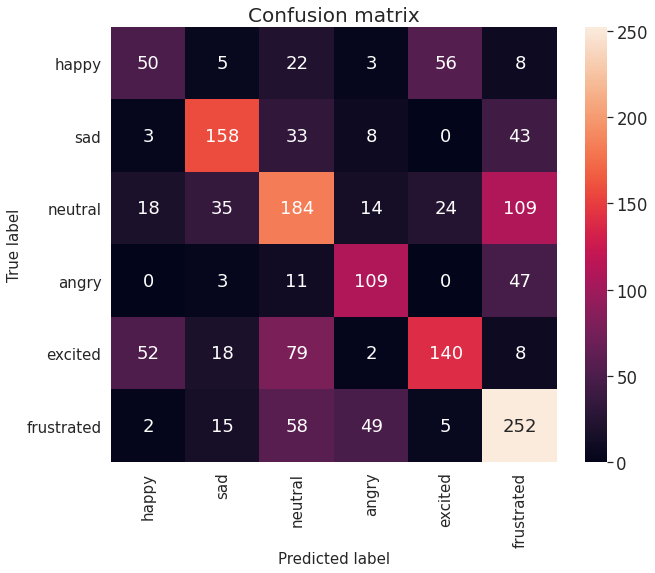

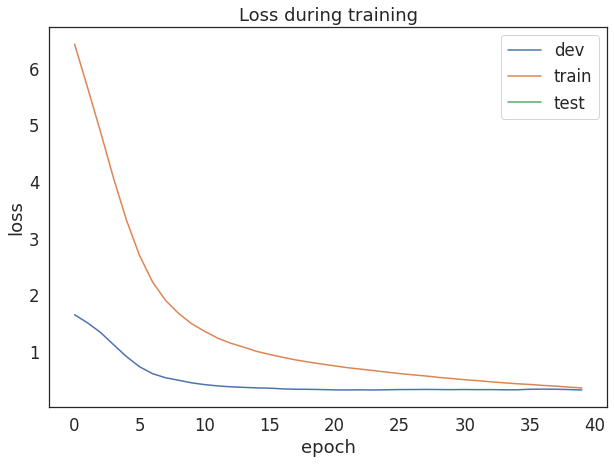

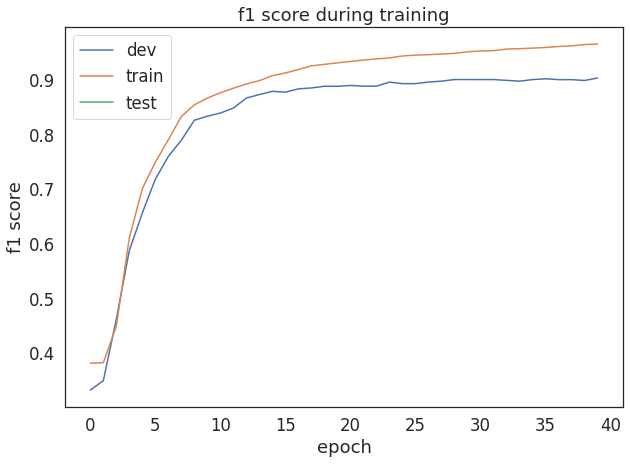

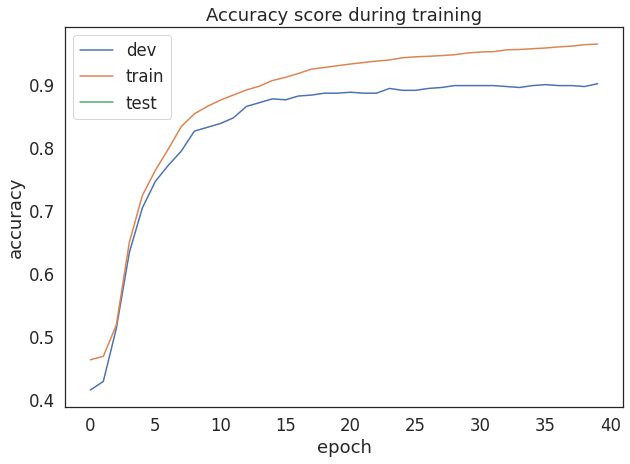

dev: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

09/11/2021 01:00:57 DEVSET RESULTS: [F1_score: 0.902933] [Loss: 0.324509] [Acc: 0.902108]



test: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

09/11/2021 01:00:58 DEVSET RESULTS: [F1_score: 0.547784] [Loss: 1.788880] [Acc: 0.550216]


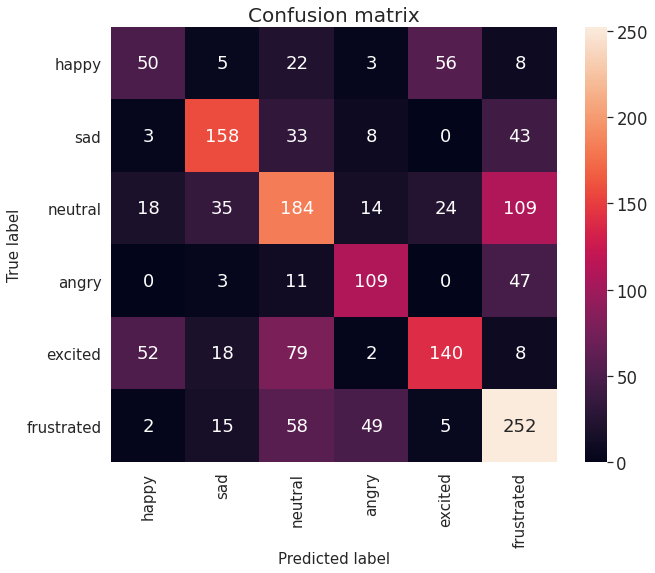

              precision    recall  f1-score   support

       happy       0.40      0.35      0.37       144
         sad       0.68      0.64      0.66       245
     neutral       0.48      0.48      0.48       384
       angry       0.59      0.64      0.61       170
     excited       0.62      0.47      0.53       299
  frustrated       0.54      0.66      0.59       381

    accuracy                           0.55      1623
   macro avg       0.55      0.54      0.54      1623
weighted avg       0.55      0.55      0.55      1623

09/11/2021 01:00:58 [TRAINING] Decision Level, [WINDOW SIZE] 1
09/11/2021 01:00:58 Loaded data.
09/11/2021 01:00:58 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

09/11/2021 01:01:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

09/11/2021 01:01:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

09/11/2021 01:01:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

09/11/2021 01:01:31 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

09/11/2021 01:01:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

09/11/2021 01:01:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

09/11/2021 01:01:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

09/11/2021 01:02:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

09/11/2021 01:02:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

09/11/2021 01:02:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

09/11/2021 01:02:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

09/11/2021 01:02:59 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

09/11/2021 01:03:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

09/11/2021 01:03:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

09/11/2021 01:03:26 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

09/11/2021 01:03:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

09/11/2021 01:03:44 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

09/11/2021 01:03:53 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

09/11/2021 01:04:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

09/11/2021 01:04:11 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

09/11/2021 01:04:20 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

09/11/2021 01:04:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

09/11/2021 01:04:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

09/11/2021 01:04:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

09/11/2021 01:05:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

09/11/2021 01:05:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

09/11/2021 01:05:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

09/11/2021 01:05:32 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

09/11/2021 01:05:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

09/11/2021 01:05:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

09/11/2021 01:05:59 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

09/11/2021 01:06:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

09/11/2021 01:06:44 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

09/11/2021 01:06:57 [TEST RESULTS] Decision Level, [WINDOW SIZE] 1



test: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


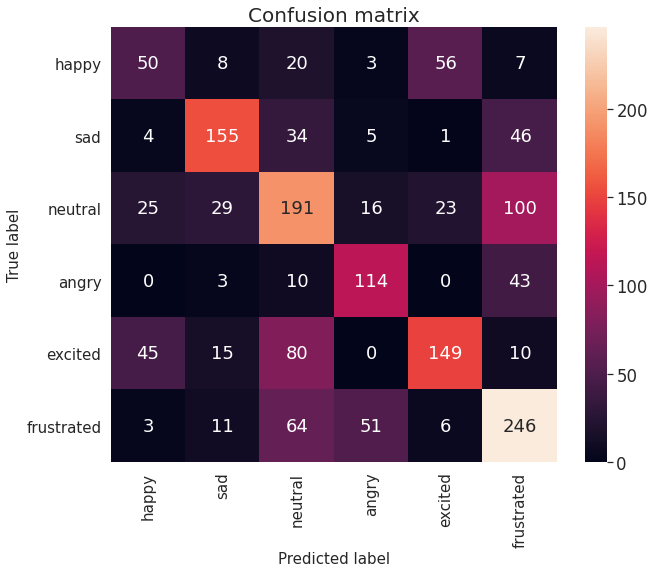

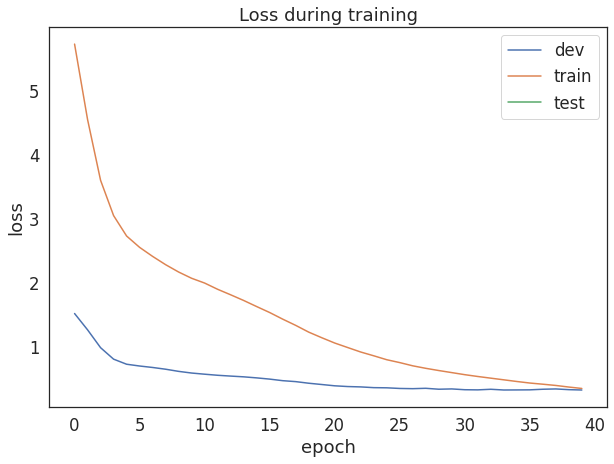

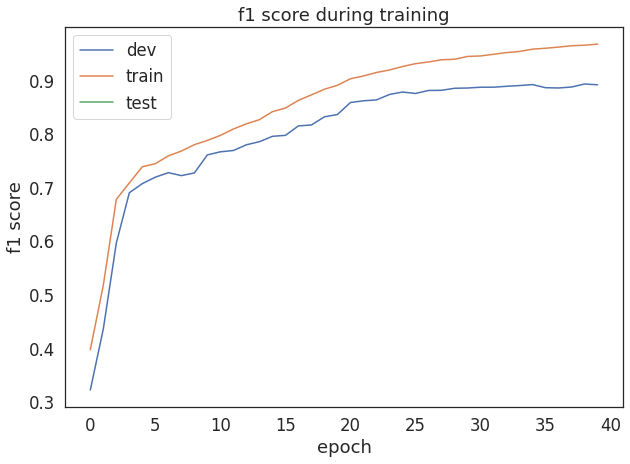

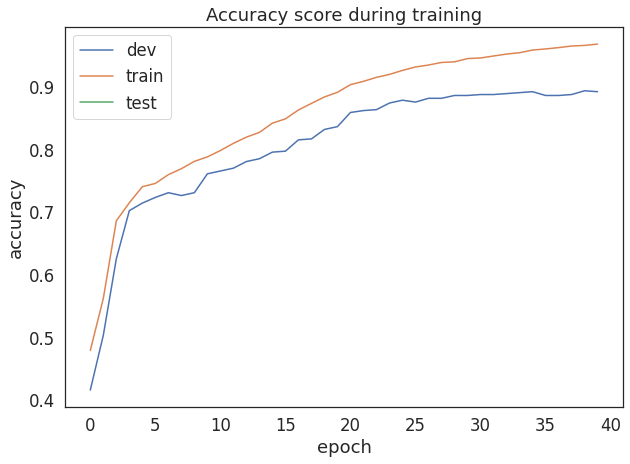

dev: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

09/11/2021 01:07:00 DEVSET RESULTS: [F1_score: 0.893053] [Loss: 0.327719] [Acc: 0.893072]



test: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 01:07:01 DEVSET RESULTS: [F1_score: 0.556572] [Loss: 1.650236] [Acc: 0.557609]


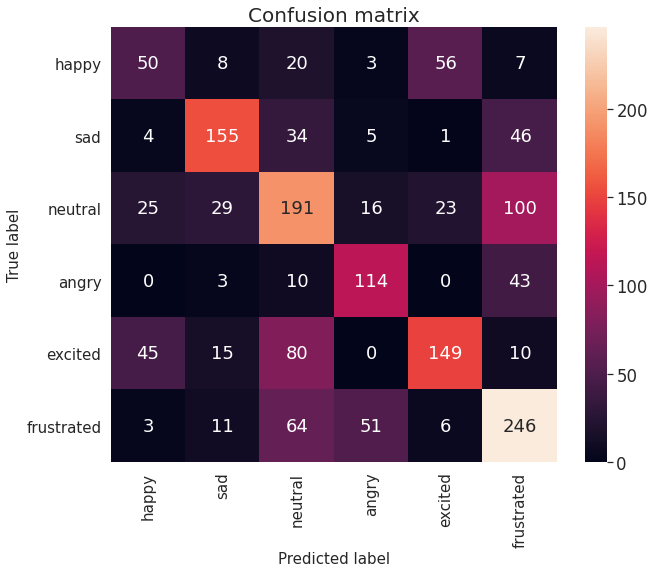

              precision    recall  f1-score   support

       happy       0.39      0.35      0.37       144
         sad       0.70      0.63      0.67       245
     neutral       0.48      0.50      0.49       384
       angry       0.60      0.67      0.64       170
     excited       0.63      0.50      0.56       299
  frustrated       0.54      0.65      0.59       381

    accuracy                           0.56      1623
   macro avg       0.56      0.55      0.55      1623
weighted avg       0.56      0.56      0.56      1623

09/11/2021 01:07:01 [TRAINING] Decision Level, [WINDOW SIZE] 5
09/11/2021 01:07:01 Loaded data.
09/11/2021 01:07:01 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

09/11/2021 01:07:09 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/11/2021 01:07:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 01:07:37 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

09/11/2021 01:07:51 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 01:08:18 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

09/11/2021 01:08:32 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 01:09:00 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

09/11/2021 01:09:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/11/2021 01:09:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

09/11/2021 01:09:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

09/11/2021 01:10:10 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 01:10:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

09/11/2021 01:10:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 01:11:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

09/11/2021 01:11:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

09/11/2021 01:11:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/11/2021 01:12:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

09/11/2021 01:12:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

09/11/2021 01:12:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 01:12:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 01:12:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

09/11/2021 01:13:10 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

09/11/2021 01:13:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 01:13:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 01:13:52 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

09/11/2021 01:14:06 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/11/2021 01:14:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

09/11/2021 01:14:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 01:15:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 01:15:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

09/11/2021 01:15:30 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

09/11/2021 01:15:44 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

09/11/2021 01:15:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 01:16:19 [TEST RESULTS] Decision Level, [WINDOW SIZE] 5



test: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


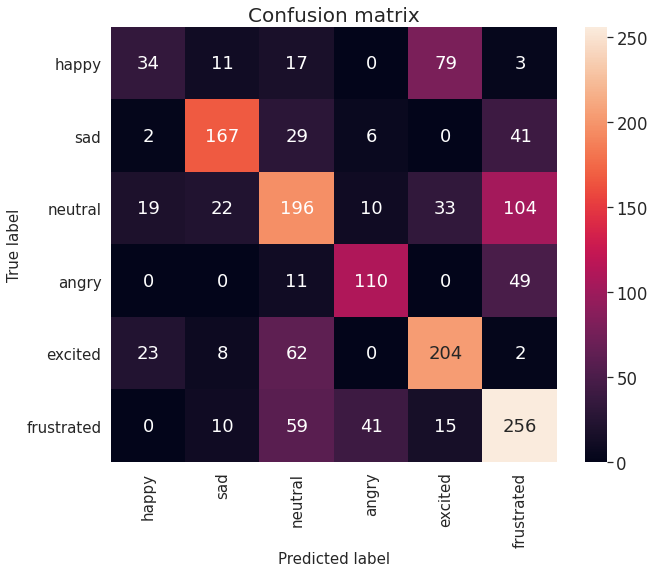

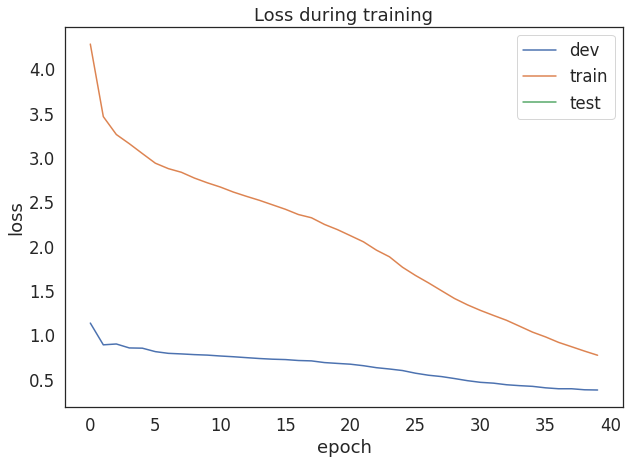

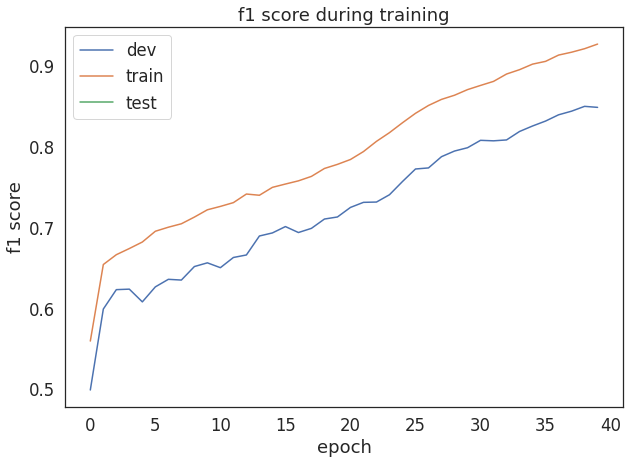

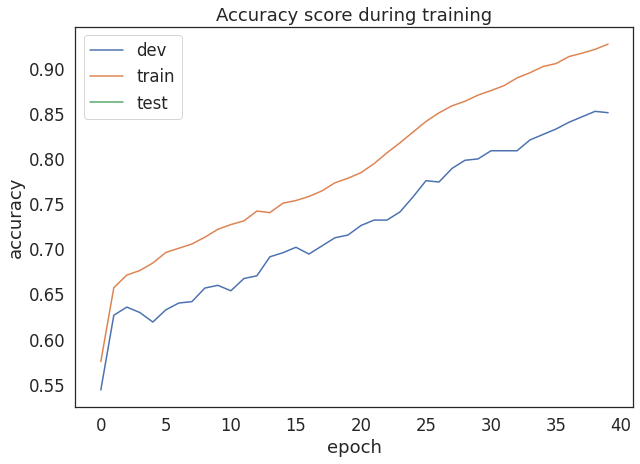

dev: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

09/11/2021 01:16:24 DEVSET RESULTS: [F1_score: 0.849850] [Loss: 0.380215] [Acc: 0.852410]



test: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

09/11/2021 01:16:26 DEVSET RESULTS: [F1_score: 0.589889] [Loss: 1.218787] [Acc: 0.595810]


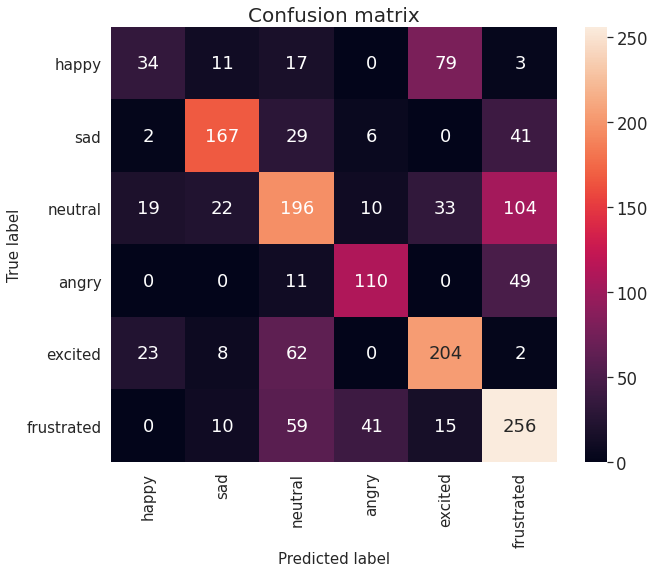

              precision    recall  f1-score   support

       happy       0.44      0.24      0.31       144
         sad       0.77      0.68      0.72       245
     neutral       0.52      0.51      0.52       384
       angry       0.66      0.65      0.65       170
     excited       0.62      0.68      0.65       299
  frustrated       0.56      0.67      0.61       381

    accuracy                           0.60      1623
   macro avg       0.59      0.57      0.58      1623
weighted avg       0.59      0.60      0.59      1623

09/11/2021 01:16:26 [TRAINING] Decision Level, [WINDOW SIZE] 10
09/11/2021 01:16:27 Loaded data.
09/11/2021 01:16:27 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/11/2021 01:16:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/11/2021 01:16:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 01:17:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 01:18:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/11/2021 01:18:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]

09/11/2021 01:19:11 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 01:19:31 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 01:19:50 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 01:20:09 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/11/2021 01:20:48 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/11/2021 01:21:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 01:21:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 01:23:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/11/2021 01:23:24 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 01:24:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 01:24:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/11/2021 01:24:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 01:25:18 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/11/2021 01:25:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

09/11/2021 01:25:57 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 01:26:16 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 01:26:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

09/11/2021 01:26:55 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 01:27:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/11/2021 01:27:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/11/2021 01:27:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]

09/11/2021 01:28:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/11/2021 01:29:11 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

09/11/2021 01:29:21 [TEST RESULTS] Decision Level, [WINDOW SIZE] 10



test: 100%|██████████| 1/1 [00:03<00:00,  3.03s/it]


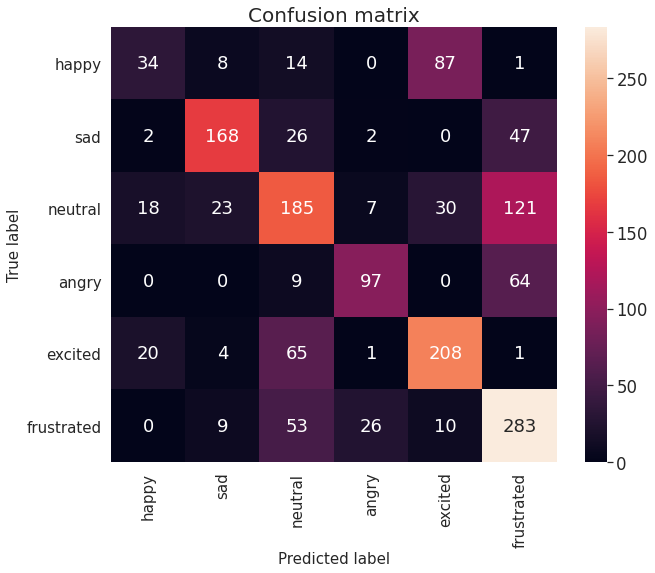

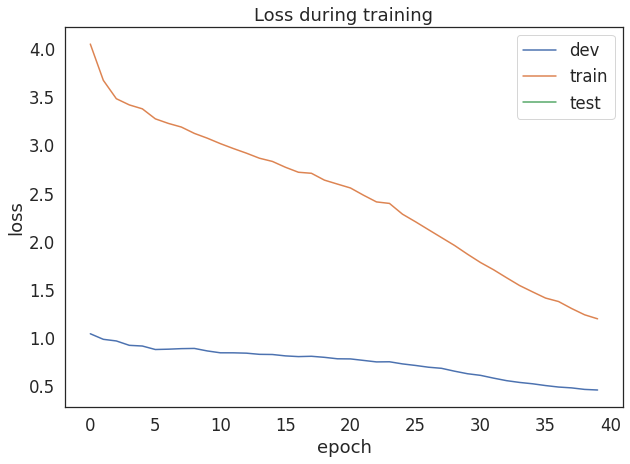

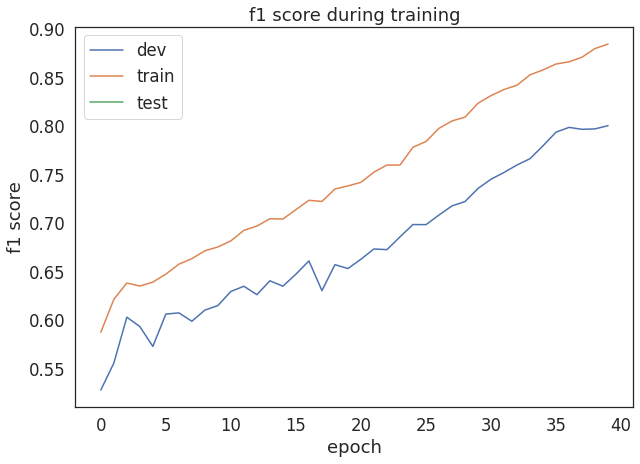

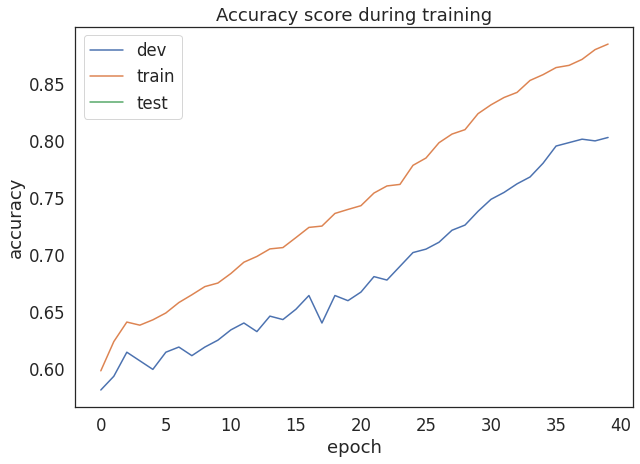

dev: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

09/11/2021 01:29:27 DEVSET RESULTS: [F1_score: 0.800378] [Loss: 0.454875] [Acc: 0.802711]



test: 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]

09/11/2021 01:29:30 DEVSET RESULTS: [F1_score: 0.593510] [Loss: 1.100178] [Acc: 0.600739]


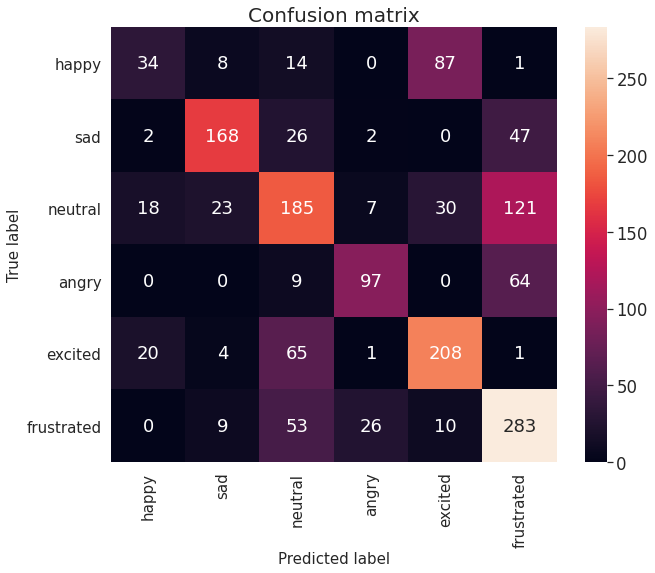

              precision    recall  f1-score   support

       happy       0.46      0.24      0.31       144
         sad       0.79      0.69      0.74       245
     neutral       0.53      0.48      0.50       384
       angry       0.73      0.57      0.64       170
     excited       0.62      0.70      0.66       299
  frustrated       0.55      0.74      0.63       381

    accuracy                           0.60      1623
   macro avg       0.61      0.57      0.58      1623
weighted avg       0.60      0.60      0.59      1623

09/11/2021 01:29:31 [TRAINING] Decision Level, [WINDOW SIZE] 20
09/11/2021 01:29:31 Loaded data.
09/11/2021 01:29:31 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

09/11/2021 01:29:45 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]

09/11/2021 01:30:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

09/11/2021 01:31:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]

09/11/2021 01:32:05 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]

09/11/2021 01:33:02 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]

09/11/2021 01:33:58 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]

09/11/2021 01:36:46 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]

09/11/2021 01:38:39 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]

09/11/2021 01:40:03 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]

09/11/2021 01:41:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

09/11/2021 01:41:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]

09/11/2021 01:42:52 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]

09/11/2021 01:43:20 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.00s/it]

09/11/2021 01:44:16 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]

09/11/2021 01:45:13 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

09/11/2021 01:45:40 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]

09/11/2021 01:46:08 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]

09/11/2021 01:47:04 Save the best model.



dev: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]

09/11/2021 01:47:32 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]

09/11/2021 01:48:16 [TEST RESULTS] Decision Level, [WINDOW SIZE] 20



test: 100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


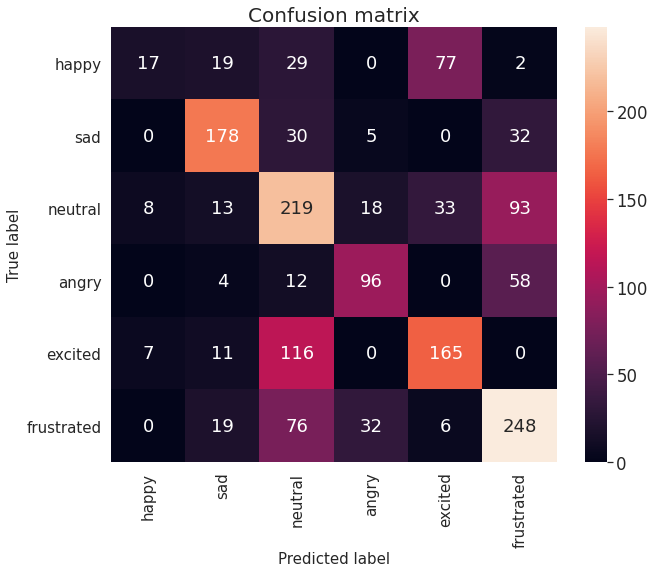

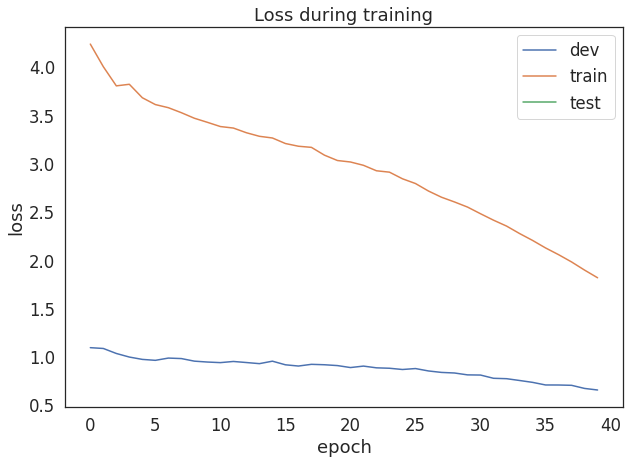

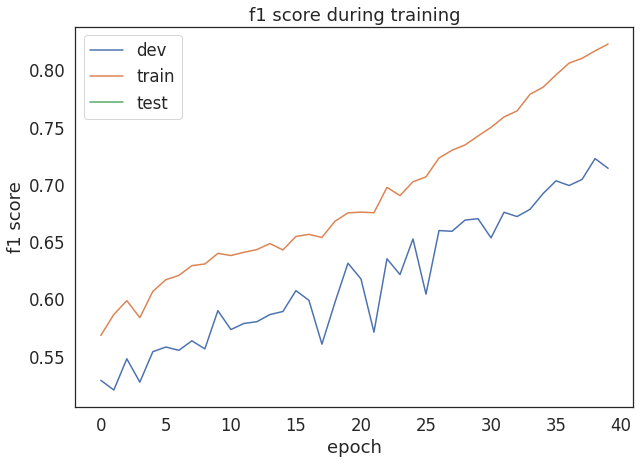

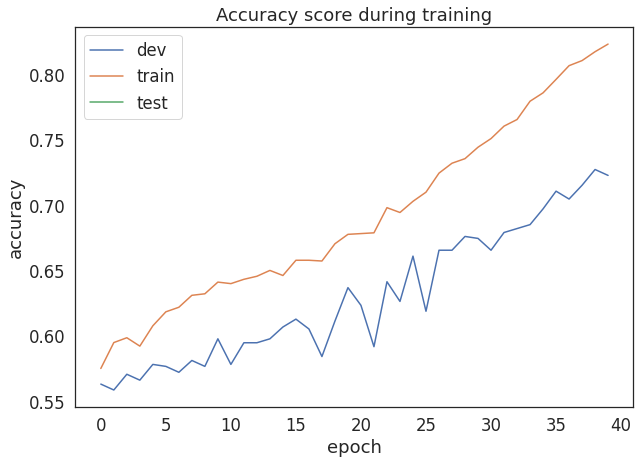

dev: 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]

09/11/2021 01:48:24 DEVSET RESULTS: [F1_score: 0.722635] [Loss: 0.670867] [Acc: 0.727410]



test: 100%|██████████| 1/1 [00:04<00:00,  4.83s/it]

09/11/2021 01:48:29 DEVSET RESULTS: [F1_score: 0.557215] [Loss: 1.068479] [Acc: 0.568700]


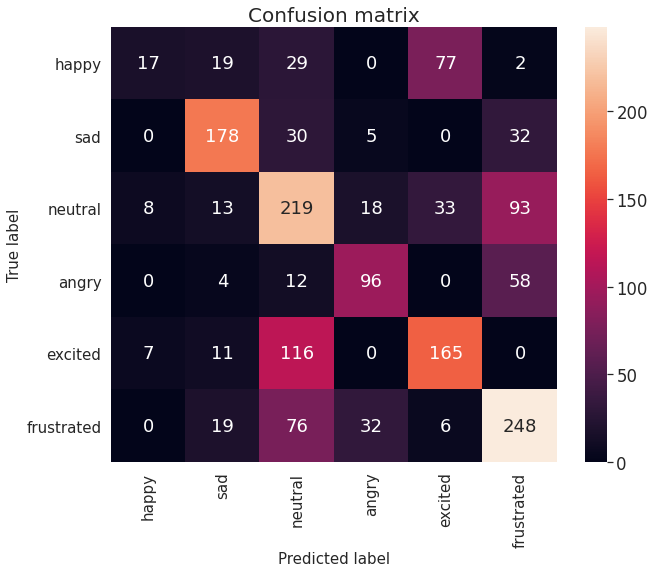

              precision    recall  f1-score   support

       happy       0.53      0.12      0.19       144
         sad       0.73      0.73      0.73       245
     neutral       0.45      0.57      0.51       384
       angry       0.64      0.56      0.60       170
     excited       0.59      0.55      0.57       299
  frustrated       0.57      0.65      0.61       381

    accuracy                           0.57      1623
   macro avg       0.59      0.53      0.53      1623
weighted avg       0.57      0.57      0.56      1623



In [ ]:
for windowsize in ws:
  train_windowsize(decision_level=True,windowsize=windowsize)

# MODALITIES VARIATION

## EARLY FUSION

###AUDIO

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, audio_only=True)

In [ ]:
coach = main(args)

09/11/2021 10:27:18 Loaded data.
09/11/2021 10:27:18 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 10:27:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

09/11/2021 10:27:51 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 10:28:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/11/2021 10:28:17 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/11/2021 10:28:30 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

09/11/2021 10:28:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

09/11/2021 10:28:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

09/11/2021 10:30:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

09/11/2021 10:31:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/11/2021 10:32:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

09/11/2021 10:34:49 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 10:35:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


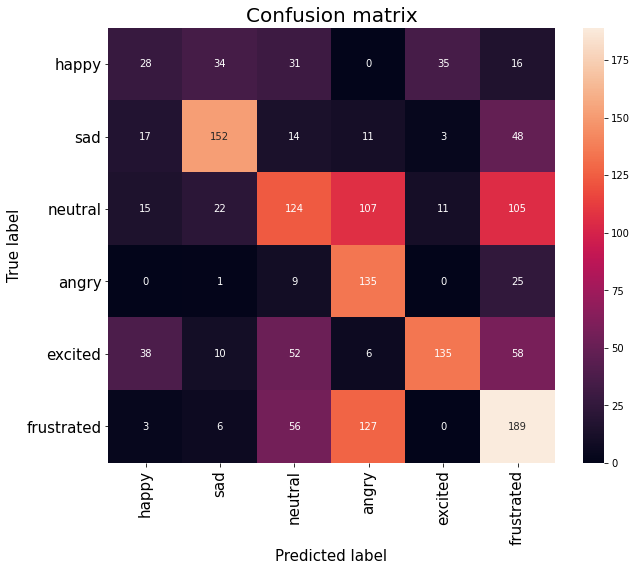

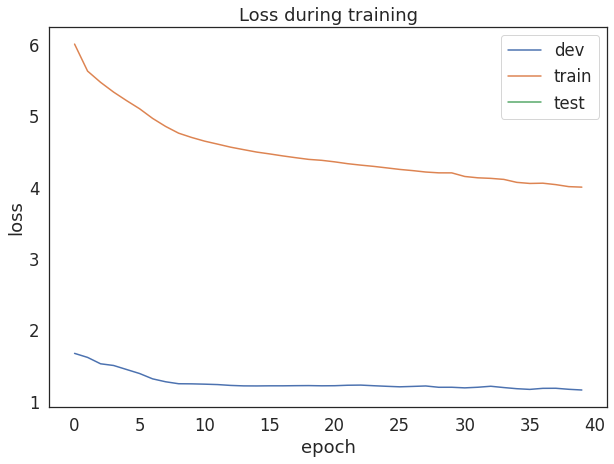

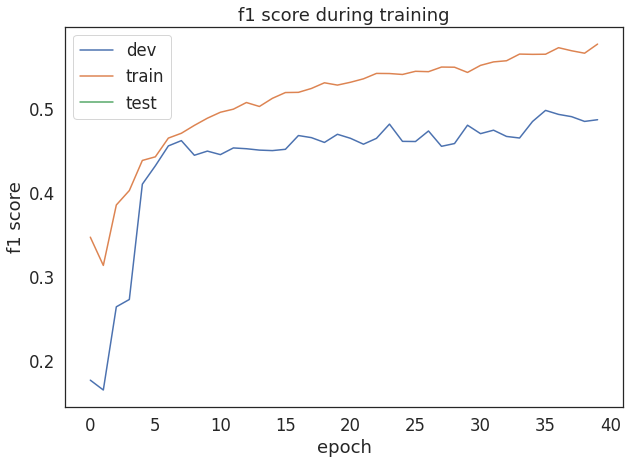

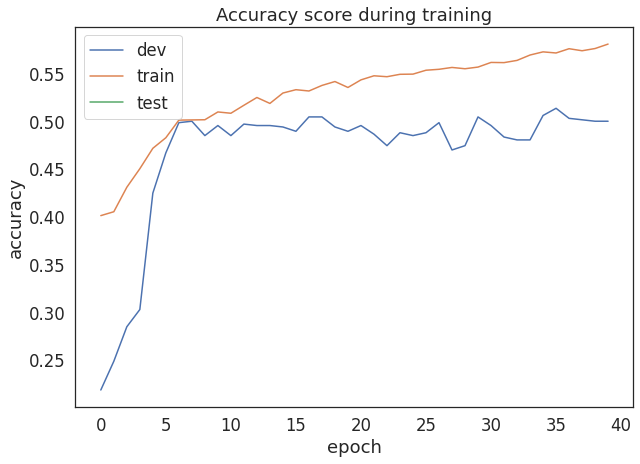

dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/11/2021 10:36:07 DEVSET RESULTS: [F1_score: 0.497732] [Loss: 1.168851] [Acc: 0.513554]



test: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]

09/11/2021 10:36:09 DEVSET RESULTS: [F1_score: 0.467296] [Loss: 1.253680] [Acc: 0.470117]


(array([2, 5, 5, ..., 1, 1, 1]), array([3, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

###VIDEO

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, vid_only=True )

In [ ]:
coach = main(args)

09/11/2021 10:36:09 Loaded data.
09/11/2021 10:36:09 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 10:36:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 10:36:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

09/11/2021 10:36:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

09/11/2021 10:37:22 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 10:37:36 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/11/2021 10:37:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 10:38:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

09/11/2021 10:38:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 10:38:29 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 10:38:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 10:38:56 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 10:39:09 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/11/2021 10:39:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

09/11/2021 10:39:49 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

09/11/2021 10:40:03 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 10:40:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 10:40:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

09/11/2021 10:41:09 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


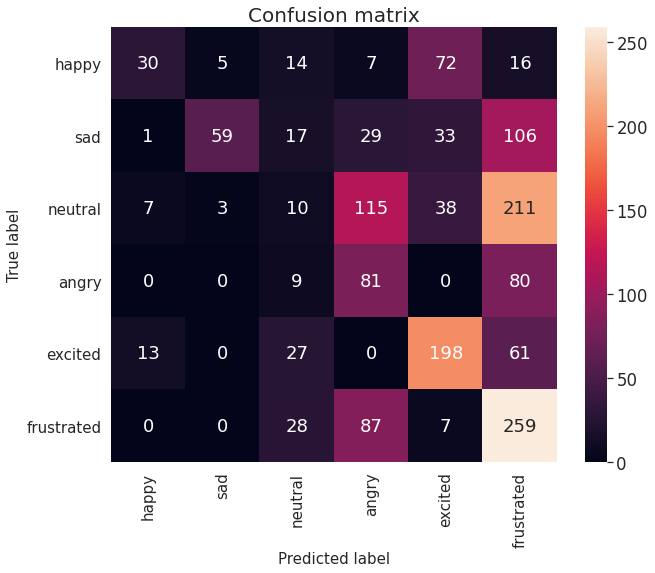

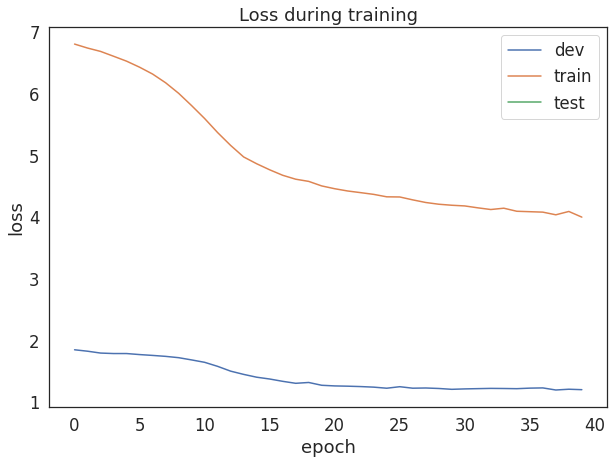

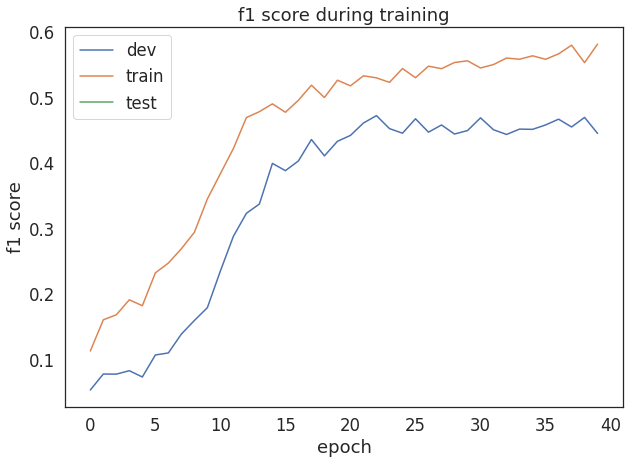

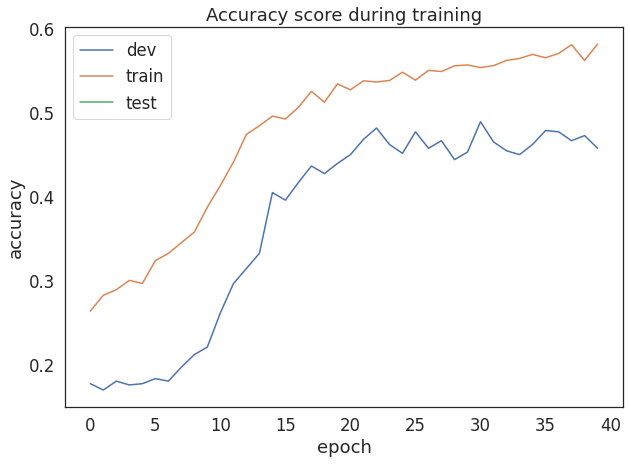

dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 10:45:06 DEVSET RESULTS: [F1_score: 0.471746] [Loss: 1.247175] [Acc: 0.481928]



test: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]

09/11/2021 10:45:09 DEVSET RESULTS: [F1_score: 0.350683] [Loss: 1.538475] [Acc: 0.392483]


(array([2, 5, 5, ..., 1, 1, 1]), array([3, 5, 2, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

###ADUIOTEXT

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, audiotext=True)

In [ ]:
coach = main(args)

09/11/2021 10:45:09 Loaded data.
09/11/2021 10:45:09 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 10:45:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

09/11/2021 10:45:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 10:45:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/11/2021 10:46:07 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

09/11/2021 10:46:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

09/11/2021 10:46:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 10:46:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 10:47:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 10:47:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 10:47:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

09/11/2021 10:47:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

09/11/2021 10:47:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 10:48:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

09/11/2021 10:48:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/11/2021 10:48:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 10:48:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 10:49:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 10:49:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

09/11/2021 10:49:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

09/11/2021 10:49:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 10:49:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

09/11/2021 10:50:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

09/11/2021 10:50:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/11/2021 10:50:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 10:50:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 10:51:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/11/2021 10:51:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 10:51:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

09/11/2021 10:51:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 10:52:09 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

09/11/2021 10:52:22 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 10:52:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

09/11/2021 10:52:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 10:53:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 10:53:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 10:53:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

09/11/2021 10:53:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

09/11/2021 10:53:54 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


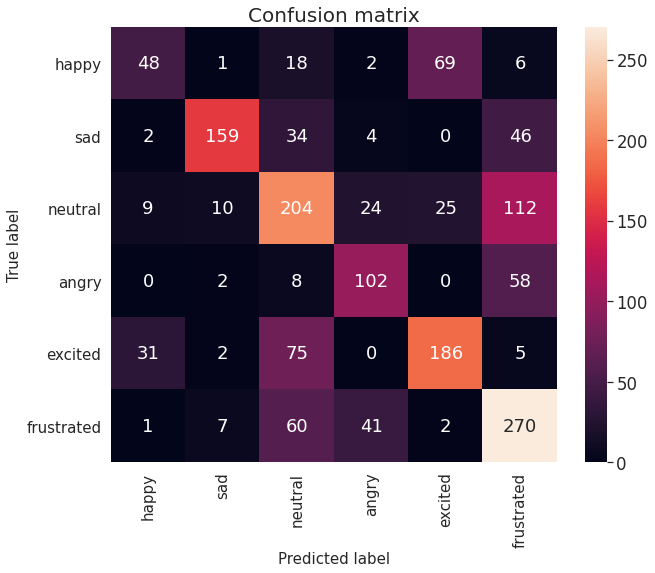

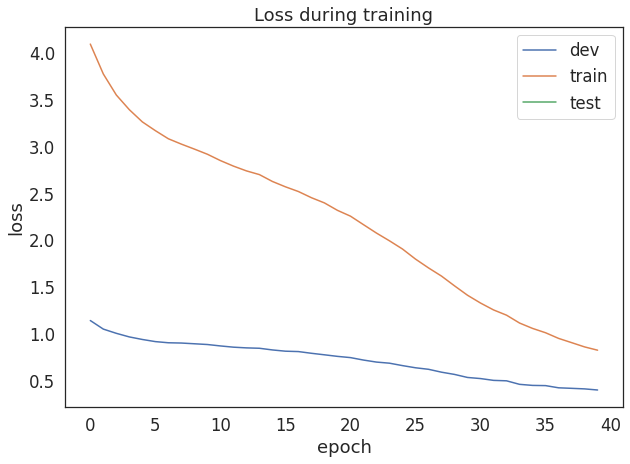

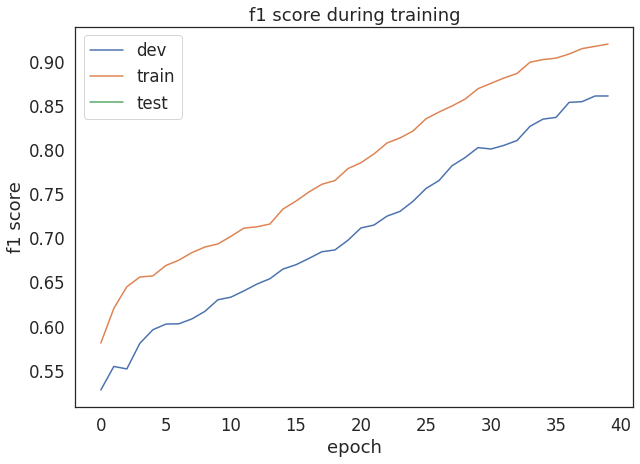

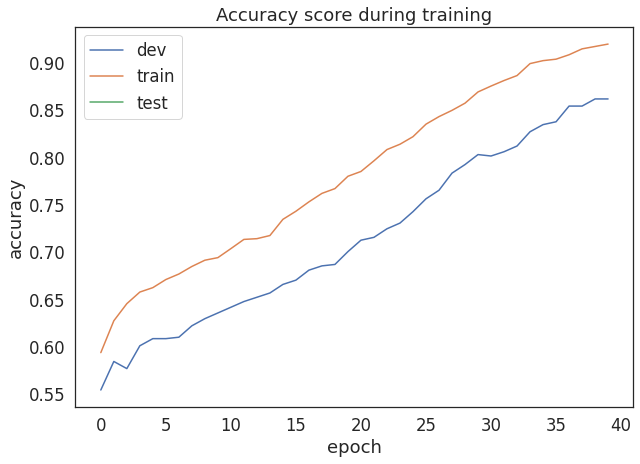

dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 10:54:06 DEVSET RESULTS: [F1_score: 0.860646] [Loss: 0.395590] [Acc: 0.861446]



test: 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]

09/11/2021 10:54:08 DEVSET RESULTS: [F1_score: 0.596847] [Loss: 1.212686] [Acc: 0.597043]


(array([2, 5, 5, ..., 1, 1, 1]), array([2, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

###AUDIOVIDEO

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, audiovid=True)

In [ ]:
coach = main(args)

09/11/2021 10:54:09 Loaded data.
09/11/2021 10:54:09 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

09/11/2021 10:54:16 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

09/11/2021 10:54:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 10:54:59 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 10:55:12 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

09/11/2021 10:55:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 10:55:55 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 10:56:09 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

09/11/2021 10:56:23 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 10:56:51 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 10:57:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

09/11/2021 10:57:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 10:57:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

09/11/2021 10:58:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

09/11/2021 10:58:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 10:58:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

09/11/2021 10:58:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 10:59:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/11/2021 11:00:22 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 11:02:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


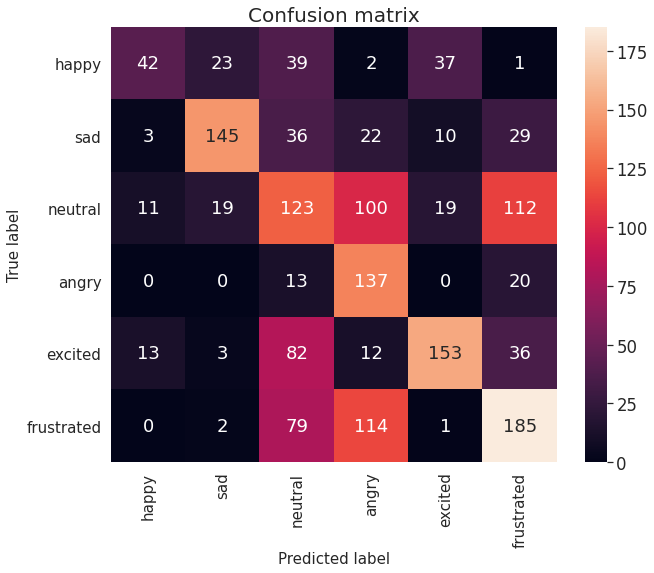

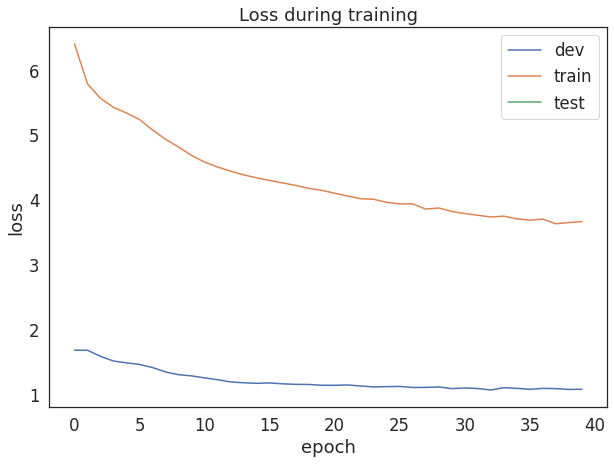

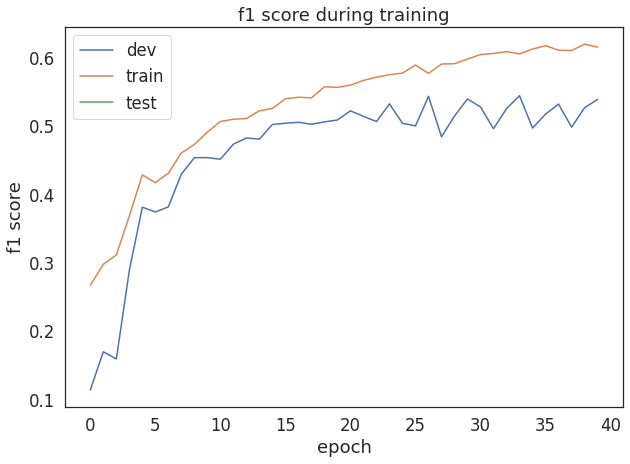

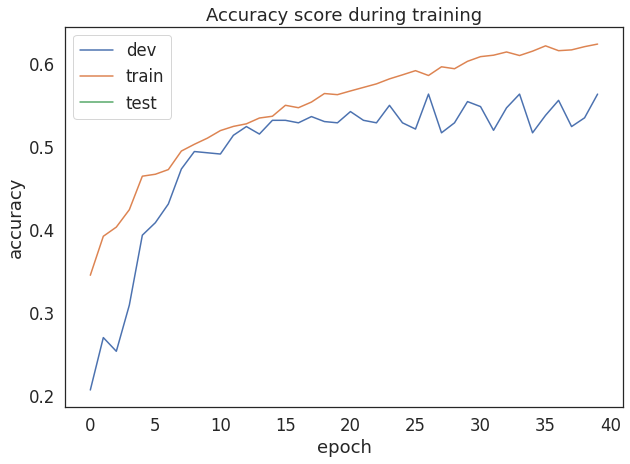

dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

09/11/2021 11:03:38 DEVSET RESULTS: [F1_score: 0.543809] [Loss: 1.104427] [Acc: 0.563253]



test: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]

09/11/2021 11:03:41 DEVSET RESULTS: [F1_score: 0.485988] [Loss: 1.239631] [Acc: 0.483672]


(array([2, 5, 5, ..., 1, 1, 1]), array([5, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

###TEXTVID

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, multim=False, textvid=True)

In [ ]:
coach = main(args)

09/11/2021 11:03:41 Loaded data.
09/11/2021 11:03:41 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 11:03:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

09/11/2021 11:04:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 11:05:38 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

09/11/2021 11:06:06 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:06:21 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 11:06:34 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:07:03 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

09/11/2021 11:07:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

09/11/2021 11:07:30 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

09/11/2021 11:08:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 11:08:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/11/2021 11:08:55 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/11/2021 11:09:09 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

09/11/2021 11:09:37 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

09/11/2021 11:09:51 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/11/2021 11:10:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

09/11/2021 11:10:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

09/11/2021 11:10:33 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

09/11/2021 11:11:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:11:14 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

09/11/2021 11:11:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

09/11/2021 11:11:56 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 11:12:10 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

09/11/2021 11:12:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

09/11/2021 11:12:37 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


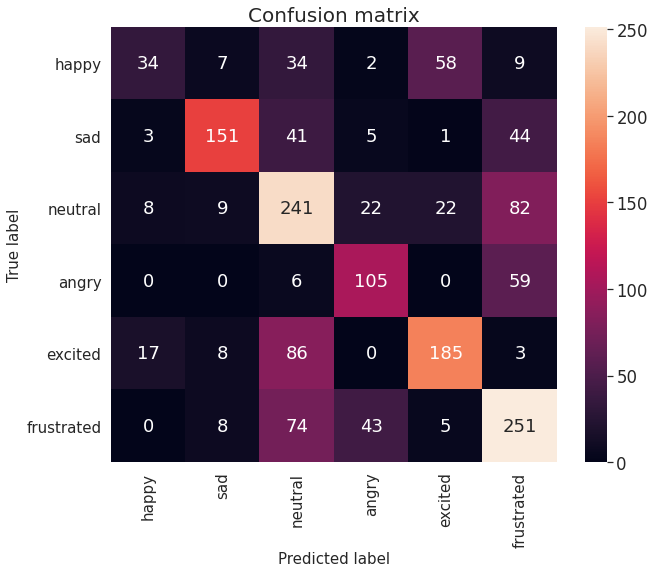

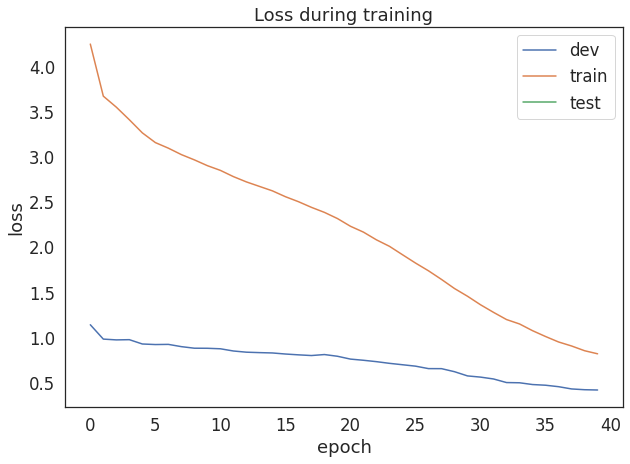

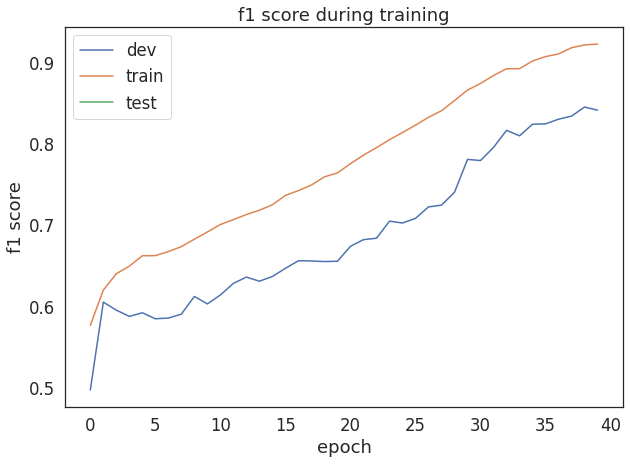

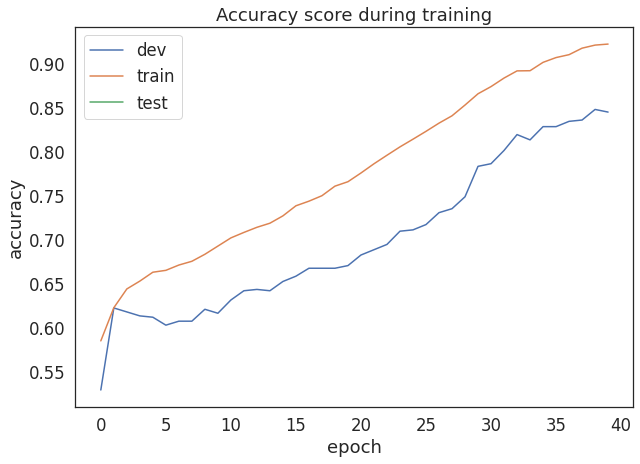

dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 11:13:04 DEVSET RESULTS: [F1_score: 0.844891] [Loss: 0.418516] [Acc: 0.847892]



test: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]

09/11/2021 11:13:06 DEVSET RESULTS: [F1_score: 0.592618] [Loss: 1.155150] [Acc: 0.595810]


(array([2, 5, 5, ..., 1, 1, 1]), array([2, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

##EXTERNAL CONTEXT ENCODER

###A+T

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, exp3=True, audiotext=True)

In [ ]:
coach = main(args)

09/11/2021 11:13:06 Loaded data.
09/11/2021 11:13:06 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:13:15 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:13:30 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

09/11/2021 11:13:46 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 11:14:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 11:14:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:14:31 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:14:46 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:15:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 11:15:17 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:15:47 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:16:03 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:16:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:16:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:17:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

09/11/2021 11:17:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/11/2021 11:17:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:17:50 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 11:18:05 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:18:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:18:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:18:52 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 11:19:07 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:19:22 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/11/2021 11:19:38 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:19:53 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:20:09 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:20:40 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/11/2021 11:21:10 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:21:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

09/11/2021 11:21:41 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:21:57 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:22:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

09/11/2021 11:22:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 11:22:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:22:58 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:23:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


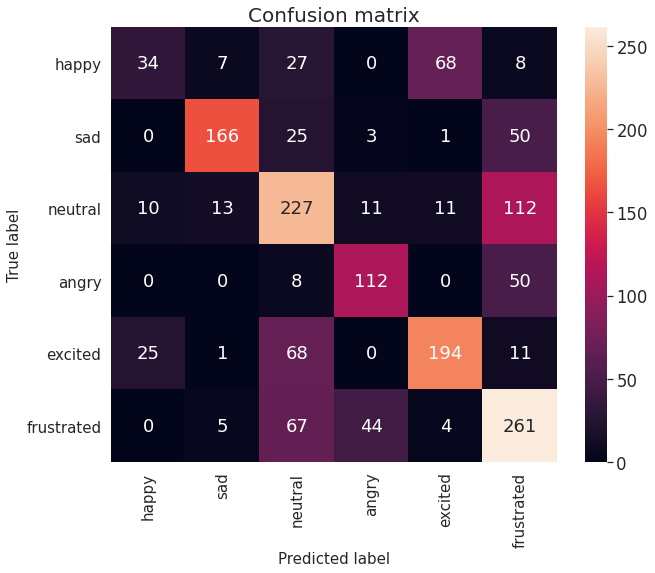

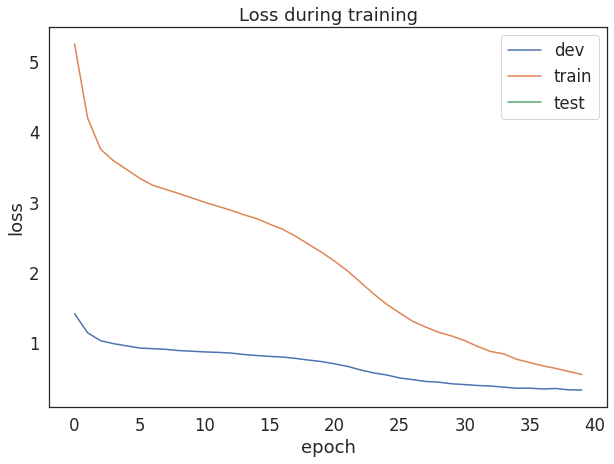

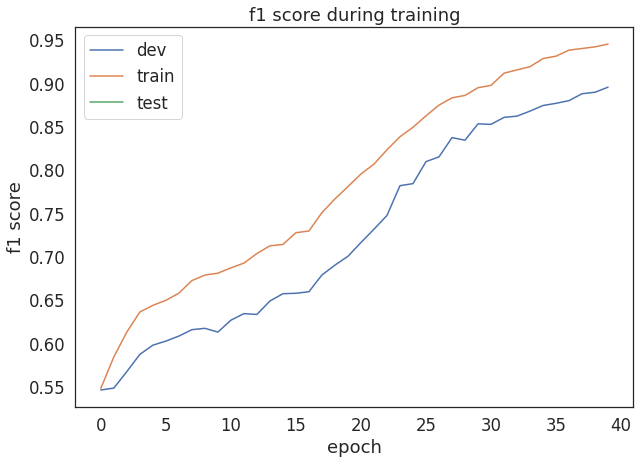

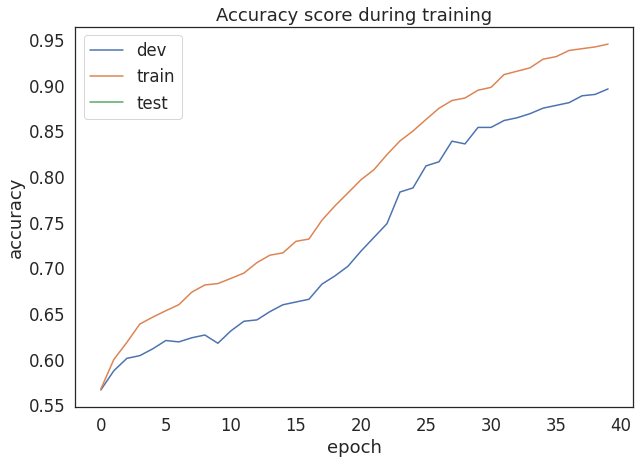

dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 11:23:26 DEVSET RESULTS: [F1_score: 0.895590] [Loss: 0.331144] [Acc: 0.896084]



test: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]

09/11/2021 11:23:28 DEVSET RESULTS: [F1_score: 0.609536] [Loss: 1.362190] [Acc: 0.612446]


(array([2, 5, 5, ..., 1, 1, 1]), array([2, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

###T+V

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, exp3=True, textvid=True)

In [ ]:
coach = main(args)

09/11/2021 11:23:29 Loaded data.
09/11/2021 11:23:29 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:23:37 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 11:23:52 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:24:07 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/11/2021 11:24:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 11:24:39 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 11:24:54 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:25:10 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:25:25 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/11/2021 11:25:40 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:26:28 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

09/11/2021 11:26:43 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:26:58 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:27:29 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:27:45 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:28:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:28:31 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:28:46 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:29:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 11:29:18 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:29:33 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:29:48 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:30:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

09/11/2021 11:30:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

09/11/2021 11:30:35 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 11:30:50 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

09/11/2021 11:31:05 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 11:31:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

09/11/2021 11:31:36 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

09/11/2021 11:31:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 11:32:07 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 11:32:23 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:32:38 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:32:53 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:33:08 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 11:33:24 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


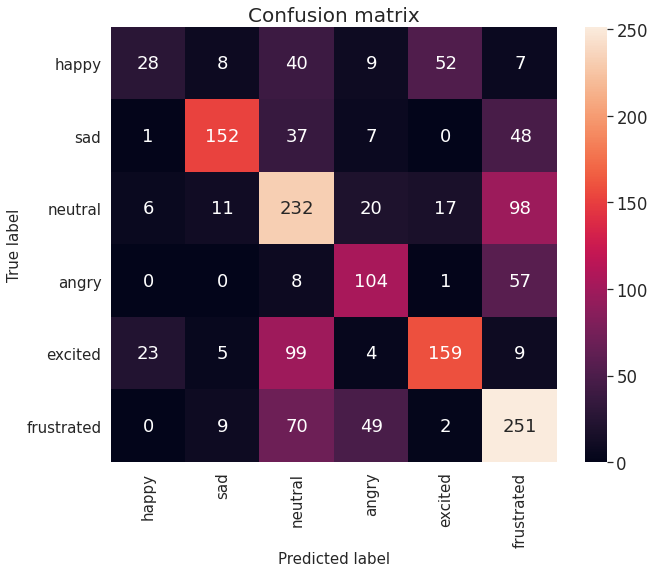

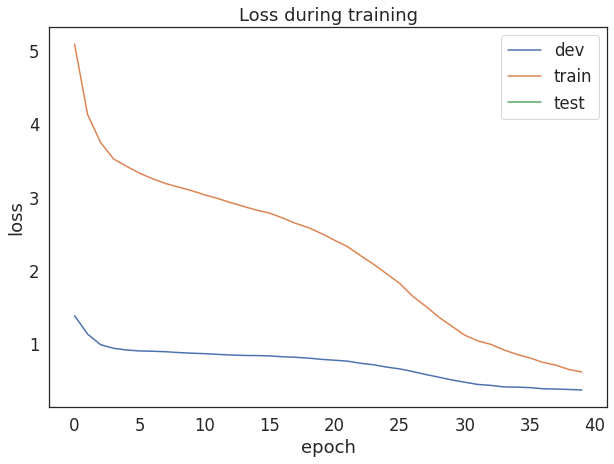

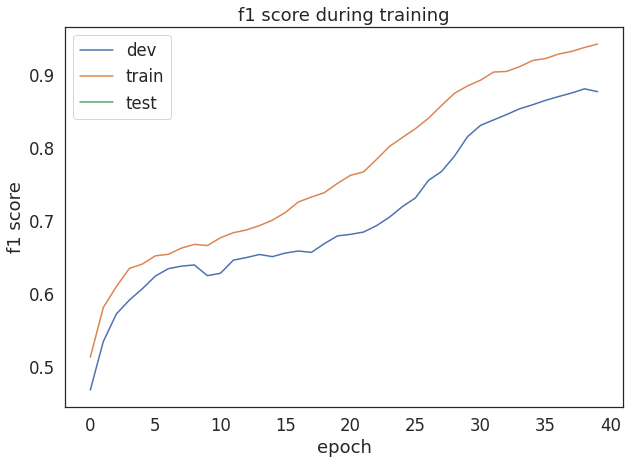

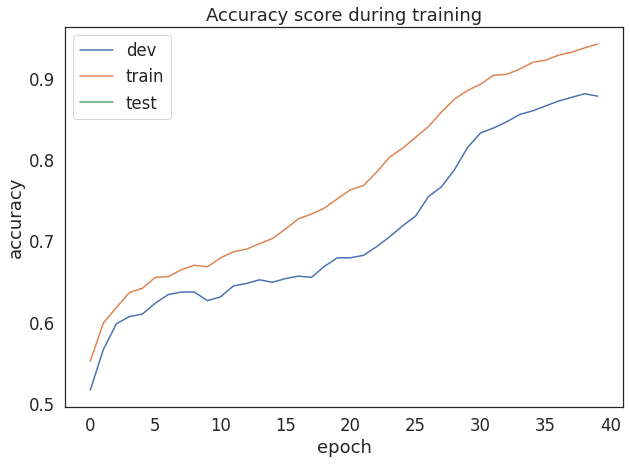

dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:33:52 DEVSET RESULTS: [F1_score: 0.880802] [Loss: 0.376005] [Acc: 0.881024]



test: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]

09/11/2021 11:33:54 DEVSET RESULTS: [F1_score: 0.566537] [Loss: 1.453160] [Acc: 0.570548]


(array([2, 5, 5, ..., 1, 1, 1]), array([2, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

## DECISION LEVEL

###A+T

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, decision_level=True, audiotext=True)

In [ ]:
coach = main(args)

09/11/2021 11:33:55 Loaded data.
09/11/2021 11:33:55 Start training...


dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 11:34:02 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 11:34:17 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:34:47 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/11/2021 11:35:17 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

09/11/2021 11:35:32 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

09/11/2021 11:36:16 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:37:01 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 11:37:15 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 11:38:00 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:39:13 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 11:39:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:39:43 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 11:40:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:40:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

09/11/2021 11:41:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

09/11/2021 11:41:27 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:42:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:42:27 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

09/11/2021 11:42:42 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

09/11/2021 11:42:57 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:43:12 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:43:26 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 11:43:41 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


test: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


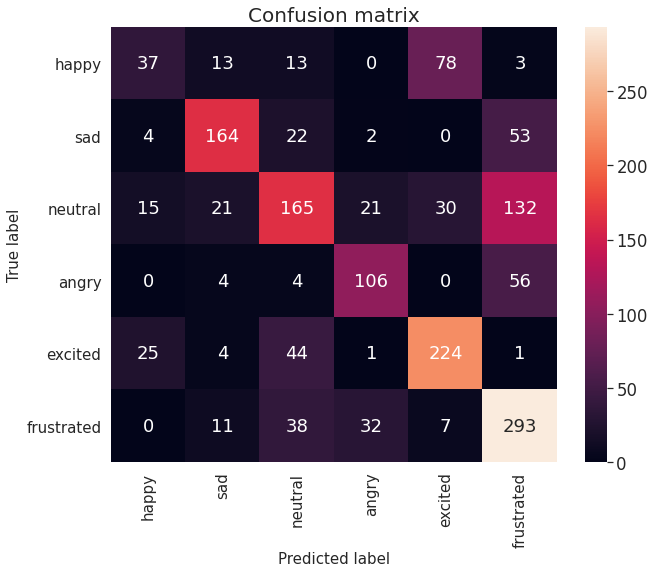

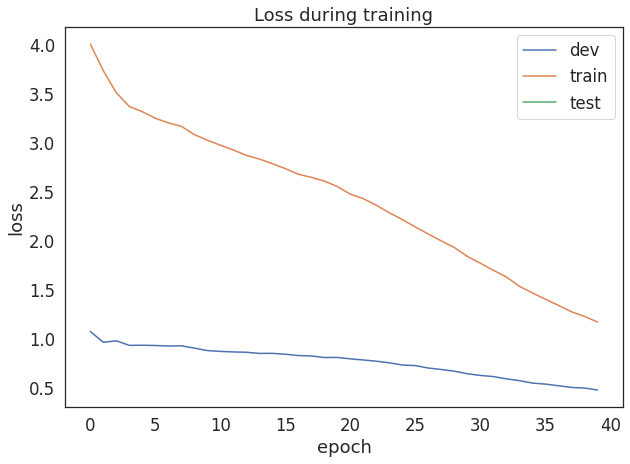

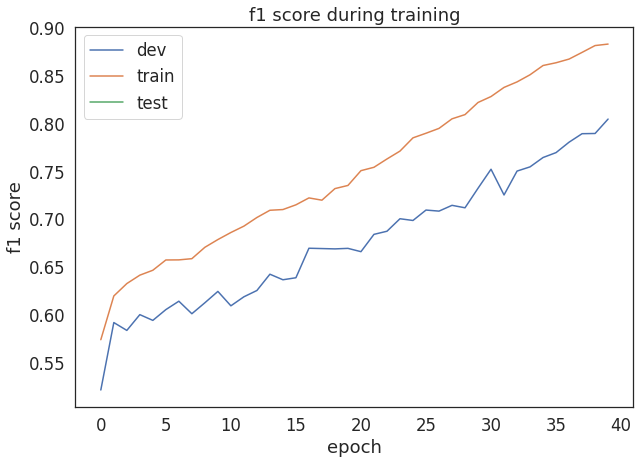

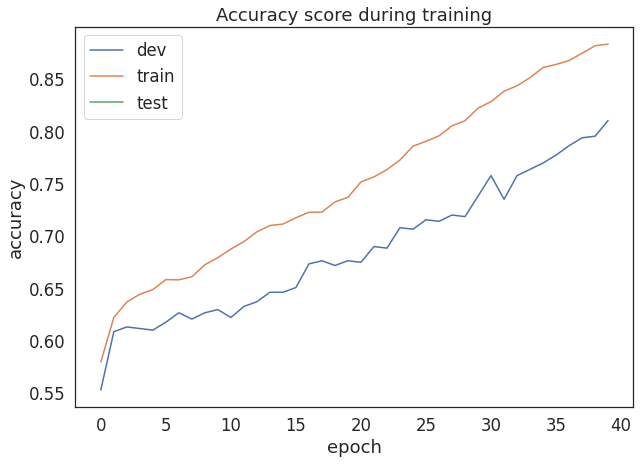

dev: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

09/11/2021 11:43:55 DEVSET RESULTS: [F1_score: 0.804669] [Loss: 0.478014] [Acc: 0.810241]



test: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]

09/11/2021 11:43:57 DEVSET RESULTS: [F1_score: 0.598822] [Loss: 1.114122] [Acc: 0.609365]


(array([2, 5, 5, ..., 1, 1, 1]), array([2, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

###T+V

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, decision_level=True, textvid=True)

In [ ]:
coach = main(args)

09/11/2021 11:43:57 Loaded data.
09/11/2021 11:43:57 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

09/11/2021 11:44:05 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

09/11/2021 11:44:20 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:46:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

09/11/2021 11:47:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:47:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

09/11/2021 11:48:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:48:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

09/11/2021 11:48:49 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 11:49:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

09/11/2021 11:49:34 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

09/11/2021 11:49:49 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

09/11/2021 11:51:04 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 11:51:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

09/11/2021 11:51:34 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/11/2021 11:52:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

09/11/2021 11:52:19 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

09/11/2021 11:52:34 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

09/11/2021 11:53:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

09/11/2021 11:53:19 Save the best model.



dev: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


test: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


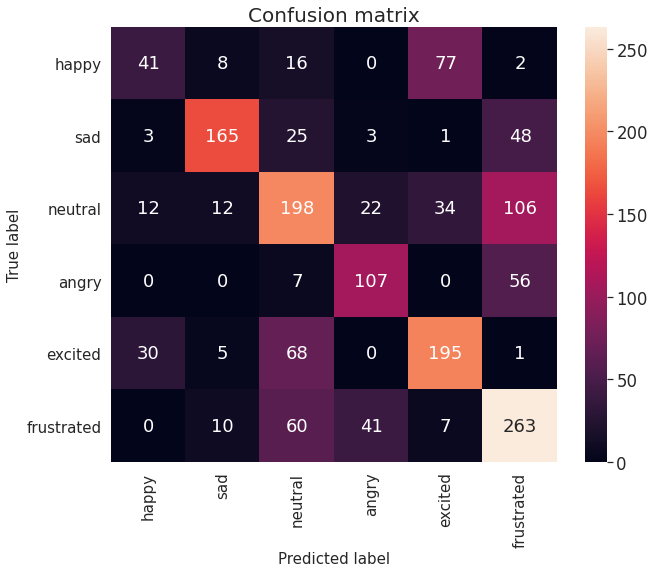

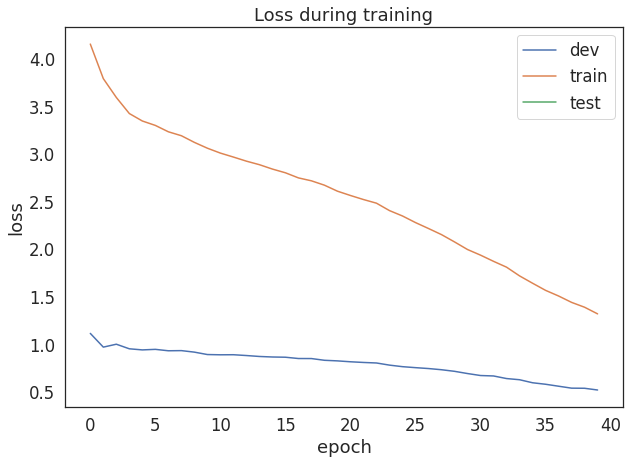

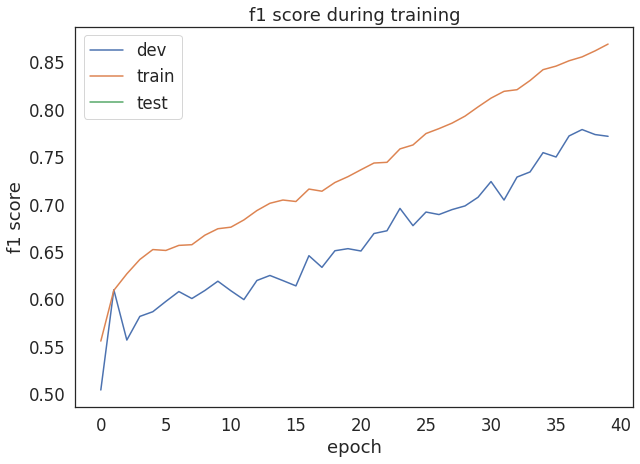

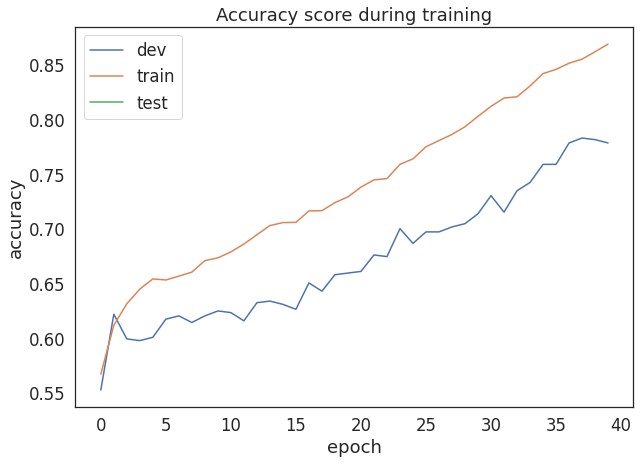

dev: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

09/11/2021 11:54:02 DEVSET RESULTS: [F1_score: 0.778713] [Loss: 0.540666] [Acc: 0.783133]



test: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]

09/11/2021 11:54:05 DEVSET RESULTS: [F1_score: 0.593823] [Loss: 1.086952] [Acc: 0.597043]


(array([2, 5, 5, ..., 1, 1, 1]), array([5, 5, 5, ..., 1, 1, 1]))

In [ ]:
evaluate_model(coach)

### A+V

In [ ]:
args = arguments(data='/.../data_split.pickle', rnn = 'gru', epochs = 40, drop_rate=0.4, weight_decay=0.0, batch_size = 32, learning_rate = 0.0003, decision_level=True, audiovid=True)

In [ ]:
coach = main(args)

09/11/2021 02:59:54 Loaded data.
09/11/2021 02:59:54 Start training...


dev: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

09/11/2021 03:00:04 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

09/11/2021 03:00:21 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 03:00:38 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 03:00:55 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/11/2021 03:01:28 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

09/11/2021 03:01:45 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

09/11/2021 03:02:02 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

09/11/2021 03:02:18 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 03:02:35 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/11/2021 03:02:52 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

09/11/2021 03:03:08 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/11/2021 03:03:42 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

09/11/2021 03:06:14 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

09/11/2021 03:09:01 Save the best model.



dev: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]
